In [1]:
import sys
print(sys.version)
import os

! eups list -s | grep pfs_pipe2d

ipynb_path = os.path.dirname(os.path.realpath("__file__"))
ipynb_path

3.7.2 (default, Dec 29 2018, 06:19:36) 
[GCC 7.3.0]
pfs_pipe2d            w.2022.17  	current setup


'/home/neven'

In [2]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import os
import numpy as np
import scipy
import scipy.optimize
import time
import pandas as pd
import warnings

import psycopg2

from pfs.utils.fiberids import FiberIds  

# %matplotlib widget
%matplotlib inline
import matplotlib

import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.legend_handler import HandlerPatch
np.set_printoptions(suppress=True)

plt.rcParams["figure.facecolor"] = "white"
plt.rcParams['figure.figsize'] = (14, 10)
matplotlib.rcParams.update({'font.size': 10})

%load_ext autoreload
%autoreload 2


In [3]:
conn = psycopg2.connect("dbname='opdb' host='pfsa-db01' port=5432 user='pfs' password=2394f4s3d") 

In [4]:
work_directory = '/work/ncaplar/BlackDotsData/'

In [5]:
def getCobraGeometry(cobra_geometry_calib_id=None):
    if not cobra_geometry_calib_id:
        with conn:
             tmp = pd.read_sql(f'''
                SELECT DISTINCT 
                    max(cobra_geometry_calib_id) as cobra_geometry_calib_id
                FROM cobra_geometry_calib
                ''', conn)

        cobra_geometry_calib_id = tmp.cobra_geometry_calib_id[0]

    with conn:
        cobra_geometry = pd.read_sql(f'''
            SELECT DISTINCT 
                *
            FROM cobra_geometry
            WHERE cobra_geometry_calib_id = {cobra_geometry_calib_id}
            ''', conn)
        
    return cobra_geometry

getCobraGeometry_cobra_id=getCobraGeometry().set_index('cobra_id')


In [6]:
import numpy as np
from scipy.optimize import minimize
from lsst.geom import AffineTransform
from pfs.drp.stella.math import evaluateAffineTransform


class OptimizeBlackDots_custom:
    """Optimization of position of black dots

    Class with functions for modifying the positions of black dots
    for PFS spectrograph

    Parameters
    ----------
    dots : `pandas.dataframe`, (N_fib, 4)
        Dataframe contaning initial guesses for dots
        The columns are ['spotId', 'x', 'y', 'r']
    list_of_mcs_data_all : `list` of `np.arrays`
        List contaning arrays with x and y positions
        of moving cobra from mcs observations
        Each array with a shape (2, N_fib + 1, N_obs)
    list_of_descriptions : `list` of `str`
        What kind of moves have been made (theta or phi)

    Examples
    ----------
    # example for November 2021 run to create
    # list_of_mcs_data_all and list_of_descriptions
    # which are inputs for the class

    >>> list_of_mcs_data_all = [mcs_data_all_1, mcs_data_all_2]
    >>> list_of_descriptions = ['theta', 'phi']
    """

    def __init__(self, dots, list_of_mcs_data_all, list_of_descriptions, **kwargs):
        self.dots = dots
        self.n_runs = len(list_of_descriptions)
        self.number_of_fibers = 2394
        # radius of black dots is 0.75 mm
        # small variations exist, but those have neglible impact
        self.radius_of_black_dots = 0.75

        self.list_of_mcs_data_all = list_of_mcs_data_all
        obs_and_predict_multi = []
        for obs in range(len(list_of_mcs_data_all)):
            mcs_data_all = list_of_mcs_data_all[obs]
            description = list_of_descriptions[obs]
            obs_and_predict_single =\
                self.predict_positions(mcs_data_all, description, **kwargs)
            obs_and_predict_multi.append(obs_and_predict_single)
        self.obs_and_predict_multi = obs_and_predict_multi

    def predict_positions(self, mcs_data_all, type_of_run='theta',
                          outlier_distance=2, max_break_distance=1.7,
                          min_n_points=10, residual_max=0.5,
                          order_theta_inter=4, order_theta_extra=2,
                          order_phi_inter=2, order_phi_extra=1, **kwargs):
        """Predict positions for spots which were not observed

        Parameters
        ----------
        mcs_data_all: `np.array`, (2, N_fib + 1, N_obs)
           Positions of observed spots
        type_of_run: `str`
            Describe which kind of movement is being done
            {'theta', 'phi'}
        outlier_distance: `float`, optional
            Points more than outlier_distance from
            the median of all points will be replaced by nan [mm]
        max_break_distance: `float`, optional
            Maximal distance between points on the
            either side of the black dot [mm]
        min_n_points: `int`, optional
            Minimal number of points seen in a single crossing in order
            to predict the trajectory for non-seen points
        residual_max: `float`, optional
            Max residual to the poly fit to consider the fit sucessful
        order_theta_inter: `int`, optional
            Order of poly fit for interpolating predictions for theta run
        order_theta_extra: `int`, optional
            Order of poly fit for extrapolating predictions for theta run
        order_phi_inter: `int`, optional
            Order of poly fit for interpolating predictions for phi run
        order_phi_extra: `int`, optional
            Order of poly fit for extrapolating predictions for phi run

        Returns
        ----------
        mcs_data_extended `np.array`, (3, N_fiber, N_obs)
            Positions of observed and predicted spots.
            Has an additional dimension as compared to mcs_data_all,
            to indicate if the obervations was `good`
            (seen in the data, indicated with 1.)
            or not (not seen in the data, indicated with 0.)

        Notes
        ----------
        Creates predictions for where the points should be,
        when you do not see points.

        The data is first cleaned. Points more than outlier_distance
        are removed as they have been atributed to wrong cobras.

        If the predicted movement is too unreasonable, we disregard
        that prediction. The diameter of a dot is 1.5 mm,
        so the distance can not be larger than that,
        or we would see the data on the other side of the dot.
        I have placed 1.7 mm as a limit
        to account for possible variations of size and measurment errors.

        After cleaning of the data, the algoritm searches to see
        if there are breaks in the observed data.

        Depending on if you see points from both sides of the black dots,
        and depending on the type of movement, the algorithm changes the
        order of complexity for the extrapolation/interpolation. Theta
        moves are better behaved so more flexibility is fitting is possible.
        It is also easier to interpolate than extrapolate, so we allow for
        more freedom.

        Improvents to the cleaning algorithm are definetly possible. Few spots
        have observations which are obviously coming from different fibers.
        Some fibers have breaks from either side of observation for unknown
        reasons, and this could be accounted as well.
        """
        valid_run = {'theta', 'phi'}
        if type_of_run not in valid_run:
            raise ValueError("results: status must be one of %r." % valid_run)

        n_obs = mcs_data_all.shape[2]
        mcs_data_extended = np.full((3, self.number_of_fibers, n_obs), np.nan)

        for i in range(self.number_of_fibers):
            fib = i + 1
            x_measurments = mcs_data_all[0, fib]
            y_measurments = mcs_data_all[1, fib]

            # index of the points which are observed
            isGood_init = np.isfinite(x_measurments) & np.isfinite(y_measurments)

            if np.sum(isGood_init) < min_n_points:
                mcs_data_extended[0, i][isGood_init] = mcs_data_all[0, fib][isGood_init]
                mcs_data_extended[1, i][isGood_init] = mcs_data_all[1, fib][isGood_init]
                predicted_position_x = np.full(n_obs, np.nan)
                predicted_position_y = np.full(n_obs, np.nan)
                mcs_data_extended[0, i][~isGood_init] = predicted_position_x[~isGood_init]
                mcs_data_extended[1, i][~isGood_init] = predicted_position_y[~isGood_init]
                mcs_data_extended[2, i] = isGood_init
                continue

            # Select the point that are more than outlier_distance (default is 2 mm)
            # away from median of all of the points and replace them with np.nan
            # We assume these points have been attributed to wrong cobras
            xMedian = np.median(x_measurments[isGood_init])
            yMedian = np.median(y_measurments[isGood_init])
            large_outliers_selection =\
                (np.abs(y_measurments[isGood_init] - yMedian) > outlier_distance) |\
                (np.abs(x_measurments[isGood_init] - xMedian) > outlier_distance)

            # Remove the large outliers from the selection of good points
            isGood = np.copy(isGood_init)
            # isGood[isGood_init == 1] = isGood_init[isGood_init == 1]*~large_outliers_selection
            isGood[isGood_init == 1] &= ~large_outliers_selection

            # Replace all unsuccessful measurments wih nan
            x_measurments[~isGood] = np.nan
            y_measurments[~isGood] = np.nan
            # Specify the number of breaks in the data
            if np.sum(np.diff(isGood)) == 1:
                number_of_breaks = 1
            else:
                number_of_breaks = 2

            if type_of_run == 'theta':
                poly_order_inter = order_theta_inter
                poly_order_extra = order_theta_extra
            if type_of_run == 'phi':
                poly_order_inter = order_phi_inter
                poly_order_extra = order_phi_extra
            # Create prediction for where the points should be, when you do not see points
            # If you do not see points from both sides of the black dots, do simpler extrapolation
            # If you see points from both sides of the black dots, do more complex interpolation
            if number_of_breaks == 1:
                poly_order = poly_order_extra
            else:
                poly_order = poly_order_inter

            deg2_fit_to_single_point_y, residuals_y =\
                self.poly_fit(n_obs, y_measurments, isGood, poly_order)
            deg2_fit_to_single_point_x, residuals_x =\
                self.poly_fit(n_obs, x_measurments, isGood, poly_order)

            poly_deg_x = np.poly1d(deg2_fit_to_single_point_x)
            poly_deg_y = np.poly1d(deg2_fit_to_single_point_y)

            # Cleaning, to exclude the results where the interpolation results make no sense
            # If cobra has more than 5 observations hidden, calculate how much distance
            # we predicted that the cobra has moved during the `predicted` movement,
            # i.e., while it was not observed. This will be used
            # below to remove prediction that make no sense
            x_predicted = poly_deg_x(np.arange(0, n_obs))[~isGood]
            y_predicted = poly_deg_y(np.arange(0, n_obs))[~isGood]
            if np.sum(~isGood) > 5:
                r_distance_predicted = np.hypot(x_predicted[-1] - x_predicted[0],
                                                y_predicted[-1] - y_predicted[0])
            else:
                r_distance_predicted = 0

            # Residuals from the polyfit are larger than max_break_distance only in cases of
            # catastrophic failure
            if (residuals_y[0] < residual_max and residuals_x[0] < residual_max
                    and ~((number_of_breaks == 1) and (r_distance_predicted > max_break_distance))):
                predicted_position_x = poly_deg_x(np.arange(0, n_obs))
                predicted_position_y = poly_deg_y(np.arange(0, n_obs))
            else:
                predicted_position_x = np.full(n_obs, np.nan)
                predicted_position_y = np.full(n_obs, np.nan)

            mcs_data_extended[0, i][isGood] = mcs_data_all[0, fib][isGood]
            mcs_data_extended[1, i][isGood] = mcs_data_all[1, fib][isGood]
            mcs_data_extended[0, i][~isGood] = predicted_position_x[~isGood]
            mcs_data_extended[1, i][~isGood] = predicted_position_y[~isGood]
            mcs_data_extended[2, i] = isGood

        return mcs_data_extended

    @staticmethod
    def poly_fit(n_obs, measurments, isGood, poly_order):
        """Fit polynomial fit to the measurments

        Parameters
        ----------
        n_obs: `int`
            Number of observations
        measurments: `np.array`
            Measurments of the crossing experiment
        isGood: `np.array`
            Array contaning information if the fiber was seen
            in this particular observation
        poly_order: `int`
            Which poly order to fit to the measured data

        Returns
        ----------
        fit_to_single_point: `np.array`
            Polynomials factors of the fit
        residuals: `np.array`
            Residual to the fit

        Notes
        ----------
        Gets called by `predict_positions`

        """
        fit_for_single_fiber, residuals =\
            np.polyfit(np.arange(0, n_obs)[isGood],
                       measurments[isGood], poly_order, full=True)[0:2]

        return fit_for_single_fiber, residuals

    @staticmethod
    def check(x_obs, y_obs, xd, yd, r):
        """Check if the cobra is covered by the black dot

        Parameters
        ----------
        x_obs: `np.array` of `float`, (N_fib, N_obs)
            x coordinates of the observations [mm]
        y_obs: `np.array` of `float``, (N_fib, N_obs)
            y coordinate of the observations [mm]
        xd: `np.array` of `float``, (N_fib,)
            x coordinate of the dot [mm]
        yd: `np.array` of `float`, (N_fib,)
            y coordinate of the dot [mm]
        r: `float`
            Radius of dot [mm]

        Returns
        ----------
        cover value: `bool`
            Return True if the cobra is covered

        Notes
        ----------
        Gets called by `total_penalty_for_single_dot`
        """
        x1 = (x_obs.T - xd).T
        y1 = (y_obs.T - yd).T

        return np.hypot(x1, y1) < r

    def new_position_of_dots(self, a1x, a2x, a3x, a1y, a2y, a3y, b1y, b2y, b3y, b1x, b2x, b3x, x0, y0, a1x_a1y, a1y_a1x):
        """Move the dots to the new positions

        Parameters
        ----------
        xd_mod: `float`
            x offset of the new position [mm]
        yd_mod: `float`
            y offset of the new position [mm]
        scale: `float`
            overall scaling
        x_scale_rot: `float`
            x coordinate of the point
            around which to rotate and scale [mm]
        x_scale_rot: `float`
            y coordinate of the point
            around which to rotate and scale[mm]

        Returns
        ----------
        dots_new: `pd.dataframe`
            Dataframe contaning final guesses for dots
            The columns are ['spotId', 'x', 'y', 'r']

        Notes
        ---------
        This function allows the user to move the dots in x and y direction,
        and rotate/scale around custom origin

        Calls `rotate`

        TODO
        ---------
        Paul recommends using lsst.geom.AffineTransform
        """
        dots = self.dots

        xd_original = dots['x'].values
        yd_original = dots['y'].values

        xd_new = a1x*(xd_original-x0)/1 + a2x*((xd_original-x0)/100)**2 + a3x*((xd_original-x0)/100)**3\
                + a1y*(yd_original-y0)/1 + a2y*((yd_original-y0)/100)**2 + a3y*((yd_original-y0)/100)**3 + a1x_a1y*(xd_original-x0)*(yd_original-y0)
        yd_new = b1x*((xd_original-x0)/1) + b2x*((xd_original-x0)/100)**2 + b3x*((xd_original-x0)/100)**3\
                + b1y*((yd_original-y0)/1) + b2y*((yd_original-y0)/100)**2 + b3y*((yd_original-y0)/100)**3+ a1y_a1x*((xd_original-x0)/100)*((yd_original-y0)/100)

        dots_new = dots.copy(deep=True)
        dots_new['x'] = xd_new
        dots_new['y'] = yd_new

        return dots_new

    def total_penalty_for_single_dot(self, x_obs, y_obs, status, xd, yd):
        """Calculate a penalty for a single dot

        Parameters
        ----------
        x_obs: `np.array` of `float`, (N_fib, N_obs)
            x coordinates of the observations [mm]
        y_obs: `np.array` of `float`, (N_fib, N_obs)
            y coordinate of the observations [mm]
        status: `np.array` of `float`, (N_fib, N_obs)
            Status of observations
        xd: `np.array` of `float``, (N_fib,)
            x position of the dot [mm]
        yd: `np.array` of `float``, (N_fib,)
            y position of the dot [mm]

        Returns
        ----------
        total_penalty_for_single_modification: `float`
            Total penalty for a single dot, for
            dot at (xd, yd)

        Notes
        ----------
        Compare the results of coverage of input data with the moved
        dot to the actuall success status of input observations. Any discrepancy
        adds to the penalty.

        Calls `check`
        Gets called by `optimize_function`
        """
        result_check = self.check(x_obs, y_obs, xd, yd, self.radius_of_black_dots)
        total_penalty_for_single_modification = np.sum(np.array(result_check).astype(float) == status,
                                                       axis=1)

        return total_penalty_for_single_modification

    def optimize_function(self, scaling_variables):
        """Find penalty for all of fibers given the suggested moves.

        Parameters
        ----------
        design_variables: `np.array` of `floats`
            Variables that describe the transformation

        Returns
        ----------
        opt_res_summed: `float`
           Total penalty for all fibers, in all observations

        Notes
        ----------
        Takes the default position of black dots and
        applies simple tranformations to these positions.
        Calculates the `penalty', i.e., how well do
        transformed black dots describe the reality.

        This function output needs to be optimized in order to
        get best fit ot the data.

        Calls `new_position_of_dot`
        Calls `total_penalty_for_single_dot`
        Gets called by `find_optimized_dots`
        """


        optimization_result = np.zeros((self.n_runs, self.number_of_fibers))
        dots_new = self.new_position_of_dots(*scaling_variables)

        for run in range(self.n_runs):
            x_positions = self.obs_and_predict_multi[run][0]
            y_positions = self.obs_and_predict_multi[run][1]
            status = self.obs_and_predict_multi[run][2]

            xd = dots_new['x'].values
            yd = dots_new['y'].values
            optimization_result[run] = self.total_penalty_for_single_dot(x_positions,
                                                                         y_positions,
                                                                         status,
                                                                         xd,
                                                                         yd)

            optimization_result[run] -= np.sum(np.isnan(x_positions), 1)

        self.optimization_result = optimization_result
        self.dots_new = dots_new
        return np.sum(optimization_result)

    def find_optimized_dots(self, scal_var=np.array([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0 ,0]),
                            scal_var_bounds=np.array([(0.9, 1.1), (-0.1, 0.1),
                                                      (-0.5, 0.5), (-1, 1),
                                                      (-0.1, 0.1), (-0.5, 0.5),
                                                      (0.9, 1.1), (-0.1, 0.1),
                                                      (-0.5, 0.5), (-1, 1),
                                                      (-0.1, 0.1), (-0.5, 0.5),
                                                      (-2, 2), (-2, 2),
                                                      (-0.02, 0.02), (-0.02, 0.02)]),
                            max_iter=1000,
                            rand_val=1234):
        """Find the actual positions of dots

        Use Nelder-Mead algorithm to find positions of dots which minimize
        the `penalty`.

        Parameters
        ----------
        scal_var: `np.array` of `floats`, optional
            Initial guess for the parameters of the transformation
        return_full_result: `np.array`, optional
            Bounds supplied to the minimizer for the parametes
        max_iter: `int`, optional
            Maximal number of iterations for the minimizer
        rand_val: `int`, optional
            Random seed value

        Returns
        ----------
        dots_new: `pandas.dataframe`, (N_fiber, 4)
            Dataframe contaning optimized guesses for dots
            The columns are ['spotId', 'x', 'y', 'r']

        Notes
        ----------
        Calls `optimize_function`
        Calls `new_position_of_dots`
         """
        # spawn the initial simplex to search for the solutions
        init_simplex = np.zeros((len(scal_var)+1, len(scal_var)))
        np.random.seed(rand_val)
        for point in range(1, len(scal_var)+1):
            init_simplex[point] = scal_var_bounds[:, 0] +\
                (scal_var_bounds[:, 1]-scal_var_bounds[:, 0])*np.random.random_sample(size=len(scal_var))
        init_simplex[0] = scal_var

        # simple Nelder-Mead will do sufficently good job
        res = minimize(self.optimize_function,
                       x0=init_simplex[0], method='Powell',
                       options={'maxiter': max_iter, 'initial_simplex': init_simplex})

        dots_new = self.new_position_of_dots(*res.x)
        self.res = res
        self.dots_new = dots_new
        return dots_new


def rotate(point, origin, angle):
    """Rotate the point around the origin

    Parameters
    ----------
    point: `tuple`
        x, y coordinate of the point to rotate
    origin: `tuple`
        x, y coordinate of the point around which to rotate
    angle: `float`
        Rotation angle [degrees]

    Returns
    ----------
    x, y: `float`, `float`
        x, y coordinate of the rotated point
    """
    radians = np.deg2rad(angle)
    x, y = point
    offset_x, offset_y = origin
    adjusted_x = (x - offset_x)
    adjusted_y = (y - offset_y)
    cos_rad = np.cos(radians)
    sin_rad = np.sin(radians)
    qx = offset_x + cos_rad * adjusted_x + sin_rad * adjusted_y
    qy = offset_y + -sin_rad * adjusted_x + cos_rad * adjusted_y
    return qx, qy

In [22]:
gfm = pd.DataFrame(FiberIds().data)

In [7]:
class OptimizeBlackDotsVisualize_custom:
    """Visualize the position of black dots

    Class with function for visualization of the positions
    of black dots for PFS spectrograph

    Parameters
    ----------
    obs_and_predict_multi


    """

    def __init__(self, mcs_data_all_1, mcs_data_all_2,
                 optimize_black_dots_instance, getCobraGeometry_cobra_id, 
                 theta_design, phi_design, broken_design = False):

        self.dots_new = optimize_black_dots_instance.dots_new
        self.getCobraGeometry_cobra_id = getCobraGeometry_cobra_id
        self.dots = optimize_black_dots_instance.dots
        self.obs_and_predict_multi = optimize_black_dots_instance.obs_and_predict_multi
        self.mcs_data_all_1 = np.copy(mcs_data_all_1)
        self.mcs_data_all_2 = np.copy(mcs_data_all_2)
        self.theta_design = theta_design
        self.phi_design = phi_design
        self.broken_design = broken_design

        # optimization_result = optimize_black_dots_instance.optimization_result
        res = optimize_black_dots_instance.res
        self.res = res

        # compare the optimized results with the non-optimized result
        optimize_black_dots_instance.optimize_function([1, 0, 0, 0,0,0, 1, 0, 0, 0, 0, 0,0,0,0,0])
        list_of_total_penalty_for_single_dot_original = optimize_black_dots_instance.optimization_result
        optimize_black_dots_instance.optimize_function(res.x)
        list_of_total_penalty_for_single_dot_optimized = optimize_black_dots_instance.optimization_result

        list_of_total_penalty_for_single_dot_original = np.sum(list_of_total_penalty_for_single_dot_original,
                                                               axis=0)
        self.list_of_total_penalty_for_single_dot_original = list_of_total_penalty_for_single_dot_original
        list_of_total_penalty_for_single_dot_optimized =\
            np.sum(list_of_total_penalty_for_single_dot_optimized, axis=0)
        self.list_of_total_penalty_for_single_dot_optimized = list_of_total_penalty_for_single_dot_optimized

    def show_single_cobra(self, cobra_id, show_predictions=True, show_optimization=True):

        show_predictions = True
        show_optimization = True

        isGood_1 = self.obs_and_predict_multi[0][2][cobra_id].astype(bool)
        isGood_2 = self.obs_and_predict_multi[1][2][cobra_id].astype(bool)

        # actual_position_x_1_observed = self.obs_and_predict_multi[0][0][cobra_id][isGood_1]
        # actual_position_y_1_observed = self.obs_and_predict_multi[0][1][cobra_id][isGood_1]
        # actual_position_x_2_observed = self.obs_and_predict_multi[1][0][cobra_id][isGood_2]
        # actual_position_y_2_observed = self.obs_and_predict_multi[1][1][cobra_id][isGood_2]

        predicted_position_x_1_not_observed = self.obs_and_predict_multi[0][0][cobra_id][~isGood_1]
        predicted_position_y_1_not_observed = self.obs_and_predict_multi[0][1][cobra_id][~isGood_1]
        predicted_position_x_2_not_observed = self.obs_and_predict_multi[1][0][cobra_id][~isGood_2]
        predicted_position_y_2_not_observed = self.obs_and_predict_multi[1][1][cobra_id][~isGood_2]

        xd_original, yd_original = self.dots.iloc[cobra_id][['x', 'y']].values
        xd_modified, yd_modified = self.dots_new.iloc[cobra_id][['x', 'y']].values
        
        # fiberId, = gfm.query(f'cobraId=={cobra_id}').fiberId
        # [[phiX, phiY]] = phiDesign.pfiNominal[phiDesign.fiberId==fiberId]
        # [[thetaX, thetaY]] = thetaDesign.pfiNominal[thetaDesign.fiberId==fiberId]
        
        thetaDesign = PfsDesign.read(self.theta_design, dirName='/data/pfsDesign/')
        phiDesign = PfsDesign.read(self.phi_design, dirName='/data/pfsDesign/')

        if self.broken_design:
            phiDesign=phiDesign.pfiNominal[~np.isnan(phiDesign.pfiNominal[:,0])]
            thetaDesign=thetaDesign.pfiNominal[~np.isnan(thetaDesign.pfiNominal[:,0])]
            phiX, phiY = phiDesign[cobra_id]
            thetaX, thetaY = thetaDesign[cobra_id]
        else:
            fiberId, = gfm.query(f'cobraId=={cobra_id+1}').fiberId
            [[phiX, phiY]] = phiDesign.pfiNominal[phiDesign.fiberId==fiberId]
            [[thetaX, thetaY]] = thetaDesign.pfiNominal[thetaDesign.fiberId==fiberId]  
        
        

        xc_1, yc_1, R_1, res_1 = find_xc_yc_r(self.mcs_data_all_1, cobra_id + 1)
        xc_2, yc_2, R_2, res_2 = find_xc_yc_r(self.mcs_data_all_2, cobra_id + 1)
        print([xc_1, yc_1, R_1, res_1])
        print([xc_2, yc_2, R_2, res_2])
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

        data1 = ax1.scatter(self.mcs_data_all_1[0, cobra_id+1], self.mcs_data_all_1[1, cobra_id+1],
                            color='blue', label='observed in run 1')
        ax1.scatter(self.mcs_data_all_2[0, cobra_id+1], self.mcs_data_all_2[1, cobra_id+1],
                    color='orange')
        ax1.scatter(self.getCobraGeometry_cobra_id.loc[cobra_id+1]['center_x_mm'],
                    self.getCobraGeometry_cobra_id.loc[cobra_id+1]['center_y_mm'], color='black')
        cc_cobra = Circle((self.getCobraGeometry_cobra_id.loc[cobra_id+1]['center_x_mm'],
                           self.getCobraGeometry_cobra_id.loc[cobra_id+1]['center_y_mm']),
                          self.getCobraGeometry_cobra_id.loc[cobra_id+1]['motor_theta_length_mm'],
                          color='black', alpha=0.25, label='theta radius')
        ax1.scatter(xd_original, yd_original, color='black', s=200)
        if show_optimization:
            ax1.scatter(xd_modified, yd_modified, color='black', s=200)

        cc_original = Circle((xd_original, yd_original), 0.75, color='red',
                             alpha=0.15, label='original dot position')
        cc_modified = Circle((xd_modified, yd_modified), 0.75, color='red',
                             alpha=1, label='optimized dot position', fill=False, lw=5)
        
        cc_blue = Circle((xc_1, yc_1), R_1, color='blue',
                             alpha=0.5, label='original dot position', fill=False, lw=2)
        center_cc_blue = ax1.scatter(xc_1, yc_1,
                            color='blue', label='center of circle 1', marker='p', s=200)
        cc_orange = Circle((xc_2, yc_2), R_2, color='orange',
                             alpha=0.5, label='original dot position', fill=False, lw=2)
        center_cc_orange = ax1.scatter(xc_2, yc_2,
                            color='orange', label='center of circle 2', marker='p', s=200)
        
        ax1.set_aspect(1)
        ax1.add_artist(cc_cobra)
        ax1.add_artist(cc_original)
        ax1.add_artist(cc_blue)
        ax1.add_artist(cc_orange)
        if show_optimization:
            ax1.add_artist(cc_modified)

        if show_predictions:
            ax1.scatter(predicted_position_x_1_not_observed, predicted_position_y_1_not_observed,
                        s=60, facecolors='none', edgecolors='blue')
            ax1.scatter(predicted_position_x_2_not_observed, predicted_position_y_2_not_observed,
                        s=60, facecolors='none', edgecolors='orange')
        if show_optimization:
            ax1.arrow(xd_original, yd_original, xd_modified-xd_original, yd_modified-yd_original,
                      head_width=0.04, length_includes_head=True)

        ax1.set_ylim(yd_original-1, yd_original+1)
        ax1.set_xlim(xd_original-1, xd_original+1)
        ax1.set_xlabel('x position [mm]')
        ax1.set_ylabel('y position [mm]')

        cc_cobra = Circle((self.getCobraGeometry_cobra_id.loc[cobra_id+1]['center_x_mm'],
                           self.getCobraGeometry_cobra_id.loc[cobra_id+1]['center_y_mm']),
                          self.getCobraGeometry_cobra_id.loc[cobra_id+1]['motor_theta_length_mm'],
                          color='black', alpha=0.25, label=r'cobra $\theta$ radius')
        cc_original = Circle((xd_original, yd_original), 0.75, color='red',
                             alpha=0.15, label='original dot position')
        cc_modified = Circle((xd_modified, yd_modified), 0.75, color='red',
                             alpha=1, label='optimized dot position', fill=False, lw=5)

        cc_blue = Circle((xc_1, yc_1), R_1, color='blue',
                             alpha=0.5, label='original dot position', fill=False, lw=2)
        center_cc_blue = ax2.scatter(xc_1, yc_1,
                            color='blue', label='center of circle 1', marker='p', s=200)
        cc_orange = Circle((xc_2, yc_2), R_2, color='orange',
                             alpha=0.5, label='original dot position', fill=False, lw=2)
        center_cc_orange = ax2.scatter(xc_2, yc_2,
                            color='orange', label='center of circle 2', marker='p', s=200)

        ax2.scatter(self.getCobraGeometry_cobra_id.loc[cobra_id+1]['center_x_mm'],
                    self.getCobraGeometry_cobra_id.loc[cobra_id+1]['center_y_mm'], color='black')
        ax2.scatter(xd_original, yd_original, color='black')
        if show_optimization:
            ax2.scatter(xd_modified, yd_modified, color='black')

        ax2.set_aspect(1)
        ax2.add_artist(cc_cobra)
        ax2.add_artist(cc_original)
        ax2.add_artist(cc_blue)
        ax2.add_artist(cc_orange)
        if show_optimization:
            ax2.add_artist(cc_modified)

        data1 = ax2.scatter(self.mcs_data_all_1[0, cobra_id+1], self.mcs_data_all_1[1, cobra_id+1],
                            color='blue', label='observed in run 1')
        data2 = ax2.scatter(self.mcs_data_all_2[0, cobra_id+1], self.mcs_data_all_2[1, cobra_id+1],
                            color='orange', label='observed in run 2')
        theta_start = ax2.scatter(thetaX, thetaY, label='starting for theta', color='orange', s=250)
        phi_start = ax2.scatter(phiX, phiY, label='starting for theta', color='blue', s=250)

        if show_predictions:
            predicted1 = ax2.scatter(predicted_position_x_1_not_observed, predicted_position_y_1_not_observed,
                                     s=60, facecolors='none', edgecolors='blue',
                                     label='predicted for run 1')
            predicted2 = ax2.scatter(predicted_position_x_2_not_observed, predicted_position_y_2_not_observed,
                                     s=60, facecolors='none', edgecolors='orange',
                                     label='predicted for run 2')

        if show_optimization:
            ax2.arrow(xd_original, yd_original, xd_modified-xd_original, yd_modified-yd_original,
                      head_width=0.04, length_includes_head=True)

        ax2.set_ylim(yd_original-5, yd_original+5)
        ax2.set_xlim(xd_original-5, xd_original+5)
        ax2.set_xlabel('x position [mm]')
        ax2.set_ylabel('y position [mm]')

        ax2.legend(handles=[cc_cobra, cc_original, cc_modified, data1, data2, predicted1, predicted2])
        fiberId = fbi.fiberId[fbi.cobraId==(cobra_id+1)][0]
        
        plt.title('fiberId: '+str(fiberId)+' / '+'cobra_id = ' + str(cobra_id+1))
        fig.savefig(work_directory + 'show_single_cobra_' + str(cobra_id+1)+'.png', bbox_inches='tight')

    def show_improvment_1d(self):
        figure, axes = plt.subplots(figsize=(28, 8))
        plt.subplot(131)
        plt.hist(np.array(np.array(self.list_of_total_penalty_for_single_dot_original)),
                 bins=np.arange(-10, 40, 1))
        plt.title("'Penalty' for the original dot positions")
        plt.ylim(0, 1400)
        plt.subplot(132)
        plt.hist(np.array(self.list_of_total_penalty_for_single_dot_optimized),
                 bins=np.arange(-10, 40, 1))
        plt.title("'Penalty' for the optimized dot positions")
        plt.ylim(0, 1400)
        plt.subplot(133)
        plt.hist(-np.array(np.array(self.list_of_total_penalty_for_single_dot_original)
                           - np.array(self.list_of_total_penalty_for_single_dot_optimized)),
                 bins=np.arange(-20, 10, 1))
        plt.ylim(0, 1400)
        plt.title("Improvement due to optimization")
        # in the final plot, on the right hand side,
        # positive numbers are bad, negative values are good

        plt.savefig(work_directory + 'show_improvment_1d.png', bbox_inches='tight')

    def show_improvment_2d(self):

        xd_original_test_dots_survived = self.dots['x']
        yd_original_test_dots_survived = self.dots['y']

        # cmap = matplotlib.cm.get_cmap('jet')
        # colors_orignal = cmap(np.array(self.list_of_total_penalty_for_single_dot_original)/15)
        # colors_optimized  = cmap(np.array(self.list_of_total_penalty_for_single_dot_optimized)/15)
        # overloading the definition for cmap
        # cmap = matplotlib.cm.get_cmap('bwr')
        # colors_difference = cmap(np.array(self.list_of_total_penalty_for_single_dot_original)/15
        #                          - np.array(self.list_of_total_penalty_for_single_dot_optimized)/15 + 0.5)

        try:
            from collections.abc import Callable  # noqa
        except ImportError:
            from collections import Callable  # noqa

        matplotlib.rcParams.update({'font.size': 18})
        plt.rcParams["figure.facecolor"] = "white"
        figure = plt.figure(figsize=(30, 10))

        plt.subplot(131)
        plt.title("'Penalty' for the original dot positions")
        sc = plt.scatter(xd_original_test_dots_survived, yd_original_test_dots_survived,
                         s=60, c=np.array(self.list_of_total_penalty_for_single_dot_original),
                         lw=2, edgecolors='black', cmap=matplotlib.cm.get_cmap('jet'), vmax=25)
        plt.colorbar(sc, fraction=0.046, pad=0.04)
        plt.gca().set_aspect('equal')
        plt.ylabel('y position [mm]')
        plt.xlabel('x position [mm]')

        plt.subplot(132)
        plt.title("'Penalty' for the optimized dot positions")
        sc2 = plt.scatter(xd_original_test_dots_survived, yd_original_test_dots_survived,
                          s=60, c=np.array(self.list_of_total_penalty_for_single_dot_optimized),
                          lw=2, edgecolors='black', cmap=matplotlib.cm.get_cmap('jet'), vmax=25)
        plt.gca().set_aspect('equal')
        plt.colorbar(sc2, fraction=0.046, pad=0.04)
        plt.ylabel('y position [mm]')
        plt.xlabel('x position [mm]')

        plt.subplot(133)
        plt.title("Improvement due to optimization")
        sc3 = plt.scatter(xd_original_test_dots_survived, yd_original_test_dots_survived,
                          s=60, c=np.array(self.list_of_total_penalty_for_single_dot_original)/1
                          - np.array(self.list_of_total_penalty_for_single_dot_optimized)/1, lw=2,
                          edgecolors='black', cmap=matplotlib.cm.get_cmap('bwr'), vmax=25, vmin=-25)
        plt.gca().set_aspect('equal')
        plt.colorbar(sc3, fraction=0.046, pad=0.04)
        plt.ylabel('y position [mm]')
        plt.xlabel('x position [mm]')

        plt.savefig(work_directory + 'show_improvment_2d.png', bbox_inches='tight')

    def show_movement(self):
        list_of_change = []

        xd_original = self.dots['x']
        yd_original = self.dots['y']

        xd_new = self.dots_new['x']
        yd_new = self.dots_new['y']

        list_of_change.append([np.array((xd_original, yd_original)),
                               np.array((xd_new, yd_new)) - np.array((xd_original, yd_original))])

        array_of_change = np.array(list_of_change)

        plt.rcParams["figure.facecolor"] = "white"
        plt.figure(figsize=(12, 12))
        plt.quiver(array_of_change[:, 0][:, 0], array_of_change[:, 0][:, 1],
                   +array_of_change[:, 1][:, 0], array_of_change[:, 1][:, 1],
                   units='width', angles='xy', scale_units='xy', scale=0.02, width=0.002, headwidth=5.5)

        plt.quiver(140, 210, 0.5, 0,
                   units='width', angles='xy', scale_units='xy', scale=0.02, width=0.002, headwidth=5.5)
        plt.title("Movement of center of the dot in the optimization")
        plt.text(140, 215, s='0.5 mm')
        plt.axvline(0, color='brown', ls='--')
        plt.axhline(0, color='brown', ls='--')
        plt.gca().set_aspect('equal')

        plt.xlim(-250, 250)
        plt.ylim(-250, 250)

        plt.savefig(work_directory + 'show_movement.png', bbox_inches='tight')
    

In [8]:
from pfs.utils import butler
bb = butler.Butler()
pfi = bb.get('moduleXml', moduleName='ALL', version='')
dots = bb.get('black_dots', moduleName='ALL', version='')
# dots is a dataframe
# pfi.centers is a complex number where
x=pfi.centers.real
y=pfi.centers.imag
armLength=pfi.L1 + pfi.L2

getCobraGeometry_cobra_id_new = getCobraGeometry_cobra_id.sort_values(by=['cobra_id']).copy()
getCobraGeometry_cobra_id_new['center_x_mm'] = x 
getCobraGeometry_cobra_id_new['center_y_mm'] = y 

/software/devel/pfs/ics_cobraCharmer/python/ics/cobraCharmer/pfiDesign.py:286: RuntimeWarning: divide by zero encountered in true_divide
  self.S1Nm[i] = angularStep / np.array(list(map(float, slowJoint1Rev)))
/software/devel/pfs/ics_cobraCharmer/python/ics/cobraCharmer/pfiDesign.py:288: RuntimeWarning: divide by zero encountered in true_divide
  self.S2Nm[i] = angularStep / np.array(list(map(float, slowJoint2Rev)))
/software/devel/pfs/ics_cobraCharmer/python/ics/cobraCharmer/pfiDesign.py:290: RuntimeWarning: divide by zero encountered in true_divide
  self.F1Nm[i] = angularStep / np.array(list(map(float, fastJoint1Rev)))


In [9]:
# data of the cobras moving in run 1 and run 2
mcs_data_all_1 = np.load('/work/ncaplar/BlackDotsData/mcs_data_all_1.npy')
# take only 40 measurments - 41st was wrongly attached to this file
mcs_data_all_1 = mcs_data_all_1[:,:,:40]
mcs_data_all_2 = np.load('/work/ncaplar/BlackDotsData/mcs_data_all_2.npy')

# second run (January 2022, test stand)
mcs_data_all_3 = np.load('/work/ncaplar/BlackDotsData/mcs_data_all_3.npy')
mcs_data_all_4 = np.load('/work/ncaplar/BlackDotsData/mcs_data_all_4.npy')

# third run (February 2022, test stand)
mcs_data_all_5 = np.load('/work/ncaplar/BlackDotsData/mcs_data_all_5.npy')
mcs_data_all_6 = np.load('/work/ncaplar/BlackDotsData/mcs_data_all_6.npy')

# fourth run  (April 2022, test stand)
mcs_data_all_7 = np.load('/work/ncaplar/BlackDotsData/mcs_data_all_7.npy')
mcs_data_all_8 = np.load('/work/ncaplar/BlackDotsData/mcs_data_all_8.npy')

# fifth run  (May 2022, PFI)
mcs_data_all_9 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcs_data_all_9.npy')
mcs_data_all_10 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcs_data_all_10.npy')

# sixth run  (June 2022, PFI)
mcs_data_all_12 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076599.theta.npy')
mcs_data_all_11 = np.load('/work/alefur/notebook_outputs/blackDots/mcsData.v076239.phi.npy')

# seventh run  (June 2022, PFI)
mcs_data_all_13 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076682.theta.npy')
mcs_data_all_14 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076685.phi.npy')

#  run number 8  (June 17 2022, PFI)
mcs_data_all_15 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076703.theta.npy')
mcs_data_all_16 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076705.phi.npy')

#  run number 9  (June 20 2022, PFI)
mcs_data_all_17 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v077873.phi.npy')
mcs_data_all_18 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v077875.theta.npy')

# positions of the dots
dots = pd.read_pickle("/work/ncaplar/BlackDotsData/dots.pkl")
dots_new_June_2022_nonAffine_after_76685 = pd.read_pickle("/work/ncaplar/BlackDotsData/dots_new_June_2022_nonAffine_after_76685.pkl")
dots_new_June_2022_nonAffine_after_76703 = pd.read_pickle("/work/ncaplar/BlackDotsData/dots_new_June_2022_nonAffine_after_76703.pkl")

In [10]:
with conn:
     df = pd.read_sql("select pfs_visit.pfs_visit_id, pfs_design_id, iic_sequence.visit_set_id, sequence_type from iic_sequence inner join "
                      "visit_set on visit_set.visit_set_id=iic_sequence.visit_set_id inner join pfs_visit on pfs_visit.pfs_visit_id=visit_set.pfs_visit_id "
                      "where sequence_type='thetaCrossing'", conn)
df

,pfs_visit_id,pfs_design_id,visit_set_id,sequence_type
0,76680,8091575085665692756,14992,thetaCrossing
1,76681,8091575085665692756,14993,thetaCrossing
2,76682,8091575085665692756,14994,thetaCrossing
3,76693,3550208719454350404,15001,thetaCrossing
4,76703,2166000543195576900,15003,thetaCrossing
5,77875,4090361041684486814,15522,thetaCrossing


In [11]:
with conn:
     df = pd.read_sql("select pfs_visit.pfs_visit_id, pfs_design_id, iic_sequence.visit_set_id, sequence_type from iic_sequence inner join "
                      "visit_set on visit_set.visit_set_id=iic_sequence.visit_set_id inner join pfs_visit on pfs_visit.pfs_visit_id=visit_set.pfs_visit_id "
                      "where sequence_type='phiCrossing'", conn)
df

,pfs_visit_id,pfs_design_id,visit_set_id,sequence_type
0,76685,2827351173347336962,14997,phiCrossing
1,76705,1438296865955205244,15005,phiCrossing
2,77482,2554769512037401971,15229,phiCrossing
3,77816,5426181922868053827,15517,phiCrossing
4,77873,5426181922868053827,15520,phiCrossing


In [12]:
from pfs.datamodel import PfsDesign
from pfs.utils.fiberids import FiberIds
gfm = pd.DataFrame(FiberIds().data)
fbi=FiberIds()
"""
thetaDesign = PfsDesign.read(2166000543195576900, dirName='/data/pfsDesign/')
phiDesign = PfsDesign.read(1438296865955205244, dirName='/data/pfsDesign/')

cobra_id = 990
brokenPfsDesign = True 
if brokenPfsDesign:
    phiDesign=phiDesign.pfiNominal[~np.isnan(phiDesign.pfiNominal[:,0])]
    thetaDesign=thetaDesign.pfiNominal[~np.isnan(thetaDesign.pfiNominal[:,0])]
    phiX, phiY = phiDesign[cobra_id-1]
    thetaX, thetaY = thetaDesign[cobra_id-1]
else:
    fiberId, = gfm.query(f'cobraId=={cobra_id}').fiberId
    [[phiX, phiY]] = phiDesign.pfiNominal[phiDesign.fiberId==fiberId]
    [[thetaX, thetaY]] = thetaDesign.pfiNominal[thetaDesign.fiberId==fiberId]    
    


print(thetaX,thetaY)
print(phiX,phiY)
"""

"\nthetaDesign = PfsDesign.read(2166000543195576900, dirName='/data/pfsDesign/')\nphiDesign = PfsDesign.read(1438296865955205244, dirName='/data/pfsDesign/')\n\ncobra_id = 990\nbrokenPfsDesign = True \nif brokenPfsDesign:\n    phiDesign=phiDesign.pfiNominal[~np.isnan(phiDesign.pfiNominal[:,0])]\n    thetaDesign=thetaDesign.pfiNominal[~np.isnan(thetaDesign.pfiNominal[:,0])]\n    phiX, phiY = phiDesign[cobra_id-1]\n    thetaX, thetaY = thetaDesign[cobra_id-1]\nelse:\n    fiberId, = gfm.query(f'cobraId=={cobra_id}').fiberId\n    [[phiX, phiY]] = phiDesign.pfiNominal[phiDesign.fiberId==fiberId]\n    [[thetaX, thetaY]] = thetaDesign.pfiNominal[thetaDesign.fiberId==fiberId]    \n    \n\n\nprint(thetaX,thetaY)\nprint(phiX,phiY)\n"

In [14]:
# data Jun 17 run 
list_of_mcs_data_all = np.copy([mcs_data_all_15, mcs_data_all_16])
list_of_descriptions = ['theta','phi']
optimize_black_dots_instance_June_15_16 = OptimizeBlackDots_custom(dots_new_June_2022_nonAffine_after_76685,
                                                             list_of_mcs_data_all, list_of_descriptions,
                                                             outlier_distance=4.5, max_break_distance=1.7, residual_max=0.3,
                                                             min_n_points=20, 
                                                             order_phi_inter=4,order_phi_extra=2)
dots_new_June = optimize_black_dots_instance_June_15_16.find_optimized_dots(scal_var=np.array([1, 0, 0.0, 0,0,0, 1, 0, 0, 0, 0, 0,0.0,0,0,0]),
                                                                      rand_val=1234, max_iter=10000)

optimization_result_June_15_16 = optimize_black_dots_instance_June_15_16.optimization_result
res_June_15_16 = optimize_black_dots_instance_June_15_16.res

penalty_before = optimize_black_dots_instance_June_15_16.optimize_function([1, 0, 0, 0,0,0, 1, 0, 0, 0, 0, 0,0,0,0,0])
print("penalty_before: "+str(penalty_before))
penalty_after = optimize_black_dots_instance_June_15_16.optimize_function(res_June_15_16.x)
print("penalty_after: "+str(penalty_after))

dots_new_June_15_16 = optimize_black_dots_instance_June_15_16.find_optimized_dots(scal_var=np.array(res_June_15_16.x),
                                                                      rand_val=1234,max_iter=10000)

/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/ipykernel/__main__.py:480: OptimizeWarning: Unknown solver options: initial_simplex
/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/ipykernel/__main__.py:290: RuntimeWarning: invalid value encountered in less


penalty_before: 15960.0
penalty_after: 3870.0


In [15]:
# data Jun 20 run 
# list_of_mcs_data_all = [mcs_data_all_11, mcs_data_all_12[:,:,:40]]
list_of_mcs_data_all = np.copy([mcs_data_all_17, mcs_data_all_18])
list_of_descriptions = ['phi','theta']
optimize_black_dots_instance_June = OptimizeBlackDots_custom(dots_new_June_2022_nonAffine_after_76703,
                                                             list_of_mcs_data_all, list_of_descriptions,
                                                             outlier_distance=4.5, max_break_distance=1.7, residual_max=0.3,
                                                             min_n_points=20, 
                                                             order_phi_inter=4,order_phi_extra=2)
dots_new_June = optimize_black_dots_instance_June.find_optimized_dots(scal_var=np.array([1, 0, 0.0, 0,0,0, 1, 0, 0, 0, 0, 0,0.0,0,0,0]),
                                                                      rand_val=1234, max_iter=10000)

optimization_result_June = optimize_black_dots_instance_June.optimization_result
res_June = optimize_black_dots_instance_June.res

penalty_before = optimize_black_dots_instance_June.optimize_function([1, 0, 0, 0,0,0, 1, 0, 0, 0, 0, 0,0,0,0,0])
print("penalty_before: "+str(penalty_before))
penalty_after = optimize_black_dots_instance_June.optimize_function(res_June.x)
print("penalty_after: "+str(penalty_after))

dots_new_June = optimize_black_dots_instance_June.find_optimized_dots(scal_var=np.array(res_June.x),
                                                                      rand_val=1234,max_iter=10000)
# dots_new_June.to_pickle('/work/ncaplar/BlackDotsData/dots_new_June_2022_nonAffine_after_77873.pkl')

/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/ipykernel/__main__.py:480: OptimizeWarning: Unknown solver options: initial_simplex
/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/ipykernel/__main__.py:290: RuntimeWarning: invalid value encountered in less


penalty_before: 14922.0
penalty_after: 4118.0


In [16]:
OptimizeBlackDotsVisualize_instance_15_16 = OptimizeBlackDotsVisualize_custom(mcs_data_all_15, mcs_data_all_16,
                                                                        optimize_black_dots_instance_June_15_16,
                                                                        getCobraGeometry_cobra_id_new,
                                                                        theta_design=2166000543195576900,
                                                                        phi_design=1438296865955205244,
                                                                        broken_design=True)

/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/ipykernel/__main__.py:290: RuntimeWarning: invalid value encountered in less


In [17]:
OptimizeBlackDotsVisualize_instance = OptimizeBlackDotsVisualize_custom(mcs_data_all_17, mcs_data_all_18,
                                                                        optimize_black_dots_instance_June,
                                                                        getCobraGeometry_cobra_id_new,
                                                                        theta_design=4090361041684486814,
                                                                        phi_design=5426181922868053827,
                                                                        broken_design=False)

/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/ipykernel/__main__.py:290: RuntimeWarning: invalid value encountered in less


In [18]:
cob_id = 991
fiberId = fbi.fiberId[fbi.cobraId==cob_id][0]
fiberId
print(fiberId, cob_id)
print(mcs_data_all_17[0][cob_id],mcs_data_all_17[1][cob_id])
print('***********')
print(mcs_data_all_18[0][cob_id],mcs_data_all_18[1][cob_id])

getCobraGeometry_cobra_id_new[getCobraGeometry_cobra_id_new.index == cob_id]
# 647, 471,990,992
# nice 909

54 991
[-19.4844 -19.4041 -19.3438 -19.2649 -19.2028 -19.122  -19.0327 -18.9166
 -18.8037 -18.6754 -18.553  -18.4253      nan      nan      nan      nan
      nan      nan      nan      nan -17.6241 -17.6067 -17.5928 -17.5944
 -17.5992 -17.6163 -17.6465 -17.6861 -17.7262 -17.7652 -17.778  -17.7809
 -17.7769 -17.7681 -17.7652 -17.7647 -17.7714 -17.7701 -17.7575 -17.7766
 -17.7781 -17.7764 -17.7694 -17.7587 -17.7701 -17.7721 -17.7678 -17.7696
 -17.7738 -17.772  -17.7784] [80.5436 80.525  80.5022 80.4852 80.4498 80.4178 80.3811 80.3185 80.261
 80.1773 80.1012 80.0203     nan     nan     nan     nan     nan     nan
     nan     nan 78.6229 78.4464 78.2653 78.0954 77.9496 77.7826 77.6233
 77.4757 77.3647 77.2562 77.2025 77.188  77.178  77.174  77.1737 77.1678
 77.1547 77.1551 77.1581 77.157  77.151  77.1517 77.1453 77.1432 77.1451
 77.1467 77.1391 77.1433 77.1463 77.1418 77.1409]
***********
[-19.2593 -19.1792 -19.1006 -19.0092 -18.9288 -18.8325 -18.7605      nan
      nan      nan      nan

,center_x_mm,center_y_mm,cobra_geometry_calib_id,motor_phi_length_mm,motor_phi_limit_in,motor_phi_limit_out,motor_theta_length_mm,motor_theta_limit0,motor_theta_limit1,status
cobra_id,,,,,,,,,,
991,-18.020811,77.303017,1,2.50009,-3.18743,0.035601,2.45074,3.95928,4.31564,1


In [ ]:
OptimizeBlackDotsVisualize_instance_15_16.show_single_cobra(cobra_id=cob_id  - 1)

[-20.09599083276436, 78.11183168719022, 2.509393715884468, 0.005324384650473132]
[-17.828802587959565, 77.23952826641067, 2.3934137157158446, 0.0012676650020857988]


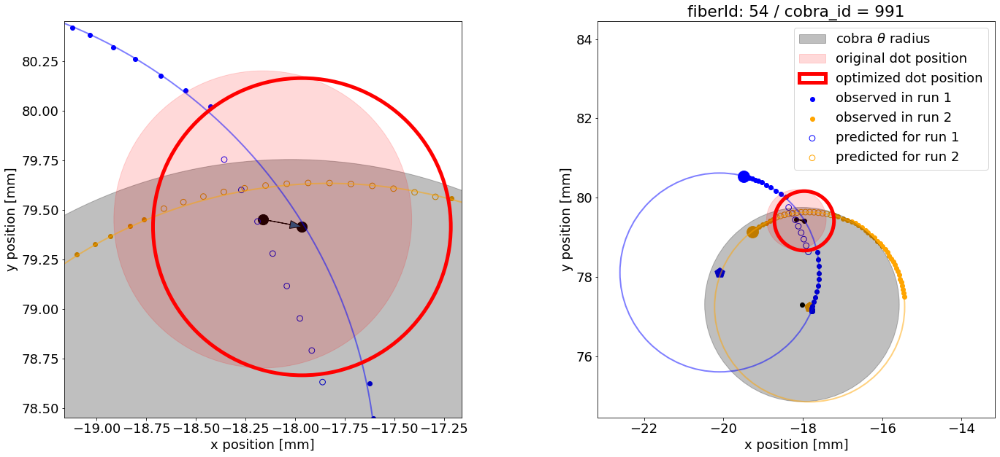

In [733]:
OptimizeBlackDotsVisualize_instance.show_single_cobra(cobra_id=cob_id  - 1)

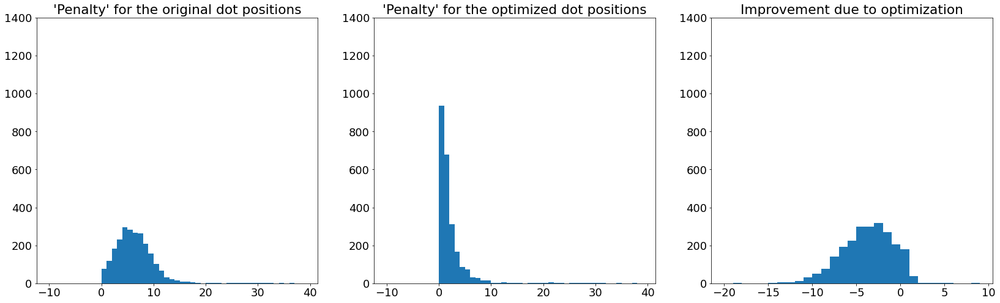

In [720]:
OptimizeBlackDotsVisualize_instance.show_improvment_1d()

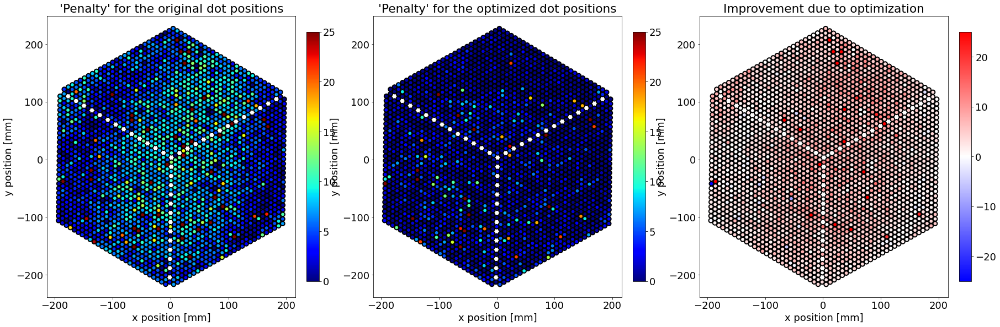

In [480]:
OptimizeBlackDotsVisualize_instance.show_improvment_2d()

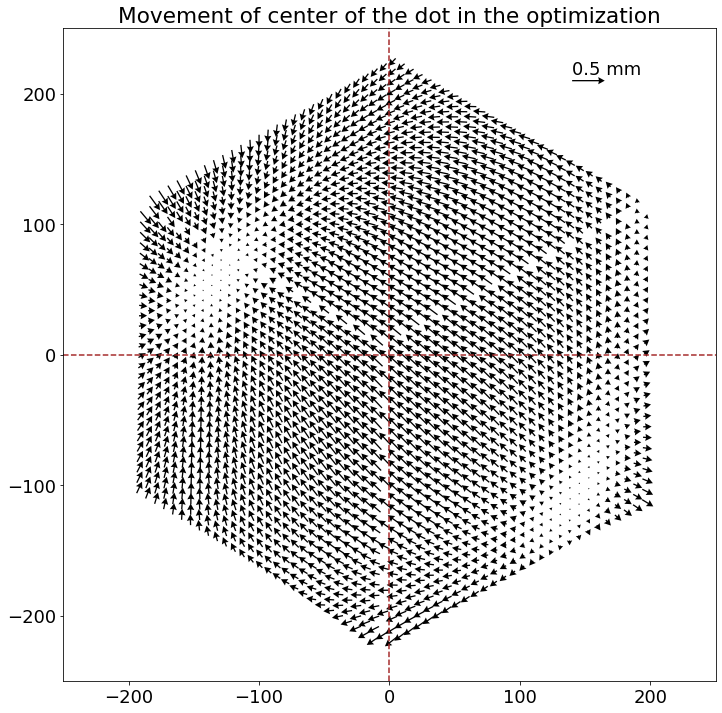

In [726]:
OptimizeBlackDotsVisualize_instance_15_16.show_movement()

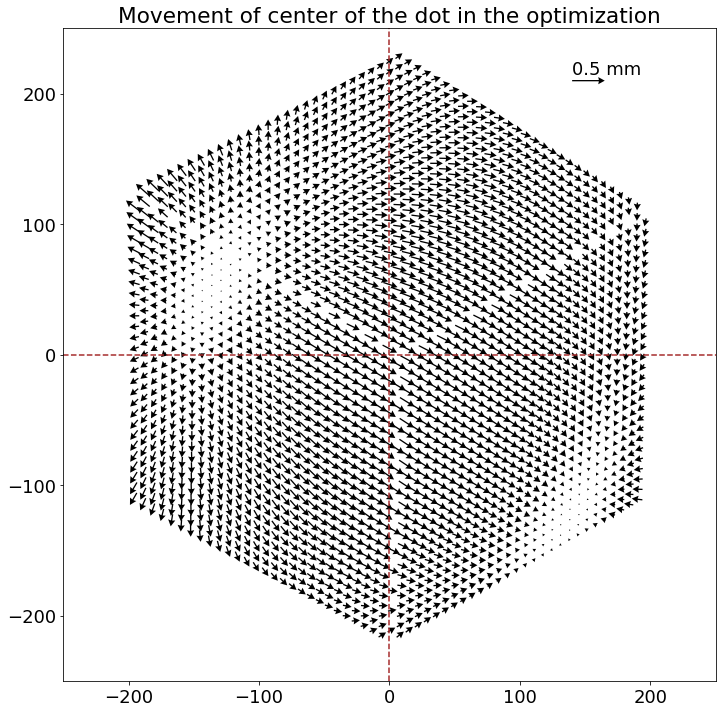

In [481]:
OptimizeBlackDotsVisualize_instance.show_movement()

"\n# sixth run  (June 2022, PFI)\nmcs_data_all_12 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076599.theta.npy')\nmcs_data_all_11 = np.load('/work/alefur/notebook_outputs/blackDots/mcsData.v076239.phi.npy')\n\n# seventh run  (June 2022, PFI)\nmcs_data_all_13 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076682.theta.npy')\nmcs_data_all_14 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076685.phi.npy')\n\n#  run number 8  (June 17 2022, PFI)\nmcs_data_all_15 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076703.theta.npy')\nmcs_data_all_16 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076705.phi.npy')\n\n#  run number 9  (June 20 2022, PFI)\nmcs_data_all_17 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v077873.phi.npy')\nmcs_data_all_18 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v077875.theta.npy')\n"

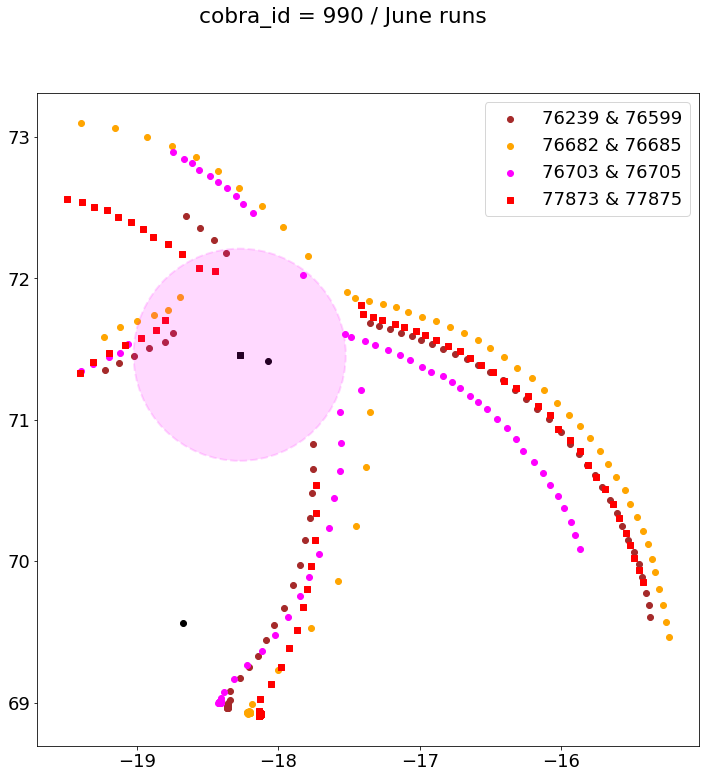

In [749]:
%matplotlib inline
matplotlib.rcParams.update({'font.size': 18})
plt.rcParams["figure.facecolor"] = "white"

cobra_id = 989

fig, ax1 = plt.subplots( figsize=(28,12))
# cobra_id is index 1
fig.suptitle(f'cobra_id = {cobra_id + 1}' + ' / June runs') 

datam1 = ax1.scatter(mcs_data_all_11[0, cobra_id+1], mcs_data_all_11[1, cobra_id+1], color='brown', label='76239 & 76599')
ax1.scatter(mcs_data_all_12[0, cobra_id+1], mcs_data_all_12[1, cobra_id+1], color='brown')

data0 = ax1.scatter(mcs_data_all_13[0, cobra_id+1], mcs_data_all_13[1, cobra_id+1], color='orange', label='76682 & 76685')
ax1.scatter(mcs_data_all_14[0, cobra_id+1], mcs_data_all_14[1, cobra_id+1], color='orange')

data1 = ax1.scatter(mcs_data_all_15[0, cobra_id+1], mcs_data_all_15[1, cobra_id+1], color='magenta', label='76703 & 76705')
ax1.scatter(mcs_data_all_16[0, cobra_id+1], mcs_data_all_16[1, cobra_id+1], color='magenta')

data2 = ax1.scatter(mcs_data_all_17[0, cobra_id+1][:41], mcs_data_all_17[1, cobra_id+1][:41], color='red',marker = 's', label='77873 & 77875')
ax1.scatter(mcs_data_all_18[0, cobra_id+1], mcs_data_all_18[1, cobra_id+1], color='red', marker = 's')

xd_May22, yd_May22 = dots_new_June.iloc[cobra_id][['x','y']].values
xd_Nov21, yd_Nov21 = dots_new_June_2022_nonAffine_after_76703.iloc[cobra_id][['x','y']].values


cc_original = Circle((xd_Nov21, yd_Nov21), 0.75, color='magenta', alpha=0.15, label='current pfs_instdata dots', lw=2, ls = '--')
# cc_modified = Circle((xd_May22, yd_May22), 0.75, color='magenta' , alpha=1, label='May dot position', fill=False, lw=2,  ls = '--')

ax1.scatter(getCobraGeometry_cobra_id.loc[cobra_id+1]['center_x_mm'], getCobraGeometry_cobra_id.loc[cobra_id+1]['center_y_mm'], color='black')
ax1.scatter(xd_May22, yd_May22, color='black')
ax1.scatter(xd_Nov21, yd_Nov21, color='black', marker = 's')

ax1.set_aspect(1) 
ax1.add_artist(cc_original) 
#ax1.add_artist(cc_modified)

#ax1.arrow(xd_Nov21, yd_Nov21, xd_May22-xd_Nov21, yd_May22-yd_Nov21, head_width = 0.04, length_includes_head = True)
ax1.legend(handles = [datam1, data0, data1, data2])

"""
# sixth run  (June 2022, PFI)
mcs_data_all_12 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076599.theta.npy')
mcs_data_all_11 = np.load('/work/alefur/notebook_outputs/blackDots/mcsData.v076239.phi.npy')

# seventh run  (June 2022, PFI)
mcs_data_all_13 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076682.theta.npy')
mcs_data_all_14 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076685.phi.npy')

#  run number 8  (June 17 2022, PFI)
mcs_data_all_15 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076703.theta.npy')
mcs_data_all_16 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v076705.phi.npy')

#  run number 9  (June 20 2022, PFI)
mcs_data_all_17 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v077873.phi.npy')
mcs_data_all_18 = np.load('/work/ncaplar/HiloAnalysis/Cobra_data/mcsData.v077875.theta.npy')
"""



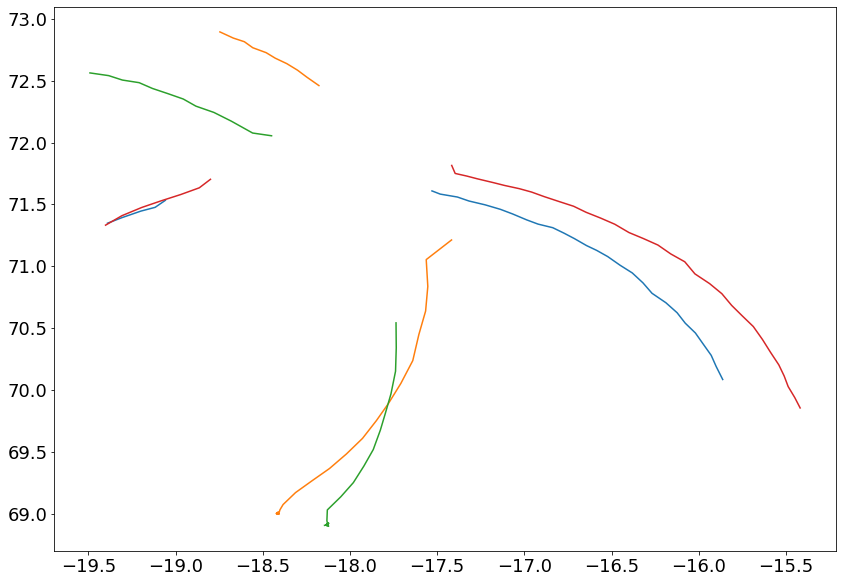

In [735]:
plt.plot(mcs_data_all_15[0][990], mcs_data_all_15[1][990],color=)
plt.plot(mcs_data_all_16[0][990], mcs_data_all_16[1][990])
plt.plot(mcs_data_all_17[0][990], mcs_data_all_17[1][990])
plt.plot(mcs_data_all_18[0][990], mcs_data_all_18[1][990])

In [699]:
from tqdm import tqdm

  0%|          | 0/595 [00:00<?, ?it/s]

[110.81532201668823, 8.462802218888832, 2.2851587768797987, 0.003682299372836527]
[112.92882883164329, 7.46234300175961, 1.8898226562187432, 0.0014190983852207936]


  0%|          | 1/595 [00:00<05:28,  1.81it/s]

[117.77959513018826, 3.7106480228132552, 2.490106735619674, 0.010730695632711108]
[120.0567859695638, 2.8378648109004856, 2.500290547628379, 0.002789323729802553]


  0%|          | 2/595 [00:01<05:23,  1.83it/s]

[117.59699506001185, 12.122862910161444, 2.518411170497854, 0.005106499657243683]
[119.97631365938824, 11.314430701108007, 1.9761364816902465, 0.006849854455391157]


  1%|          | 3/595 [00:01<05:22,  1.83it/s]

[124.79028729330382, 7.846267006258508, 2.4463479934358934, 0.00779582342171859]
[127.02984244805644, 6.866594607397417, 2.430276428875368, 0.0013807154358138102]


  1%|          | 4/595 [00:02<05:19,  1.85it/s]

[124.67308161933443, 16.120070675524175, 2.3940372906048677, 0.0009369488918778019]
[127.26201963260526, 13.883224358729208, 3.2310993052992942, 0.016700713386644483]


  1%|          | 5/595 [00:02<05:19,  1.85it/s]

[131.80145636367104, 11.883555230525975, 2.319817169301265, 0.001170343239637822]
[133.99450095176732, 10.547421183890135, 2.712929693568871, 0.002008543871841633]


  1%|          | 6/595 [00:03<05:17,  1.85it/s]

[131.6977400020613, 19.945553691144706, 2.397366011726313, 0.003125954174613137]
[133.90044486112217, 19.160988527536727, 2.0615858688605404, 0.0015647868517401093]


  1%|          | 7/595 [00:03<05:16,  1.86it/s]

[138.85803151079165, 15.866268022670868, 2.187361339933509, 0.003920221839487249]
[140.9515741262768, 14.72972020165039, 2.3872849887872616, 0.0019881508568123005]


  1%|▏         | 8/595 [00:04<05:16,  1.86it/s]

[138.5833207243549, 23.761110718920403, 2.479127277608776, 0.004492945820186018]
[140.90186978564103, 23.008496393440975, 2.0659832167103658, 0.0022821246008543124]


  2%|▏         | 9/595 [00:04<05:16,  1.85it/s]

[145.48626830181783, 19.450765120022442, 2.576052447043524, 0.003135552796891509]
[147.86599715669198, 18.68861120679538, 2.36133051740623, 0.0037784492023158417]


  2%|▏         | 10/595 [00:06<07:36,  1.28it/s]

[145.47971232069617, 27.59283999487788, 2.5442928703679244, 0.007338819781344935]
[147.86149412963235, 26.98643713637382, 2.0933380903126326, 0.0031190374666703203]


  2%|▏         | 11/595 [00:06<06:54,  1.41it/s]

[152.43262724149133, 23.544626299051618, 2.486015794775635, 0.005419127928117494]
[154.7131262152282, 22.665385435725746, 2.195242283711579, 0.0018418734947760426]


  2%|▏         | 12/595 [00:07<06:23,  1.52it/s]

[152.5340955129108, 31.762209922205113, 2.3200356271496063, 0.003362950673937508]
[154.87190651085373, 30.934772108317485, 2.0421682379122967, 0.004095009632317926]


  2%|▏         | 13/595 [00:07<06:02,  1.61it/s]

[159.43593287848637, 27.32426506886518, 2.4959282181851545, 0.004981939555588101]
[161.69796840502374, 26.644702703229274, 2.283218309364503, 0.0026754246418742265]


  2%|▏         | 14/595 [00:08<05:47,  1.67it/s]

[160.37378832937884, 32.93432178333503, 2.5749719798686113, 0.006333027947508706]
[161.9037917863601, 34.771039956467874, 1.965300078377982, 0.0013400308039484988]


  3%|▎         | 15/595 [00:08<05:37,  1.72it/s]

[166.36682024377876, 31.303984161086543, 2.4431787849257227, 0.003942472445981499]
[168.66220234432367, 30.51706765865566, 2.1235633663925837, 0.002191795783165363]


  3%|▎         | 16/595 [00:09<05:29,  1.76it/s]

[166.48362412618337, 39.33188026521045, 2.410285425359653, 0.002181593308631337]
[168.75820303942479, 38.69509987580753, 2.017606870451867, 0.002250339297259178]


  3%|▎         | 17/595 [00:09<05:25,  1.78it/s]

[173.32485999730284, 35.32380823361495, 2.3574768419794516, 0.003197707861205273]
[175.57220651312068, 34.41626647071724, 1.9828672150931241, 0.004028787199339934]


  3%|▎         | 18/595 [00:10<06:23,  1.50it/s]

[173.45716085743146, 43.394491899810376, 2.302628027182208, 0.00172562141405798]
[175.7410909245408, 42.2842636801743, 2.0004677494946868, 0.03238425313586113]


  3%|▎         | 19/595 [00:11<06:02,  1.59it/s]

[180.1812735160106, 39.17069594097786, 2.444862367424295, 0.007723432603961694]
[182.50515077382587, 38.44519737823081, 1.8465408531916243, 0.004333200013913471]


  3%|▎         | 20/595 [00:12<06:00,  1.60it/s]/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/ipykernel/__main__.py:90: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


[180.28582406242126, 47.19780255008077, 2.4311879293853855, 0.0007881751040103617]
[182.6515265691535, 46.53206774968437, 1.8381138093095837, 0.0023962274844873768]


  4%|▎         | 21/595 [00:12<05:45,  1.66it/s]

[187.2440886356224, 43.16965640022217, 2.3031718020040897, 0.008508772198528547]
[189.54853257517024, 42.2995871895021, 1.913541351790753, 0.006909954750739815]


  4%|▎         | 22/595 [00:13<05:34,  1.71it/s]

[187.3115214753418, 51.13510398845814, 2.345428137478455, 0.007285151417451605]
[189.5995265226272, 50.38620847765195, 2.115445295684193, 0.002214186738774413]


  4%|▍         | 23/595 [00:13<05:27,  1.75it/s]

[194.18570898729874, 46.89487066273055, 2.407889468141183, 0.0025688078538760235]
[196.52864766297353, 46.1347818245449, 2.0920141112229076, 0.010886339594229365]


  4%|▍         | 24/595 [00:14<05:27,  1.74it/s]

[194.20914534101016, 54.72058810057756, 2.553800167313082, 0.0066929093347265056]
[196.64012602764421, 54.27301933354163, 2.0937247712411016, 0.0016694659802084615]


  4%|▍         | 25/595 [00:14<05:34,  1.70it/s]

[-0.5879595358259567, -71.21063274171942, 0.006400870607659521, 0.00044064465160273186]
[-0.5884775100991431, -71.20703850021043, 0.006003611096623094, 0.0004817808352103398]


  4%|▍         | 26/595 [00:16<07:59,  1.19it/s]

[5.937737115309692, -74.31453269606418, 2.377836644078461, 0.0076069126573742015]
[8.072834629458576, -75.48157234143532, 2.6848456425636407, 0.002752584509929008]


  5%|▍         | 27/595 [00:16<07:07,  1.33it/s]

[5.815573556215187, -66.14127666271317, 2.4159369822545775, 0.0037673328392554667]
[8.039869806491982, -67.18924923677338, 2.457703911867263, 0.0032668782187028267]


  5%|▍         | 28/595 [00:17<06:30,  1.45it/s]

[12.846900303952761, -70.57835061985868, 2.5232250977719923, 0.008033657020107636]
[15.093673172743603, -71.46544469767322, 2.673191357193021, 0.0023508903948629856]


  5%|▍         | 29/595 [00:17<06:04,  1.55it/s]

[13.00992466944571, -62.44841529589663, 2.402306045146686, 0.0012265604901350335]
[15.201067031160887, -63.27559994111376, 2.463151735621366, 0.002150467038401709]


  5%|▌         | 30/595 [00:18<05:45,  1.63it/s]

[19.69936265123292, -66.55317497572375, 2.5220471107872364, 0.009032710676038341]
[22.044759979155206, -67.4988159743005, 2.431194551346333, 0.0013567982064449783]


  5%|▌         | 31/595 [00:19<05:33,  1.69it/s]

[19.815877820260607, -58.50066649348077, 2.4844471402270476, 0.00650739908594925]
[22.102919979237985, -59.378547808528346, 2.430768825688224, 0.0008619429176269899]


  5%|▌         | 32/595 [00:19<05:23,  1.74it/s]

[26.79723023268796, -62.6739116317979, 2.4678973899528778, 0.004545940502179245]
[29.017692317671937, -63.59706614845822, 2.5334994150257772, 0.001044862189844691]


  6%|▌         | 33/595 [00:20<05:17,  1.77it/s]

[26.812689233128324, -54.7555737714975, 2.577376614218617, 0.0013923841829793623]
[29.109620687597374, -55.47351363570455, 2.593199507675728, 0.0026334659294619672]


  6%|▌         | 34/595 [00:21<06:53,  1.36it/s]

[33.69482243783629, -58.74326713552984, 2.505087171580591, 0.0006041046604252063]
[35.90756490529224, -59.62974895980518, 2.3350864714551385, 0.002020645586860308]


  6%|▌         | 35/595 [00:21<06:19,  1.47it/s]

[33.80572527064787, -50.65723678294117, 2.471914288075963, 0.00660850760480215]
[36.04908397479805, -51.59679599764095, 2.499287704274847, 0.0034378182665435308]


  6%|▌         | 36/595 [00:22<05:55,  1.57it/s]

[43.25249006749578, -55.44755165873855, 0.006218269187554382, 0.00042556590957978745]
[43.251413664464124, -55.44530719399274, 0.006581367163395369, 0.0004925355056707494]


  6%|▌         | 37/595 [00:22<05:37,  1.66it/s]

[40.899454986498526, -46.85882128901874, 2.46217099305846, 0.0018904981430265633]
[43.03853564551394, -47.682137205016105, 2.346153309050209, 0.005521264013922808]


  6%|▋         | 38/595 [00:23<05:25,  1.71it/s]

[47.58639943663639, -50.81886605764416, 2.4374525241438363, 0.007593537501462123]
[49.921395093826774, -51.79938929743167, 2.2921848128386992, 0.002036889392533646]


  7%|▋         | 39/595 [00:23<05:16,  1.76it/s]

[47.839510448188726, -42.93673968746276, 2.429753939505324, 0.007873483947805116]
[50.14761034307879, -43.83182137231374, 2.3318696773750216, 0.0016558082056077929]


  7%|▋         | 40/595 [00:24<05:10,  1.79it/s]

[54.69174261293491, -47.02913272088869, 2.475157170917927, 0.008046407759469727]
[55.0191331291559, -46.2111596136207, 0.03797196887626483, 0.0011272428612384112]


  7%|▋         | 41/595 [00:24<05:05,  1.81it/s]

[54.75343424352376, -39.12321823886564, 2.5442990461660955, 0.008007494316646402]
[57.074331617411104, -39.89357225927449, 2.390124058545628, 0.001848811609775191]


  7%|▋         | 42/595 [00:25<05:02,  1.83it/s]

[60.96747712083314, -42.911685267613315, 3.147321780740935, 0.0019216036061831068]
[63.843498576402254, -43.88170252915141, 2.2451972763572665, 0.00021936120426511852]


  7%|▋         | 43/595 [00:26<06:30,  1.41it/s]

[61.85303759382093, -35.02078494820614, 2.3440277751473566, 0.003331132303534278]
[64.22760897875517, -36.181513548019275, 2.472288475722846, 0.011885141452282779]


  7%|▋         | 44/595 [00:27<06:01,  1.53it/s]

[68.74114985160521, -39.24766914947917, 2.4279142762150854, 0.006564184587873112]
[70.91761431129186, -40.148069536066956, 2.3920694320080678, 0.001465405243402739]


  8%|▊         | 45/595 [00:27<05:40,  1.62it/s]

[68.74996711123968, -31.06452021357938, 2.360984293434871, 0.000998625030009868]
[71.51532710837533, -32.813371026610085, 3.1208247419425557, 0.0005451948750586925]


  8%|▊         | 46/595 [00:28<05:26,  1.68it/s]

[75.69273272826837, -35.48045869394524, 2.5364402854193298, 0.005286673732432755]
[77.95068739821902, -36.2603525826983, 2.382872495045402, 0.0016821465634646933]


  8%|▊         | 47/595 [00:28<05:16,  1.73it/s]

[75.808763294456, -27.287277096189204, 2.372952197108347, 0.007282814389696025]
[77.9920205655178, -28.259700689352073, 2.268292968108951, 0.003441990957807342]


  8%|▊         | 48/595 [00:29<05:08,  1.77it/s]

[82.76756559328909, -31.30307939587934, 2.2971566388367686, 0.00544028160261979]
[84.8772363576512, -32.408527796647384, 2.3249212619187225, 0.001245267539908198]


  8%|▊         | 49/595 [00:29<05:02,  1.80it/s]

[82.50044559882834, -24.529549444035773, 2.4595754453297816, 0.00490957365682857]
[84.93970418582094, -24.196550420117106, 2.1846904922196093, 0.0032544517995280434]


  8%|▊         | 50/595 [00:30<04:59,  1.82it/s]

[89.81357101215445, -27.545393514930335, 2.3545052688311077, 0.008462429559548207]
[91.56384232263487, -28.215931680837198, 1.9473871097641768, 0.00017852544480170262]


  9%|▊         | 51/595 [00:30<04:56,  1.84it/s]

[89.76655966640935, -19.444828442915686, 2.3612955982863646, 0.0010413823713114837]
[91.94648588649609, -20.372431502069613, 2.2547082266954708, 0.0012364657523218593]


  9%|▊         | 52/595 [00:31<04:53,  1.85it/s]

[96.62272429652599, -23.707454399365886, 2.463358467202616, 0.004828969353865492]
[98.84173179942802, -24.67235655416771, 2.4356187915187713, 0.0013621434537681404]


  9%|▉         | 53/595 [00:32<06:30,  1.39it/s]

[96.62978371499048, -15.618314432766375, 2.4154133160780105, 0.006952828135218516]
[98.89240348690349, -16.388476591311484, 2.0360599897850222, 0.001518198956440254]


  9%|▉         | 54/595 [00:33<05:58,  1.51it/s]

[103.45906894708824, -19.661907807576757, 2.4575175175099417, 0.003567890172914331]
[106.28522548740524, -21.233807209316986, 2.9412881674796223, 0.0001316151534345254]


  9%|▉         | 55/595 [00:33<05:36,  1.60it/s]

[103.6203173111628, -11.585188912099863, 2.3751716001354444, 0.0035668159015590116]
[105.81019580872459, -12.440684035546385, 2.107564426058944, 0.0009036224140966806]


  9%|▉         | 56/595 [00:34<05:21,  1.68it/s]

[110.50346114634387, -15.784353092845402, 2.4143589114570516, 0.010804449757915254]
[112.74157403676496, -16.77183993483077, 2.368249795183433, 0.0011781742551720234]


 10%|▉         | 57/595 [00:34<05:11,  1.73it/s]

[110.6217183373635, -7.663669046813736, 2.334163353981204, 0.0018596194563260532]
[112.82909967922555, -8.591445504583303, 2.114765809716791, 0.0013168136637068087]


 10%|▉         | 58/595 [00:35<05:04,  1.77it/s]

[117.28564233869454, -12.472297294958182, 3.0418491242529666, 0.001186654348917885]
[119.81451184910112, -13.19326930743888, 2.738298404387891, 0.009218800788235958]


 10%|▉         | 59/595 [00:35<04:57,  1.80it/s]

[117.58641041364046, -3.6490036776823356, 2.2810639557950863, 0.005410286932661971]
[119.74285144825154, -4.649906218345169, 2.127194032837891, 0.0018987391378823572]


 10%|█         | 60/595 [00:36<04:53,  1.82it/s]

[128.39924402053722, -10.92046336442808, 2.6225407315027938, 0.005840620065969666]
[126.22464302612829, -8.475215292076157, 1.5805321589919474, 0.0007378157451685045]


 10%|█         | 61/595 [00:36<04:49,  1.84it/s]

[124.61630814950614, 0.1644591957347194, 2.272619759920118, 0.004646525009983062]
[126.70923343306933, -0.7876791777619341, 2.0795511603007393, 0.0022101287173603434]


 10%|█         | 62/595 [00:37<04:48,  1.85it/s]

[131.3854038986249, -4.031690684439484, 2.397857254844262, 0.0029567266293211423]
[128.29655569876803, 0.4264415888137468, 5.320521136167161, 0.004288217427200571]


 11%|█         | 63/595 [00:38<06:20,  1.40it/s]

[131.41414281034105, 4.01290503835765, 2.3893209626161136, 0.006237684226240607]
[133.64288580838502, 3.152229182224686, 2.084380965087846, 0.0025125213272215565]


 11%|█         | 64/595 [00:39<05:51,  1.51it/s]

[138.25512571409558, -0.21618849136723772, 2.476744029640086, 0.004402365390176849]
[141.11152785060864, -1.6570979548224511, 3.052114824008257, 0.0009073579609370175]


 11%|█         | 65/595 [00:39<05:30,  1.60it/s]

[138.36618957940777, 7.9204087244273484, 2.4019383270562145, 0.01281029330910691]
[140.66419107567336, 6.914335148661431, 2.0549628651312153, 0.0004542106101450825]


 11%|█         | 66/595 [00:40<05:15,  1.68it/s]

[145.28893513910668, 3.6375926567574446, 2.4711799621204293, 0.0037155148328753707]
[147.84483089496769, 2.4306472649223982, 2.820723198409881, 0.0006343359981393545]


 11%|█▏        | 67/595 [00:40<05:05,  1.73it/s]

[145.36713745124942, 11.813225700667429, 2.3576550671023675, 0.001718745374395482]
[147.60477429434957, 10.901472589113652, 1.8664595437187652, 0.0018432242847759325]


 11%|█▏        | 68/595 [00:41<04:56,  1.77it/s]

[152.19321667002305, 7.474901971409956, 2.516313119601914, 0.008225678599949176]
[154.58156768403933, 6.719094922951556, 2.198780958213508, 0.001984926458014611]


 12%|█▏        | 69/595 [00:41<04:51,  1.80it/s]

[152.3036564783664, 15.46152487388658, 2.5140972839116875, 0.004681603158636215]
[154.6592540244863, 14.73489464755307, 2.181382169320072, 0.01224697046694009]


 12%|█▏        | 70/595 [00:42<04:48,  1.82it/s]

[159.21974142074225, 11.639553571386827, 2.335091300219592, 0.008728292379472747]
[159.64410045410227, 12.222658824566123, 0.2904357491101484, 0.0024099041165059976]


 12%|█▏        | 71/595 [00:42<04:44,  1.84it/s]

[159.1986078346223, 19.583928214260823, 2.424546233451098, 0.001115928716674377]
[-983.1565268800038, 1362.829770982009, 1763.5914237885324, 0.000425513149561561]


 12%|█▏        | 72/595 [00:43<04:43,  1.85it/s]

[166.1556746592693, 15.384644389252788, 2.4091457046086195, 0.003856157880104639]
[168.47400974444608, 14.50171250527565, 2.1403264972059435, 0.0027366687295079053]


 12%|█▏        | 73/595 [00:44<06:20,  1.37it/s]

[166.02101418670736, 22.138393729791474, 3.5097172970828874, 0.0006940947065961754]
[168.48689580031163, 22.77498273463751, 2.127874501642749, 0.001487990423014597]


 12%|█▏        | 74/595 [00:44<05:49,  1.49it/s]

[173.21084025626146, 19.20105818980937, 2.4231226890808877, 0.008476464630387471]
[175.65327429428734, 17.992814420526692, 2.5969078443645266, 0.011432272738204944]


 13%|█▎        | 75/595 [00:45<05:27,  1.59it/s]

[173.1452265136878, 27.384075494281685, 2.3815677517081113, 0.005412829600412619]
[173.80340447531287, 27.990780848475758, 0.29346760703756775, 0.0036480535498658426]


 13%|█▎        | 76/595 [00:46<05:10,  1.67it/s]

[180.17649944026567, 22.787458746679203, 2.5746136588042323, 0.003198234752158446]
[182.4463261965878, 22.346676422949724, 2.089191763797876, 0.0013087867935333113]


 13%|█▎        | 77/595 [00:46<04:58,  1.73it/s]

[180.23124346300673, 31.237913549629535, 2.2870989222370746, 0.0038482591234539694]
[182.49181512315727, 30.5509074794211, 1.869446363839163, 0.0018027655528108954]


 13%|█▎        | 78/595 [00:47<04:51,  1.77it/s]

[186.95625626762705, 27.063726575725685, 2.460357867769225, 0.012162507673032714]
[189.28008461292367, 26.323802221257306, 2.069928985277336, 0.01746558963514694]


 13%|█▎        | 79/595 [00:47<04:45,  1.81it/s]

[187.15631774914368, 35.03845324098041, 2.381398238407441, 0.0038149935772840288]
[189.47642391293562, 34.426632000615186, 1.8353252772731108, 0.001413649785903417]


 13%|█▎        | 80/595 [00:48<04:41,  1.83it/s]

[194.1139511193619, 31.055686845917116, 2.256431468608706, 0.00495225072921]
[196.27233274193802, 30.22417732314359, 2.0124782583324676, 0.002991796035821745]


 14%|█▎        | 81/595 [00:48<04:38,  1.85it/s]

[193.91040346270415, 39.08102769492388, 2.4526836217053183, 0.007104269909206632]
[197.24517202608033, 37.58366278041137, 2.9627960178147266, 0.0007483563374025199]


 14%|█▍        | 82/595 [00:49<04:36,  1.86it/s]

[0.6556734080360933, -87.11274075118884, 0.006944615818465608, 0.0006019361626293182]
[0.6525775270873637, -87.11960850727644, 0.007875327607159335, 0.0005043119488572117]


 14%|█▍        | 83/595 [00:49<04:32,  1.88it/s]

[5.734743058968068, -90.36343823934948, 2.390585007560114, 0.006263776309211256]
[8.54831359419347, -92.16649943448719, 3.6963863307553053, 0.0008627034746688808]


 14%|█▍        | 84/595 [00:50<06:12,  1.37it/s]

[5.7516939096454935, -82.16069051919564, 2.3087649117535176, 0.002996947352429063]
[7.88689218217607, -83.16276648779717, 2.420870094530817, 0.0024721387623180963]


 14%|█▍        | 85/595 [00:51<05:42,  1.49it/s]

[12.272555571625347, -87.41176105230363, 3.482204502281693, 0.0014208991963807064]
[14.770193199854148, -87.44936579367217, 2.699818538571645, 0.008502406476965976]


 14%|█▍        | 86/595 [00:52<05:19,  1.59it/s]

[12.58736261560254, -78.15602075015383, 2.375325768938175, 0.0027859340644330113]
[14.741596706779896, -79.04350314915497, 2.2095980737336487, 6.618103235133274e-05]


 15%|█▍        | 87/595 [00:52<05:04,  1.67it/s]

[19.550617200971207, -82.55261029640728, 2.5069788395198955, 0.0016253005042715216]
[21.785286663201454, -83.80860051158226, 2.7320775288377592, 0.02285843371045077]


 15%|█▍        | 88/595 [00:53<04:52,  1.74it/s]

[19.61852656210936, -74.4082361814855, 2.438827819236767, 0.002143543226164379]
[21.838045828456433, -75.51338995875747, 2.5651690629913206, 0.03047426414444495]


 15%|█▍        | 89/595 [00:53<04:44,  1.78it/s]

[26.614967515223817, -78.63309052789606, 2.4346587627906455, 0.0018014714825661823]
[28.774588568444493, -79.81498801625484, 2.7831526643614026, 0.013899513835665402]


 15%|█▌        | 90/595 [00:54<04:38,  1.81it/s]

[26.503051030610933, -70.44712735589444, 2.4649892528444113, 0.008287433512993119]
[28.73849125103953, -71.50204289810587, 2.2709623706736646, 0.0013804281790191397]


 15%|█▌        | 91/595 [00:54<04:34,  1.83it/s]

[33.6461220314295, -74.57475959257951, 2.3118204722880598, 0.007181809721005675]
[35.79433418637758, -75.68448310758443, 2.5220758246326795, 0.001718223075144003]


 15%|█▌        | 92/595 [00:55<04:31,  1.85it/s]

[33.553788850787384, -66.56909383278882, 2.4197366940410596, 0.0026820026952739844]
[35.762423806193816, -67.57539658167778, 2.4774145743471405, 0.0041099845019222005]


 16%|█▌        | 93/595 [00:55<04:29,  1.86it/s]

[40.560546713172144, -70.88194501591252, 2.4805563445254033, 0.0011497193899091228]
[42.77492158294185, -71.75177600271533, 2.454051607035559, 0.0015471422874534639]


 16%|█▌        | 94/595 [00:56<04:28,  1.87it/s]

[40.561756570789534, -62.553206584915564, 2.3408078928346994, 0.0021109072446084567]
[42.74387104369878, -63.65647045998723, 2.326037214315132, 0.0022286520203274925]


 16%|█▌        | 95/595 [00:56<04:26,  1.88it/s]

[47.51595218519513, -66.64030028301255, 2.2911203496514965, 0.0017416363114968428]
[49.70040590829761, -67.87553460189805, 2.3631292152451504, 0.0017963490161280009]


 16%|█▌        | 96/595 [00:57<06:05,  1.37it/s]

[47.55044709658068, -58.76015183994443, 2.394455452770533, 0.0055037677819609375]
[49.69336489012481, -59.808734155976424, 2.3509052893950844, 0.00509229600572793]


 16%|█▋        | 97/595 [00:58<05:35,  1.49it/s]

[54.562830057527144, -62.98981194854091, 2.3779975180991197, 0.0038836486875498625]
[56.727575970842786, -63.86366958864115, 2.393573253833493, 0.0023176583036847455]


 16%|█▋        | 98/595 [00:59<05:12,  1.59it/s]

[54.469179683421125, -54.93275492780882, 2.4903333324986554, 0.0026988316329314005]
[56.69413112765708, -55.803293759072055, 2.2695446306642397, 0.0015188843842308297]


 17%|█▋        | 99/595 [00:59<04:56,  1.67it/s]

[61.32843039452713, -59.593688506730714, 2.8607769863547037, 0.0037316727510136437]
[63.7225549650485, -60.02299007255551, 2.7425555012175864, 0.0010760400431921455]


 17%|█▋        | 100/595 [01:00<04:47,  1.72it/s]

[61.5284913827092, -50.90440029287364, 2.381541237233253, 0.0049844328929867475]
[64.21920942490985, -52.6045498922786, 3.2402132449132073, 0.00046613812064392893]


 17%|█▋        | 101/595 [01:00<04:40,  1.76it/s]

[68.49392781835002, -55.16501165309738, 2.3870421314956776, 0.006917933330293755]
[70.64945748000493, -56.14612844669414, 2.357272121565839, 0.0016870052640794895]


 17%|█▋        | 102/595 [01:01<04:33,  1.80it/s]

[68.43810097606341, -47.196798099269785, 2.530294396998653, 0.010509789352353915]
[70.76362843298917, -48.12594457766456, 2.5018522609506015, 0.0001837216975290562]


 17%|█▋        | 103/595 [01:01<04:29,  1.83it/s]

[77.64471866664736, -52.41276375217563, 0.007857851300539285, 0.0007844564047447853]
[77.64692327692329, -52.40866812293484, 0.006773170457988679, 0.0005101157397478092]


 17%|█▋        | 104/595 [01:02<04:24,  1.86it/s]

[75.44235050741833, -43.33016645775467, 2.485459958044477, 0.003916989868785814]
[77.68250492030374, -44.107400299375485, 2.3149228327213867, 0.004538834928840906]


 18%|█▊        | 105/595 [01:02<04:22,  1.86it/s]

[82.28507525817031, -47.38885209485898, 2.481898493762214, 0.007868237345016045]
[84.61654623034134, -48.28509070042627, 2.2128082297482674, 0.0021234453338378656]


 18%|█▊        | 106/595 [01:03<04:20,  1.88it/s]

[82.40700070042506, -39.28817015556651, 2.4363355455065814, 0.002060558944421715]
[84.69665168722324, -40.210100097060575, 2.157914672680559, 0.0016320792033360735]


 18%|█▊        | 107/595 [01:03<04:20,  1.88it/s]

[89.27634237425788, -43.48524566378044, 2.4806438616523696, 0.0012592288670751242]
[91.60276162004344, -44.39904521370278, 2.1518299479112906, 0.002828450049754665]


 18%|█▊        | 108/595 [01:04<04:19,  1.88it/s]

[89.46509870526904, -35.48027109697654, 2.450241450153157, 0.00129055491948955]
[91.644867678418, -36.28774626854985, 2.212769569500514, 0.0007740997156496165]


 18%|█▊        | 109/595 [01:05<06:03,  1.34it/s]

[96.34247544258409, -39.51657505412917, 2.4008989241933154, 0.0064066107385280305]
[98.5538615417877, -40.552078398858015, 2.251209149352222, 0.001606083868230966]


 18%|█▊        | 110/595 [01:06<05:29,  1.47it/s]

[96.36563184875732, -31.572759058452665, 2.4769242703527796, 0.011847516035903298]
[98.60157500071892, -32.389282696931275, 2.0806530413894393, 0.0009108114051619764]


 19%|█▊        | 111/595 [01:06<05:07,  1.58it/s]

[103.39549102862188, -35.617677336363755, 2.3355108978936148, 0.004827537069934057]
[105.5310118305933, -36.74225827140875, 2.364033390536237, 0.0013650846573598685]


 19%|█▉        | 112/595 [01:07<04:51,  1.66it/s]

[103.28208644582821, -27.70451473092758, 2.537392123297418, 0.007455992992412776]
[105.58588264439848, -28.507492099336577, 2.148639442580567, 0.001210157286390339]


 19%|█▉        | 113/595 [01:07<04:40,  1.72it/s]

[110.46920875608598, -31.7135824840318, 2.273241165422365, 0.0031065310668624]
[112.54238933370819, -32.71128615853507, 2.3088975474506976, 0.0013447557094737913]


 19%|█▉        | 114/595 [01:08<04:32,  1.77it/s]

[110.21845353842333, -23.755169556167417, 2.5187816014515176, 0.002305249859707319]
[112.71241475161798, -25.14646578690879, 2.7471074694725823, 0.02491403151059737]


 19%|█▉        | 115/595 [01:08<04:25,  1.81it/s]

[117.19447827886039, -27.816258344429976, 2.401635995801783, 0.016030558776409597]
[119.4348245289578, -28.847137919623677, 2.2366439522495596, 0.001559875073545895]


 19%|█▉        | 116/595 [01:09<04:21,  1.83it/s]

[117.24986053300803, -19.80840574634817, 2.4084327391107068, 0.0023874181989682296]
[-1884.2782355913253, 2347.4445421105456, 3100.0517745335046, 0.0001882776560028592]


 20%|█▉        | 117/595 [01:09<04:19,  1.84it/s]

[124.21428431783556, -23.972167552204713, 2.397984725704922, 0.005529535848169175]
[126.40588940643363, -24.960187876412604, 2.254695399496721, 0.002060957787568359]


 20%|█▉        | 118/595 [01:10<04:16,  1.86it/s]

[124.34117309032855, -15.952066836848134, 2.3837721041043087, 0.004285847581374842]
[126.50306646406099, -16.78451862911428, 2.1736487908883135, 0.0015895332835339764]


 20%|██        | 119/595 [01:10<04:13,  1.88it/s]

[131.16785251585887, -20.26635999392686, 2.533373230484728, 0.008509560631250399]
[133.5921459964094, -21.405868123672015, 2.5866869551486267, 0.00030077228354977403]


 20%|██        | 120/595 [01:11<04:12,  1.88it/s]

[131.12623032194898, -11.911756378691823, 2.407673477453398, 0.007268156257248629]
[133.383817043557, -13.117983291418941, 2.1093307407605364, 0.019571124956310217]


 20%|██        | 121/595 [01:11<04:11,  1.89it/s]

[138.224171541775, -16.320278095207758, 2.4549644588337265, 0.0009838941529518273]
[140.44839824157148, -17.178647256889292, 2.246314931128033, 0.002094768645117348]


 21%|██        | 122/595 [01:13<05:54,  1.33it/s]

[138.09655508820015, -8.21087294120457, 2.527817725113819, 0.007075298404609699]
[138.64099180076954, -7.126558921437046, 0.48584029139267454, 0.002995796699754593]


 21%|██        | 123/595 [01:13<05:21,  1.47it/s]

[145.23762010709646, -12.188124794715144, 2.270262289012212, 0.003826997803814241]
[147.38279062902248, -13.596574567305952, 2.507634730412455, 0.021664646391828864]


 21%|██        | 124/595 [01:14<04:58,  1.58it/s]

[145.01170732921133, -4.240133600423583, 2.495013324388402, 0.014801585671679818]
[148.01758066326542, -5.637839480919185, 2.9234369690982316, 0.0001644280298882355]


 21%|██        | 125/595 [01:14<04:42,  1.66it/s]

[151.96793439597647, -8.389522206628943, 2.4419609128402557, 0.0038334454111866216]
[154.25564702380234, -9.353818474640587, 2.2035869232107017, 0.00996357617706173]


 21%|██        | 126/595 [01:15<04:31,  1.73it/s]

[152.0792674332317, -0.28550682203038036, 2.3924286644590724, 0.002804950294944665]
[154.31607002058018, -1.0417136041172723, 1.8313318082978287, 0.0023706237792170157]


 21%|██▏       | 127/595 [01:15<04:24,  1.77it/s]

[159.09339593560952, -4.749616901428349, 2.5143595806844123, 0.0025573907361062334]
[161.34369209885824, -5.427138284277385, 2.141065181196147, 0.0021517586123534988]


 22%|██▏       | 128/595 [01:16<04:18,  1.81it/s]

[159.04826492100355, 3.594360164816593, 2.4024156861520782, 0.005623747530609317]
[161.21094848819178, 2.6958272056480697, 1.958001875264754, 0.00037793592458345844]


 22%|██▏       | 129/595 [01:16<04:13,  1.84it/s]

[166.07828415338997, -0.7279445748297352, 2.42338895767749, 0.005928917642730005]
[168.37046211154777, -1.502963594399158, 2.142917991854278, 0.002076324986054373]


 22%|██▏       | 130/595 [01:17<04:10,  1.85it/s]

[165.8817767679281, 7.207926977760137, 2.628770993600495, 0.008864922686218817]
[168.22895270983648, 6.69034050528444, 1.8461959580101968, 0.00225455948413481]


 22%|██▏       | 131/595 [01:17<04:08,  1.87it/s]

[172.90912739817165, 3.369208622428002, 2.3619026587851253, 0.0010320230529873263]
[175.19786272706557, 2.4512043517243804, 2.044916509734907, 0.0019788715460887928]


 22%|██▏       | 132/595 [01:18<04:06,  1.88it/s]

[172.98775233409697, 11.27382455751477, 2.448519783495098, 0.004507832085294807]
[173.5675288343668, 12.08810717595692, 0.30729513189374397, 0.004628197051952495]


 22%|██▏       | 133/595 [01:18<04:04,  1.89it/s]

[179.87186476384665, 7.0280990618916, 2.46530128331747, 0.005149038541330335]
[180.30680012790475, 7.745910281506412, 0.16149158103861844, 0.0038912351113546584]


 23%|██▎       | 134/595 [01:19<04:03,  1.89it/s]

[179.8535285384416, 15.066981103731425, 2.5152537488854345, 0.0056459391636308025]
[182.70826141312872, 13.992164484458456, 2.6543151577797452, 0.0004095996584361458]


 23%|██▎       | 135/595 [01:20<05:52,  1.30it/s]

[186.71938422505548, 11.121336462356465, 2.432218641088649, 0.012819786593774122]
[189.09646513009582, 10.237220158063618, 2.035774367077931, 0.03240085401203049]


 23%|██▎       | 136/595 [01:21<05:19,  1.44it/s]

[186.82044437608036, 18.91664322063111, 2.548188139375202, 0.012281872371507728]
[189.23136035124693, 18.41475719994426, 1.9409725547896275, 0.0010821172360311465]


 23%|██▎       | 137/595 [01:21<04:56,  1.55it/s]

[193.85718341980035, 14.916681821515493, 2.3846418342467, 0.004666702126338583]
[196.12897892354474, 14.223338921770592, 1.898776461737411, 0.0018631823403407687]


 23%|██▎       | 138/595 [01:22<04:38,  1.64it/s]

[193.71333966475555, 22.2955687185466, 2.93418803299406, 0.004925756648042442]
[193.81601428400248, 24.33842963948742, 0.8073097748533595, 0.005113397439414078]


 23%|██▎       | 139/595 [01:22<04:25,  1.72it/s]

[-1.8401970818693782, -102.8175248166142, 3.1893026776296667, 0.003172705606255543]
[0.5624560985699201, -103.19121256290828, 2.6760701771425466, 0.002857098663215979]


 24%|██▎       | 140/595 [01:23<04:18,  1.76it/s]

[5.343396100584461, -106.15832952594616, 2.3856189700480743, 0.0025074034212237434]
[7.461721486176049, -107.27347821207292, 2.6150108704087622, 0.0017585795994289341]


 24%|██▎       | 141/595 [01:23<04:12,  1.80it/s]

[5.232682868913799, -98.27195738767351, 2.5695540135713153, 0.010488775005923042]
[7.592748378275826, -99.14103695681995, 2.4590029902269337, 0.000720207796584277]


 24%|██▍       | 142/595 [01:24<04:08,  1.83it/s]

[12.209739858153707, -102.33992134897633, 2.5116445811938086, 0.00813028260989882]
[14.499535271978479, -103.37289875970163, 2.583898856762343, 0.0021438484515854703]


 24%|██▍       | 143/595 [01:25<04:05,  1.84it/s]

[12.347449273739809, -94.23094085593034, 2.4402029672685086, 0.008663976368097329]
[14.503138222954412, -95.15624214737424, 2.384130281190732, 0.005490319751808426]


 24%|██▍       | 144/595 [01:25<04:03,  1.85it/s]

[19.320203893799437, -98.40753095293715, 2.4340732491770454, 0.00111039990963854]
[18.46828833487971, -96.21932097025302, 1.7948503624606493, 0.006946349697742425]


 24%|██▍       | 145/595 [01:26<04:01,  1.87it/s]

[19.119594781157808, -90.35292087572915, 2.5815036187598817, 0.008710989360926019]
[21.453401447527753, -91.17715256011986, 2.2907493306325057, 0.0019074691255845512]


 25%|██▍       | 146/595 [01:26<04:00,  1.87it/s]

[26.323559948280575, -94.57007077585894, 2.4406664368087827, 0.006472427871178265]
[28.472084461476054, -95.47239940933729, 2.4452343168139095, 0.0019370059708044834]


 25%|██▍       | 147/595 [01:27<03:58,  1.88it/s]

[26.132454950971507, -86.43619058681669, 2.546739245564282, 0.008052032127701697]
[28.485444648456053, -87.35864625395045, 2.3771481457292976, 0.0025896374295295943]


 25%|██▍       | 148/595 [01:27<03:57,  1.88it/s]

[33.2846926675741, -90.54572539801212, 2.360413470974521, 0.0008043673747455019]
[35.48794112164339, -91.66379625042383, 2.562146428586249, 0.00218683493838058]


 25%|██▌       | 149/595 [01:28<05:44,  1.29it/s]

[33.27921892993267, -82.73805857370483, 2.5450198403823734, 0.013090393688974827]
[35.52241971807394, -83.49528244381821, 2.5180257836139512, 0.0021961990433875867]


 25%|██▌       | 150/595 [01:29<05:10,  1.43it/s]

[40.29934504422881, -86.7851061645361, 2.420393544445492, 0.0006014799465479477]
[42.46406481609154, -87.75115552548753, 2.5930541924155817, 0.0013640687031895777]


 25%|██▌       | 151/595 [01:30<04:46,  1.55it/s]

[40.36884222144528, -78.74229462170923, 2.425212821081696, 0.0010529094387709177]
[42.504615705382946, -79.79377893662411, 2.6000481419624153, 0.005021146114696414]


 26%|██▌       | 152/595 [01:30<04:30,  1.64it/s]

[47.38435478195552, -83.01133964037538, 2.4749118927632225, 0.0010665652701668733]
[49.54386422034039, -83.84007330044791, 2.6608466803536994, 0.0017546782044894436]


 26%|██▌       | 153/595 [01:31<04:18,  1.71it/s]

[47.24991664060488, -74.88396987232495, 2.533345420012179, 0.013267186536959892]
[49.64747963021831, -75.96796602956118, 2.7084984869163233, 0.0001286383112060216]


 26%|██▌       | 154/595 [01:31<04:10,  1.76it/s]

[54.31835272800617, -78.85905722147446, 2.3043200417052048, 0.003124593475925321]
[56.44351618421654, -79.85013724344459, 2.4906096723550872, 0.003818692908909646]


 26%|██▌       | 155/595 [01:32<04:04,  1.80it/s]

[54.368746627182034, -70.85774731774586, 2.3424719593436447, 0.0013038675207121086]
[56.522297113722324, -71.87932926284097, 2.4844537534882294, 0.0016087873724018062]


 26%|██▌       | 156/595 [01:32<04:11,  1.74it/s]

[61.238458005859826, -75.04640835656498, 2.422221715964059, 0.0012433950598039992]
[60.92000864421895, -73.71259764816992, 0.7935565448007972, 0.0026530417511602374]


 26%|██▋       | 157/595 [01:33<04:04,  1.79it/s]

[61.23546150366756, -67.23011488390154, 2.589638641699171, 0.005753524015101075]
[63.54339215863886, -67.98883605457733, 2.5561068548707286, 0.0011593177877924248]


 27%|██▋       | 158/595 [01:33<03:59,  1.82it/s]

[68.14468025726742, -71.08242153328035, 2.397713984500604, 0.006297759513037257]
[70.43868170734744, -72.07480325748526, 2.39044924234486, 0.00244366649897326]


 27%|██▋       | 159/595 [01:34<03:56,  1.84it/s]

[68.21284116210754, -63.111903907493414, 2.473965404206615, 0.0034581664245794184]
[70.5877016528063, -64.34640912649732, 2.6090472991938483, 0.010743144031413366]


 27%|██▋       | 160/595 [01:34<03:53,  1.86it/s]

[75.07681592004985, -67.35941989475141, 2.5617556554057614, 0.009117886932583372]
[-6.8114811462166935, 27.167565429205375, 124.7863471318733, 0.008373439773462733]


 27%|██▋       | 161/595 [01:35<03:51,  1.87it/s]

[75.22203203705723, -59.123988056637295, 2.407161415257216, 0.0038271931941653283]
[77.43959427082407, -60.0126137337201, 2.1542916773060328, 0.0017031536333093355]


 27%|██▋       | 162/595 [01:35<03:50,  1.88it/s]

[82.13154048752185, -63.162105244063035, 2.316501327569402, 0.0013435484426666793]
[84.31499161168311, -64.21901673357068, 2.304051637865741, 0.0019073179038191519]


 27%|██▋       | 163/595 [01:36<03:49,  1.88it/s]

[82.11261007966164, -55.59430537753574, 2.761673877921033, 0.002049744664344864]
[84.44634494695673, -56.19494564712621, 2.343293297154986, 0.003060486082857378]


 28%|██▊       | 164/595 [01:37<05:38,  1.27it/s]

[88.94304212508769, -59.466407695184614, 2.558968587413379, 0.0042384676365881425]
[91.74843298404049, -60.93306084835225, 3.0753099366706507, 0.0003043610330613553]


 28%|██▊       | 165/595 [01:38<05:05,  1.41it/s]

[89.18141052354531, -51.454164406520086, 2.4563930666882907, 0.010216108728833597]
[91.52029659545941, -52.19432606449528, 2.125359165295134, 0.0019545442211256116]


 28%|██▊       | 166/595 [01:38<04:41,  1.53it/s]

[96.09924916433012, -55.42178921436138, 2.32710134014419, 0.0010988877291932594]
[98.27562781083076, -56.30618652883483, 2.3299235487328005, 0.004351141648971593]


 28%|██▊       | 167/595 [01:39<04:24,  1.62it/s]

[96.2299820177151, -47.64628942358331, 2.4557803590367304, 0.003490302154667533]
[98.65159911072452, -48.590321328529306, 2.5868505560998942, 0.00042225080999011284]


 28%|██▊       | 168/595 [01:39<04:12,  1.69it/s]

[102.79174290049065, -51.5462881774436, 2.5056327771467473, 0.10918994746125466]
[105.32162901264465, -52.671169545148814, 2.564910567432826, 0.13289100890797798]


 28%|██▊       | 169/595 [01:40<04:03,  1.75it/s]

[103.00608742880549, -43.58270560755187, 2.4701203865215846, 0.0025015120729430925]
[105.29469863667644, -44.37520758548772, 2.1714162904916257, 0.0016005633120263533]


 29%|██▊       | 170/595 [01:41<03:57,  1.79it/s]

[110.02280672504202, -47.60194793502509, 2.3360663247907962, 0.0017169164508650336]
[101.37295415905629, -38.86397744004506, 12.123299050956522, 0.0041639947717985425]


 29%|██▊       | 171/595 [01:41<03:52,  1.82it/s]

[109.8395725805767, -39.55869651903554, 2.515977748709416, 0.0021129525177497623]
[112.12488195517335, -40.33347910158183, 2.089760411723614, 0.002447970819093689]


 29%|██▉       | 172/595 [01:42<03:50,  1.84it/s]

[116.9801394727286, -43.77693252870463, 2.378484346375903, 0.004907257309682672]
[119.23389342842881, -44.728120505111555, 2.2754606347432556, 0.0020064547462738144]


 29%|██▉       | 173/595 [01:42<03:47,  1.85it/s]

[116.79533424197915, -35.71141211457443, 2.5354123077835653, 0.006719023708918428]
[120.23562170978843, -37.7304504473174, 3.6977254363753196, 0.00016564215451005538]


 29%|██▉       | 174/595 [01:43<03:45,  1.87it/s]

[123.9085803043016, -39.982896125341505, 2.4808304261223273, 0.00924573155811241]
[126.19729378507745, -40.79138970328794, 2.319537274607875, 0.0019746852960302957]


 29%|██▉       | 175/595 [01:43<03:43,  1.88it/s]

[123.8235055775287, -31.881175966814197, 2.536973643632258, 0.007663151985241304]
[126.16169149221628, -32.65973693060045, 2.0026413736154822, 0.00181217378153778]


 30%|██▉       | 176/595 [01:44<03:42,  1.88it/s]

[131.20826921751146, -35.92626979551304, 2.1750284365855737, 0.002164233062331299]
[133.08516305691467, -37.01331916709326, 2.314468141026047, 0.0013993681529121033]


 30%|██▉       | 177/595 [01:44<03:41,  1.89it/s]

[130.94148074710156, -27.54908178543757, 2.206945152186438, 0.0008989352848105851]
[133.0934648224527, -28.60562256923961, 1.8746030050823976, 0.0016138611304575975]


 30%|██▉       | 178/595 [01:45<03:40,  1.89it/s]

[137.86124631655105, -32.2514949711983, 2.4856264757066784, 0.004387637462959853]
[140.20486920624603, -33.18195216144041, 2.4002144142752377, 0.0014769366793439581]


 30%|███       | 179/595 [01:45<03:40,  1.89it/s]

[137.6635591953207, -24.161553775238943, 2.633706422110477, 0.005473307026335485]
[140.03152297430216, -24.855562488485422, 2.1222692838675528, 0.002400616194794848]


 30%|███       | 180/595 [01:47<05:36,  1.23it/s]

[145.03534502006755, -28.28264347463911, 2.305345650036311, 0.0058277832942288535]
[148.0749284493941, -30.16724679233034, 3.6898491308688195, 0.0004395119965476061]


 30%|███       | 181/595 [01:47<05:01,  1.37it/s]

[144.67081992625427, -20.083821654258116, 2.50468242285346, 0.01201377198059508]
[147.07073565323475, -20.86395703828013, 1.9471628226393045, 0.0024315017717501095]


 31%|███       | 182/595 [01:48<04:35,  1.50it/s]

[151.9914659524498, -24.45033721485223, 2.359746808253993, 0.0015397428170960301]
[154.19803755732343, -25.522185478528925, 2.505623510018589, 0.0017105174846382785]


 31%|███       | 183/595 [01:48<04:16,  1.61it/s]

[151.8893488540739, -16.054611720894655, 2.2423242046183964, 0.0013292151242867982]
[154.09575172075537, -17.0647310625846, 1.9478600201612584, 0.0014557564932915414]


 31%|███       | 184/595 [01:49<04:03,  1.69it/s]

[158.94489088904274, -20.4470057384962, 2.308045586858911, 0.001609144999619429]
[161.1382814727828, -21.4677886004553, 2.372297416606113, 0.0016478634276477049]


 31%|███       | 185/595 [01:49<03:55,  1.74it/s]

[158.62007590124418, -12.152043299011005, 2.4143375385777675, 0.0012337035228969714]
[160.92130314165402, -12.94712382075718, 1.7701337063403189, 0.0010626409138826652]


 31%|███▏      | 186/595 [01:50<03:49,  1.78it/s]

[165.74601090946575, -16.68834264523551, 2.4473516630510117, 0.0036117831397655172]
[168.0246935739975, -17.443653643801436, 2.2164571690603148, 0.0019285072807668602]


 31%|███▏      | 187/595 [01:50<03:44,  1.81it/s]

[165.47316987214091, -8.409931959561215, 2.5505365025171067, 0.01432627030405068]
[167.94712333658418, -9.116280042131962, 1.7526585674655355, 0.001618411425385278]


 32%|███▏      | 188/595 [01:51<03:41,  1.83it/s]

[172.74045588728538, -12.768533433736925, 2.4120661166518187, 0.005200422720162795]
[175.11397073479583, -13.522597634617433, 2.2171421418193464, 0.0019513861286944597]


 32%|███▏      | 189/595 [01:51<03:39,  1.85it/s]

[172.55960656746186, -4.465299704329105, 2.447642234415567, 0.003227412000900047]
[174.91350719699804, -5.208911062276474, 1.8475661880913694, 0.002332058056247508]


 32%|███▏      | 190/595 [01:52<03:36,  1.87it/s]

[179.62211209439437, -8.89350775031066, 2.495546821124238, 0.004341009911271328]
[181.98353277343142, -9.853594764614314, 2.3466477987952876, 0.006998219622074497]


 32%|███▏      | 191/595 [01:53<03:35,  1.87it/s]

[179.75538629515324, -0.7785932048294533, 2.3961895862657556, 0.002613664236829641]
[182.00777081058195, -1.4008033157626216, 1.8007595852511307, 0.004630126474875281]


 32%|███▏      | 192/595 [01:53<03:33,  1.88it/s]

[186.54069005942515, -4.842917809552999, 2.40387209680197, 0.006581130204412196]
[188.8674460504679, -5.543844311472991, 1.972899087293997, 0.002540385133540767]


 32%|███▏      | 193/595 [01:54<03:32,  1.89it/s]

[186.6115917459365, 3.190974492359908, 2.3949263516433392, 0.005725683489774639]
[188.96096188968446, 2.4353892650155546, 1.9726247199057594, 0.0023675370312325706]


 33%|███▎      | 194/595 [01:54<03:31,  1.89it/s]

[193.57386469028506, -0.8109135723747053, 2.2490287583654203, 0.0010773753398624426]
[195.73341029328725, -1.6489554530067636, 1.8240700936234113, 0.002717940222360225]


 33%|███▎      | 195/595 [01:55<03:30,  1.90it/s]

[193.36026872433635, 6.5411578821015155, 2.8741694138532385, 0.004263743219115083]
[195.9854350565172, 6.1800599203461895, 2.3006733005999256, 0.00474374829771981]


 33%|███▎      | 196/595 [01:55<03:30,  1.90it/s]

[-1.9170983798456378, -118.72861038962479, 3.152666989746272, 0.0028497574808575843]
[0.4363619354379236, -119.14749567296347, 2.550753123387577, 0.0013232780338251465]


 33%|███▎      | 197/595 [01:57<05:25,  1.22it/s]

[5.132735845135643, -122.24537180654838, 2.4463191788675585, 0.0042231840704803]
[7.330150966506084, -123.28239099762605, 2.745534713180424, 0.00412464837745557]


 33%|███▎      | 198/595 [01:57<04:50,  1.37it/s]

[8.622815438306189, -113.02206458677304, 2.459241574693983, 0.0039925933155457735]
[6.410916504102918, -117.14559808086068, 0.00554076684568573, 0.0004144489487797425]


 33%|███▎      | 199/595 [01:58<04:25,  1.49it/s]

[12.120628450759707, -118.22391947860497, 2.360091489312764, 0.003930071445984851]
[14.291673833656775, -119.34774271524117, 2.667155951654133, 0.0031996736177816736]


 34%|███▎      | 200/595 [01:58<04:07,  1.59it/s]

[12.164222528110566, -110.25356079204613, 2.4160269191820047, 0.002798935667555969]
[14.429650293967764, -111.22893198345375, 2.5202307460102418, 0.0016055536668176326]


 34%|███▍      | 201/595 [01:59<03:54,  1.68it/s]

[19.131467012053463, -114.46808652538726, 2.421191848382713, 0.0018561510552045236]
[16.909156513393295, -110.10139645921048, 4.351220185201336, 0.03602165220823559]


 34%|███▍      | 202/595 [01:59<03:45,  1.74it/s]

[19.084113506496386, -106.29628979212248, 2.42160561072597, 0.0027273856955108465]
[21.6352912811874, -107.61024345658943, 2.9515724042772544, 0.0010773924422852422]


 34%|███▍      | 203/595 [02:00<03:39,  1.79it/s]

[26.093447611458323, -110.60537215097855, 2.4631566262863362, 0.0026133752869349483]
[28.25714201304592, -111.54184775939093, 2.7212887425952013, 0.0032914516215597285]


 34%|███▍      | 204/595 [02:00<03:35,  1.81it/s]

[26.140798894373358, -102.3939170623215, 2.3667669781388825, 0.00481114703095545]
[28.493282871933417, -103.21793798386389, 2.2972204034121866, 0.004025145537865784]


 34%|███▍      | 205/595 [02:01<03:31,  1.84it/s]

[33.17082234254643, -106.48612737874589, 2.292357597712407, 0.001563266359366788]
[35.30939164732313, -107.86064215887333, 2.8808849180819074, 0.013672471948756046]


 35%|███▍      | 206/595 [02:01<03:29,  1.86it/s]

[33.1510375259732, -98.45957039924762, 2.3536176487814484, 0.002842343116091265]
[35.35728632052437, -99.48476007053301, 2.424757885645711, 0.0026142314748903834]


 35%|███▍      | 207/595 [02:02<03:27,  1.87it/s]

[40.05864588999081, -102.63653030660221, 2.3491347884687173, 0.005164181294881929]
[42.230756862100534, -103.69438881126138, 2.5052665065062385, 0.00125053952183997]


 35%|███▍      | 208/595 [02:02<03:26,  1.88it/s]

[39.931224997791595, -94.70840535195573, 2.5877617221954123, 0.005103611540162614]
[42.2605258626482, -95.43789089343342, 2.372608982191131, 0.00337192765678729]


 35%|███▌      | 209/595 [02:03<03:25,  1.88it/s]

[46.92352615095016, -98.79602915456476, 2.484805483954261, 0.002002795439442381]
[49.16432643160909, -99.69871061438826, 2.464248956833463, 0.0038972137220285637]


 35%|███▌      | 210/595 [02:04<03:24,  1.88it/s]

[46.87389694744224, -90.90196922120353, 2.6242115685955305, 0.005010025914843141]
[49.24497624892809, -91.56780204376687, 2.2598313338694247, 0.004018530820265562]


 35%|███▌      | 211/595 [02:04<03:24,  1.88it/s]

[54.00783574076602, -94.89828440002758, 2.4074939929305454, 0.004999294974747046]
[56.234679005867406, -96.06304768307052, 2.674105864455799, 0.029918377231725093]


 36%|███▌      | 212/595 [02:05<03:23,  1.88it/s]

[53.99744302489175, -86.83943998202146, 2.4266414090011086, 0.004139731409042349]
[56.26773621518268, -87.68971719459843, 2.333481802484799, 0.002101615616507433]


 36%|███▌      | 213/595 [02:05<03:22,  1.89it/s]

[60.95990956053054, -91.05875261234642, 2.4326479523899396, 0.00763077260357837]
[63.22644623792304, -92.0284442976902, 2.595771971114015, 0.002580808858020504]


 36%|███▌      | 214/595 [02:06<03:21,  1.89it/s]

[60.9253432421108, -83.01624204039017, 2.521202081229548, 0.003029596123526404]
[63.24954565268492, -83.81075397015887, 2.3976639681481466, 0.0020967735598378637]


 36%|███▌      | 215/595 [02:08<07:44,  1.22s/it]

[68.00619850437992, -87.09052439014775, 2.3637421591506094, 0.0035638352207034672]
[71.07413822812518, -89.1123219651104, 3.7927632369867714, 0.00033023553858399805]


 36%|███▋      | 216/595 [02:09<06:24,  1.02s/it]

[68.05255004769717, -78.94461566905943, 2.3118850073361346, 0.001538935128301243]
[70.19640900364368, -79.88380068861733, 2.101219633010915, 0.0016707239376675441]


 36%|███▋      | 217/595 [02:10<05:28,  1.15it/s]

[74.9253305812386, -83.37380957520227, 2.4972879237925363, 0.008089866488758306]
[77.23301231895874, -84.21662070286936, 2.6054844556161956, 0.01107238437485987]


 37%|███▋      | 218/595 [02:10<04:48,  1.31it/s]

[74.88190578859488, -75.22492116427841, 2.5143110637665416, 0.005222597593894655]
[77.1843079379232, -76.0170620580908, 2.316249051536235, 0.0014210726759407103]


 37%|███▋      | 219/595 [02:11<04:21,  1.44it/s]

[80.61588695510824, -78.9298028983437, 3.767495957967172, 0.0173016171553382]
[83.9004182304524, -80.07710629139191, 2.0770001861425693, 0.0001709796353429371]


 37%|███▋      | 220/595 [02:11<04:02,  1.55it/s]

[81.90938299871817, -71.06678199442172, 2.327815002948431, 0.0008000612873682782]
[84.1154806572479, -72.04770664297341, 2.013520375378843, 0.001207293346458785]


 37%|███▋      | 221/595 [02:12<03:48,  1.64it/s]

[88.79481421433829, -75.53686919293315, 2.5282728812146735, 0.0059565429368158]
[91.11606738770666, -76.28807981607721, 2.4800410108071778, 0.0012484770911053117]


 37%|███▋      | 222/595 [02:12<03:38,  1.70it/s]

[88.77086113709986, -67.39269699870957, 2.525638854598939, 0.0038601343256139116]
[91.13748872290661, -68.1737295887457, 2.1410197556581836, 0.0017348146641635305]


 37%|███▋      | 223/595 [02:13<03:32,  1.75it/s]

[95.78385139432758, -71.78994216203628, 2.6146990961601215, 0.010591601905540787]
[98.12107224368233, -72.46122106709093, 2.45260814188615, 0.0016942380358309036]


 38%|███▊      | 224/595 [02:13<03:28,  1.78it/s]

[95.84355937449571, -63.352783905206856, 2.398438347194439, 0.004366004918545161]
[98.05767006517956, -64.28371374652912, 1.963205996690494, 0.0016233119467575932]


 38%|███▊      | 225/595 [02:14<03:25,  1.80it/s]

[102.86953263134741, -67.87693278405663, 2.547403582984657, 0.003617246948422137]
[105.17619093005086, -68.54999991491138, 2.41844068003046, 0.002030875679391771]


 38%|███▊      | 226/595 [02:14<03:23,  1.81it/s]

[102.84485945695342, -59.543078060175056, 2.435203853220402, 0.011244941187074272]
[105.06798149508175, -60.34491851153735, 2.107531680533655, 0.003895094805096947]


 38%|███▊      | 227/595 [02:15<03:21,  1.83it/s]

[109.90049117179701, -63.72412381818083, 2.365839169413189, 0.005540174667738402]
[112.15320952519744, -64.73705930391782, 2.4426287124719153, 0.0019797749823860966]


 38%|███▊      | 228/595 [02:15<03:20,  1.83it/s]

[109.92305706114841, -55.671855170802125, 2.346146629971055, 0.009965677580259933]
[112.11941572909352, -56.53094420081467, 2.1572292973882705, 0.0011218162705529994]


 38%|███▊      | 229/595 [02:16<03:18,  1.84it/s]

[116.85526032026587, -59.875329215022965, 2.3950366320951204, 0.0031908531815352274]
[119.06035352574006, -60.85856431283459, 2.469878876793953, 0.0015123358128739006]


 39%|███▊      | 230/595 [02:16<03:17,  1.85it/s]

[116.90686242664435, -51.8020414896106, 2.3777700937306667, 0.008662469870376397]
[119.11907860936307, -52.68527395037205, 2.2225210277945866, 0.001609271483280868]


 39%|███▉      | 231/595 [02:17<03:16,  1.85it/s]

[123.68013954173372, -56.006930521428025, 2.4745742762539535, 0.005408745644811002]
[126.0828136359652, -57.0256474982264, 2.5373257505039346, 0.016528569557438765]


 39%|███▉      | 232/595 [02:18<03:16,  1.85it/s]

[123.84011774979831, -48.358936777799066, 2.7347050669780564, 0.0003338650939519009]
[126.11323885178001, -48.87187824982686, 2.3274580690012456, 0.00232414191736225]


 39%|███▉      | 233/595 [02:19<05:19,  1.13it/s]

[130.54410332858689, -52.82142707570003, 3.1609627756888954, 0.0023424601047524174]
[133.037085672924, -52.994414423797906, 2.3168787757353537, 0.00220461038863971]


 39%|███▉      | 234/595 [02:20<04:43,  1.27it/s]

[130.76959682722995, -44.13651461991799, 2.4985873288430427, 0.0052731730366847]
[133.23000240599524, -45.14064858817105, 2.5006080934664707, 0.0005113526187109159]


 39%|███▉      | 235/595 [02:20<04:18,  1.39it/s]

[137.9698431057484, -48.234762789471844, 2.2766645655433804, 0.0010046915884456382]
[140.16003896292727, -49.26189991069728, 2.564098426403347, 0.0015010058135414778]


 40%|███▉      | 236/595 [02:21<03:59,  1.50it/s]

[137.7605546915731, -40.21669441773578, 2.456879464175421, 0.002465777717492708]
[140.06806469800736, -40.93756039126175, 2.1922249060276804, 0.0031817213042710044]


 40%|███▉      | 237/595 [02:21<03:44,  1.59it/s]

[144.62159661910033, -44.45693662481852, 2.53734932227436, 0.0059644990843320455]
[144.29315641297632, -43.30818839946572, 0.8002984460889923, 0.003370812913419511]


 40%|████      | 238/595 [02:22<03:34,  1.67it/s]

[144.75508597280708, -36.259633714672205, 2.3854456361462617, 0.0009658780317880664]
[147.0242821804255, -37.02194319998669, 2.2762908586084607, 0.0026858696270717513]


 40%|████      | 239/595 [02:23<03:28,  1.71it/s]

[151.6569556430516, -40.186426817342415, 2.270173585152455, 0.001126017576915538]
[153.85129148406642, -41.18876494021909, 2.146417481131774, 0.0018992612081698127]


 40%|████      | 240/595 [02:23<03:24,  1.74it/s]

[151.6273909119955, -32.472655305499366, 2.5127579173492, 0.0028088604034781856]
[154.0193571087405, -33.15817133981666, 2.2589261428608345, 0.019044266386427068]


 41%|████      | 241/595 [02:24<03:18,  1.78it/s]

[158.54543119738716, -36.63262822675038, 2.489912515331967, 0.007467470357863223]
[160.94222759303946, -37.21425405947964, 2.0286506962062227, 0.0022393371025375276]


 41%|████      | 242/595 [02:24<03:14,  1.81it/s]

[158.54791406415663, -28.500855419695853, 2.479852490676664, 0.012328586534936943]
[161.13103644406957, -29.738960104874423, 2.576887310094728, 0.022774228061276897]


 41%|████      | 243/595 [02:25<03:11,  1.84it/s]

[165.7268550171896, -32.74238787958535, 2.3765213883518443, 0.007476096728558142]
[167.97621637646233, -33.4603103160922, 2.246207223540928, 0.0025204854138607636]


 41%|████      | 244/595 [02:25<03:09,  1.85it/s]

[165.55176212184813, -24.52760537684382, 2.419383006145091, 0.008703329116980539]
[167.84585424551418, -25.232044965741036, 1.963835996244719, 0.0013477133763798758]


 41%|████      | 245/595 [02:26<03:07,  1.87it/s]

[172.4329531206733, -28.66364563662376, 2.4128580520413396, 0.005694949291166395]
[174.76016924723123, -29.62335308369778, 2.4172232063921157, 0.006625268419559174]


 41%|████▏     | 246/595 [02:26<03:05,  1.88it/s]

[172.53188380926795, -20.70006796515668, 2.4475490136267695, 0.005858129524520794]
[174.86287445047444, -21.34242504316673, 2.02164644415201, 0.002487995027682225]


 42%|████▏     | 247/595 [02:27<03:05,  1.88it/s]

[179.41291452480016, -24.76721096384284, 2.420531840173706, 0.008878715402866581]
[181.74719581893658, -25.537346324838005, 2.175365234597662, 0.001927447722319466]


 42%|████▏     | 248/595 [02:27<03:03,  1.89it/s]

[179.6641646895339, -16.434833121032224, 1.9991543025996177, 0.0008664365559159923]
[181.84027929083243, -17.48196038361159, 2.0507227714219285, 0.0011340020334614956]


 42%|████▏     | 249/595 [02:28<03:03,  1.88it/s]

[186.26752444302707, -20.990103145976484, 2.509504963428806, 0.007848535565893305]
[188.6906627996262, -21.527764434907358, 2.1940806536962385, 0.0015439443796938998]


 42%|████▏     | 250/595 [02:28<03:03,  1.88it/s]

[186.4495958577206, -12.964079650534869, 2.4660433259006673, 0.003668071887406212]
[188.81440787437052, -13.571392533574121, 1.953631552542814, 0.0018729975824470163]


 42%|████▏     | 251/595 [02:29<03:02,  1.88it/s]

[193.38557675275388, -16.93842813095537, 2.3140005022408054, 0.0032919997520491615]
[197.06478114387818, -18.866542246763736, 3.9495878090749663, 0.0005035905833595312]


 42%|████▏     | 252/595 [02:31<05:06,  1.12it/s]

[193.5237100130137, -8.876672280417043, 2.266550867860301, 0.009139194397039193]
[195.8426014260237, -9.969306084524376, 2.3111611078367575, 0.022652122329867384]


 43%|████▎     | 253/595 [02:31<04:27,  1.28it/s]

[0.2536926176317234, -135.65303483863315, 0.008430951329376728, 0.0009265661099017702]
[0.2557826466738445, -135.65430330626623, 0.006681977672520695, 0.0004896859779434881]


 43%|████▎     | 254/595 [02:32<03:59,  1.42it/s]

[4.973608882407325, -138.2400248088881, 2.419874720094811, 0.0007467010483575967]
[7.259925770024009, -139.74898165377044, 3.207955415266363, 0.020542520642534753]


 43%|████▎     | 255/595 [02:32<03:41,  1.54it/s]

[4.91129671176871, -130.07578405622695, 2.4011302706087156, 0.011909500805777344]
[7.743626102130919, -132.10597343036605, 3.579757826748148, 0.00025291895389803937]


 43%|████▎     | 256/595 [02:33<03:27,  1.63it/s]

[11.859485401271007, -134.34789860637449, 2.4809962534414782, 0.0015332358297843267]
[17.50003665414731, -140.10276070632105, 8.524926309638444, 0.0005724269850521501]


 43%|████▎     | 257/595 [02:33<03:18,  1.70it/s]

[11.688895104390317, -126.01087848966392, 2.4943546850157716, 0.0035704398631808904]
[14.328486730524014, -127.50237854097276, 2.875917133323569, 0.00041689185137777326]


 43%|████▎     | 258/595 [02:34<03:11,  1.76it/s]

[18.919300399114732, -130.47792748438775, 2.421750439998288, 0.001027903155230326]
[21.69267924245733, -132.26283914998507, 3.8362730217169743, 0.0010061371652667188]


 44%|████▎     | 259/595 [02:34<03:07,  1.79it/s]

[19.021562750081852, -122.34149338271307, 2.3421007722683407, 0.002428337865996214]
[21.1345615581148, -123.14281079777031, 2.4109298670435115, 0.0034283886488516357]


 44%|████▎     | 260/595 [02:35<03:03,  1.82it/s]

[25.77933354417388, -126.5184537792793, 2.452325936123076, 0.00564597974060546]
[28.184701253573767, -127.60572386298043, 2.8156932687628644, 0.005959785062241237]


 44%|████▍     | 261/595 [02:35<03:01,  1.85it/s]

[25.812163980226824, -118.49132961833432, 2.4956188487564264, 0.007394521834643028]
[28.059125997209655, -119.33428750596339, 2.4656662958431683, 0.0032943149107354033]


 44%|████▍     | 262/595 [02:36<02:58,  1.86it/s]

[32.79569613816634, -122.63290019122277, 2.4658382348253967, 0.0051871720539737945]
[35.0479272632912, -123.56732850086189, 2.608624949345419, 0.0031391122057876737]


 44%|████▍     | 263/595 [02:36<02:57,  1.87it/s]

[32.82792261393841, -114.456723312774, 2.394603496217443, 0.0009673379932444772]
[35.03322421899245, -115.3106686815123, 2.3345839682974927, 0.0034230249640186308]


 44%|████▍     | 264/595 [02:37<02:56,  1.88it/s]

[39.851111298975084, -118.5014748614932, 2.265199341783016, 0.007496282916517519]
[41.98992485156024, -119.76773599247637, 2.6515505687911456, 0.03687402699377979]


 45%|████▍     | 265/595 [02:37<02:55,  1.88it/s]

[39.84738985672482, -110.69412947815802, 2.4482378249329546, 0.0012494681999897803]
[42.06637332696486, -111.52795684262333, 2.332637857978616, 0.0026814502664340963]


 45%|████▍     | 266/595 [02:38<02:53,  1.89it/s]

[46.668091642524715, -114.89015123489597, 2.533739594430434, 0.002332578258450656]
[48.935052443721624, -115.75427016307033, 2.4162634262637717, 0.0020937440807458035]


 45%|████▍     | 267/595 [02:39<02:53,  1.90it/s]

[46.75360729892974, -106.72121533106775, 2.454213812306097, 0.003618745090704042]
[48.99817605956828, -107.59471035036732, 2.4045728454990996, 0.00505251947545556]


 45%|████▌     | 268/595 [02:39<02:52,  1.90it/s]

[53.8006184888229, -110.93096395910584, 2.432186276778436, 0.003668334534399157]
[56.00361887680833, -111.83926850251214, 2.2895065969679997, 0.0015097014679089184]


 45%|████▌     | 269/595 [02:40<02:51,  1.90it/s]

[53.46668426353139, -102.78736681173062, 2.637947250579816, 0.008123680514058505]
[55.916259583180306, -103.54924727740706, 2.1589575259885145, 0.0014882229851489036]


 45%|████▌     | 270/595 [02:40<02:51,  1.90it/s]

[60.78253065636814, -106.81946789705337, 2.2756851481264846, 0.007464137621541136]
[63.10427140521865, -108.35869292367606, 2.816682062269279, 0.009411630033896492]


 46%|████▌     | 271/595 [02:41<02:51,  1.89it/s]

[60.71183063862662, -98.9134425322104, 2.510349028660898, 0.0031994677932758193]
[62.98403920430002, -99.79356307891418, 2.305389450992376, 0.0008440140300982635]


 46%|████▌     | 272/595 [02:41<02:50,  1.89it/s]

[67.63313975156066, -103.00980692357088, 2.402743562263268, 0.0024568819326096208]
[69.91681045142748, -103.95453730615968, 2.4305997300626183, 0.0023083895643871964]


 46%|████▌     | 273/595 [02:43<04:50,  1.11it/s]

[67.54568746889254, -95.23154015598278, 2.6595037434387954, 0.009283134839107556]
[69.93375275788812, -95.91623562166197, 2.191906363638019, 0.0011358953810066568]


 46%|████▌     | 274/595 [02:43<04:13,  1.27it/s]

[74.52370554848282, -99.26758350601628, 2.55305835882995, 0.009126077143896813]
[76.8866298633083, -100.13736869733378, 2.32154816105813, 0.021171528509370895]


 46%|████▌     | 275/595 [02:44<03:47,  1.41it/s]

[74.60204735901522, -91.18818971379513, 2.537624429780978, 0.0038180444908888275]
[77.04703259571212, -92.14483728947151, 2.5879167984266447, 0.019576596832346548]


 46%|████▋     | 276/595 [02:45<03:28,  1.53it/s]

[81.55523616648375, -95.20678434222656, 2.405926308104187, 0.005407282677766828]
[83.81429770240238, -96.24350137374857, 2.484371832356248, 0.0017881481099225108]


 47%|████▋     | 277/595 [02:45<03:15,  1.63it/s]

[86.35285183439731, -89.0002642065356, 2.6452760303668663, 0.005794768517456156]
[83.922502507866, -90.03342250125122, 0.0083089708597773, 0.0006769966352017797]


 47%|████▋     | 278/595 [02:46<03:06,  1.70it/s]

[88.61258174410194, -91.27405120062735, 2.346566885397864, 0.0012523469033630938]
[90.81114894782841, -92.29153350104026, 2.233997059983865, 0.0017834539713884505]


 47%|████▋     | 279/595 [02:46<02:59,  1.76it/s]

[88.43348173882151, -84.16954053297415, 3.2450207741247126, 0.004328510614076218]
[90.91397005307839, -84.15452701914657, 2.1767613582933922, 0.0023217698623509467]


 47%|████▋     | 280/595 [02:47<02:54,  1.80it/s]

[95.59706091891952, -87.5414096385171, 2.4767424444474004, 0.006484366859777016]
[97.85468374354458, -88.42573177807414, 2.4476101939994397, 0.0024451325557675583]


 47%|████▋     | 281/595 [02:47<02:51,  1.83it/s]

[95.64529039998725, -79.32817488008409, 2.3727327432663023, 0.005343680678470117]
[97.95270050037931, -80.27450889222928, 2.250435858805411, 0.0002940075023734946]


 47%|████▋     | 282/595 [02:48<02:49,  1.84it/s]

[102.63792607633954, -83.41586081297864, 2.263884646946836, 0.00362714358949524]
[104.80248208484367, -84.50253819456012, 2.365061527421834, 0.0016236226478713897]


 48%|████▊     | 283/595 [02:48<02:47,  1.86it/s]

[102.59701088044196, -75.37190876541757, 2.340366695492765, 0.0014195766555170548]
[102.77824606356342, -74.33294068334733, 0.7823070173092046, 0.0034375255256033858]


 48%|████▊     | 284/595 [02:49<02:46,  1.87it/s]

[109.38329865962436, -79.83853438461458, 2.5969699092301815, 0.012354378825957467]
[111.76626210298662, -80.54794729886552, 2.38220808611187, 0.002580503568800642]


 48%|████▊     | 285/595 [02:49<02:45,  1.88it/s]

[109.41271994242136, -71.53353542167613, 2.4766171387799707, 0.004335265482800853]
[111.7448963387124, -72.33327686563707, 1.9793507183080266, 0.0018445664082783508]


 48%|████▊     | 286/595 [02:50<02:44,  1.88it/s]

[116.4771040321034, -75.89261607501044, 2.4816613596474237, 0.005702363471722929]
[118.79878871269754, -76.60080865708923, 2.4199854063355777, 0.0015198008860950914]


 48%|████▊     | 287/595 [02:50<02:42,  1.89it/s]

[116.46076434548411, -67.98199630966096, 2.630746600257999, 0.004810757083629899]
[118.821593535159, -68.55138408978695, 2.247909214549262, 0.0018185688752103489]


 48%|████▊     | 288/595 [02:51<02:42,  1.89it/s]

[123.41583031330798, -71.86196528969789, 2.4047674242694956, 0.0030168664094970344]
[125.81619575067039, -72.9190447945953, 2.384888468252127, 0.009943950405780675]


 49%|████▊     | 289/595 [02:51<02:40,  1.90it/s]

[123.49549825286103, -63.79883065572262, 2.4109571126025133, 0.0034731546476366292]
[125.75492496761237, -64.65107708002195, 2.066600075157406, 0.0033724513920031516]


 49%|████▊     | 290/595 [02:52<02:40,  1.90it/s]

[130.4171072871402, -67.87827593027492, 2.3247928205547472, 0.0022810571947226013]
[132.7178730217214, -68.85776456693897, 2.1891448532878326, 0.0030212827972190236]


 49%|████▉     | 291/595 [02:52<02:39,  1.90it/s]

[130.41428799516083, -59.758914055626335, 2.3640366155611217, 0.0008838681728312152]
[132.70445230933524, -60.64878027646861, 1.902057709957538, 0.002416280135073074]


 49%|████▉     | 292/595 [02:53<02:39,  1.90it/s]

[137.464307499746, -63.96981738998338, 2.290149604375552, 0.001703814547494768]
[139.64801882450442, -64.91302838356889, 2.207972516388462, 0.0027158121636317854]


 49%|████▉     | 293/595 [02:53<02:39,  1.90it/s]

[137.46012332287142, -55.93694566978266, 2.350694784875683, 0.0031871752410031267]
[137.6846850656357, -55.08365613327516, 0.5274851253436935, 0.002471470104082067]


 49%|████▉     | 294/595 [02:55<04:37,  1.09it/s]

[144.40184244768096, -60.21081346308188, 2.3994077894789254, 0.00376734096555616]
[146.65819750233177, -61.21842976972084, 2.3360375281961567, 0.01132539914048367]


 50%|████▉     | 295/595 [02:56<04:00,  1.25it/s]

[144.320233968, -52.24344581317481, 2.5304567381157184, 0.002600592883658145]
[146.6899109733422, -52.96772469252478, 2.241651453160726, 0.002493029744475669]


 50%|████▉     | 296/595 [02:56<03:35,  1.39it/s]

[151.39015204944386, -56.29080202892548, 2.352912642952104, 0.0036159207088704397]
[153.6283880145769, -57.156283244323156, 2.1687704606541596, 0.001897831698915096]


 50%|████▉     | 297/595 [02:57<03:16,  1.51it/s]

[151.4512350793606, -48.23753465064829, 2.353663698841068, 0.004335400067949888]
[153.6936228017735, -49.055499871025006, 2.0525830588133944, 0.0017794265321979072]


 50%|█████     | 298/595 [02:57<03:03,  1.62it/s]

[158.149730130687, -52.283903982575545, 2.4047805297529656, 0.004220533727471328]
[160.549259680569, -53.20046420871715, 2.0007492726735, 0.00328647909756913]


 50%|█████     | 299/595 [02:58<02:54,  1.69it/s]

[158.32259226364485, -44.495470002611654, 2.5178051539396287, 0.006224844800867598]
[160.644261998245, -45.142463470081076, 1.977405137029339, 0.002552201985283891]


 50%|█████     | 300/595 [02:58<02:48,  1.75it/s]

[165.18174495617998, -48.48505896472311, 2.4199459415061337, 0.004896145650073344]
[167.5479295178257, -49.27025517494008, 2.191587465222011, 0.001609207127667353]


 51%|█████     | 301/595 [02:59<02:43,  1.80it/s]

[165.33907386057672, -40.45455009284767, 2.379391423728468, 0.002202810315571132]
[167.65221626496245, -41.20992363772358, 1.8930464054480622, 0.0010631435292294635]


 51%|█████     | 302/595 [02:59<02:40,  1.83it/s]

[172.1453842224681, -44.60883884983182, 2.4208164390685782, 0.008188535361753221]
[174.54232763242194, -45.47705857360664, 2.0490069477830857, 0.0017280993073720927]


 51%|█████     | 303/595 [03:00<02:38,  1.85it/s]

[172.29426822995967, -36.651204646454964, 2.407698733796273, 0.0014753236515129187]
[174.64899502701854, -37.52891032357766, 2.230715647054243, 0.02075288944740316]


 51%|█████     | 304/595 [03:01<02:36,  1.86it/s]

[179.18363807082952, -40.75197964649232, 2.3946128182494664, 0.0032486738856312707]
[181.48861676189347, -41.485343978263934, 2.1269284477261277, 0.0014924921403981863]


 51%|█████▏    | 305/595 [03:01<02:35,  1.87it/s]

[179.23629876602203, -32.778957991343496, 2.443761529144146, 0.008643761442858403]
[181.54394002504262, -33.372386990923026, 2.015656693830015, 0.0015192128369020948]


 51%|█████▏    | 306/595 [03:02<02:33,  1.88it/s]

[185.99387050521725, -36.82367412244653, 2.4500841744105015, 0.005174421500033685]
[188.4415171115484, -37.59087210324557, 2.1252805949502958, 0.003401791661510191]


 52%|█████▏    | 307/595 [03:02<02:33,  1.88it/s]

[186.21087204457265, -28.642173349173067, 2.2876834086465796, 0.002101813817790487]
[188.2433099425218, -29.851750781978637, 2.1967164988664813, 0.003608229452911931]


 52%|█████▏    | 308/595 [03:03<02:31,  1.89it/s]

[193.09498109303996, -32.73322838841082, 2.2610648452804587, 0.0014426595717606516]
[192.11608681535097, -31.07004804588061, 2.123789890064613, 0.010810997955284186]


 52%|█████▏    | 309/595 [03:03<02:30,  1.90it/s]

[193.1331097868242, -25.2181336323059, 2.605769124511733, 0.004689417122001588]
[193.95907346471296, -24.006638291397405, 0.34775849329372016, 0.01382367868684103]


 52%|█████▏    | 310/595 [03:04<02:29,  1.90it/s]

[-1.7858762486070725, -149.7378332493606, 2.112022289498565, 6.748320421110145]
[-0.04231396304927672, -147.49672311936126, 1.8219167894248098, 5.725710428269812]


 52%|█████▏    | 311/595 [03:04<02:29,  1.91it/s]

[4.713776039479364, -154.31006594299794, 2.47512340292396, 0.0015487010221452257]
[6.93758014157028, -155.14449345044443, 2.375246463994239, 0.0016543330931902457]


 52%|█████▏    | 312/595 [03:05<02:28,  1.90it/s]

[4.7155530522093665, -146.4991982986556, 2.6691739159205268, 0.0028300487678637612]
[7.0343062239482705, -149.45156940486464, 4.964796594882427, 0.9209101184507504]


 53%|█████▎    | 313/595 [03:05<02:27,  1.91it/s]

[11.508528917457165, -150.61134924217905, 2.742488875087061, 0.00539510467749592]
[13.844953095237669, -151.29545493875216, 2.824777849964008, 0.005122495179377453]


 53%|█████▎    | 314/595 [03:06<02:27,  1.90it/s]

[11.77740121548269, -142.4283915871241, 2.4986385367167503, 0.0007682216511039184]
[13.574769794107363, -144.33023038701148, 3.763327492569042, 1.9691786991808138]


 53%|█████▎    | 315/595 [03:06<02:27,  1.90it/s]

[18.617709304015463, -146.28403271548424, 2.3392616861115276, 0.004176436234388389]
[20.88497736369149, -147.28110256360765, 2.566101157980051, 0.005563775216518965]


 53%|█████▎    | 316/595 [03:07<02:26,  1.90it/s]

[18.422371883306404, -139.26701401930146, 3.3822852267627233, 0.0035818240667126024]
[20.938030797383263, -139.19822566497172, 2.5539379891909046, 0.0031643594007476346]


 53%|█████▎    | 317/595 [03:09<04:19,  1.07it/s]

[25.704664927611788, -142.4706635836179, 2.346655960447835, 0.0016181739208245792]
[27.82790675530689, -143.39370624350698, 2.67963764984874, 0.008489562000873072]


 53%|█████▎    | 318/595 [03:09<03:45,  1.23it/s]

[25.746474531577025, -134.4905000968357, 2.4172814418362645, 0.0032037778654753594]
[27.983800566397893, -135.34278735443215, 2.642260493682733, 0.002759561159196393]


 54%|█████▎    | 319/595 [03:10<03:20,  1.37it/s]

[32.72906912605622, -138.51973187392463, 2.290382138288814, 0.0019086909367460685]
[34.82151355084241, -139.49014700482698, 2.5150370455109403, 0.0037800322932244608]


 54%|█████▍    | 320/595 [03:10<03:03,  1.50it/s]

[32.76798898581299, -130.43547981318142, 2.261084751350389, 0.0011142071820120707]
[34.971319571362784, -131.52086606923882, 2.4794747573374303, 0.017425249002800212]


 54%|█████▍    | 321/595 [03:11<02:51,  1.60it/s]

[39.52999471271218, -134.79422185571016, 2.5024338627804887, 0.002561010124202414]
[41.828843355364796, -135.65357292640562, 2.527567133632477, 0.0019616863853422167]


 54%|█████▍    | 322/595 [03:11<02:43,  1.67it/s]

[39.55844929043027, -126.70789361528004, 2.5017421323127595, 0.007522419628499331]
[41.940391368023356, -127.48992814018551, 2.585016972169365, 0.004507669758674733]


 54%|█████▍    | 323/595 [03:12<02:36,  1.74it/s]

[46.70489044038901, -130.83548834569999, 2.369354775199754, 0.0018702663433629442]
[48.85565001007417, -131.77242854624313, 2.6584458504971282, 0.0014326851238051258]


 54%|█████▍    | 324/595 [03:12<02:31,  1.78it/s]

[46.66210696723453, -122.62735145952072, 2.319574171866046, 0.002373556949231721]
[-4983.68701459616, 5350.0032047741915, 7433.065844924383, 0.0053817674607432335]


 55%|█████▍    | 325/595 [03:13<02:28,  1.82it/s]

[53.415782175096396, -126.92587562649848, 2.507587650785522, 0.00432327960905074]
[55.77032392480653, -127.78557498883463, 2.405403584463235, 0.001222716090579402]


 55%|█████▍    | 326/595 [03:13<02:25,  1.84it/s]

[53.42666821401179, -119.16724309383136, 2.719292493901817, 0.008337509963915964]
[55.998207476354686, -120.02471492571097, 2.8153476118050724, 0.011332335008296541]


 55%|█████▍    | 327/595 [03:14<02:23,  1.86it/s]

[60.47088648781176, -123.03986740097626, 2.4714396371733813, 0.004421088626141903]
[62.70785014670301, -123.79330336363833, 2.3698282138453526, 0.0024635378552817955]


 55%|█████▌    | 328/595 [03:15<02:21,  1.88it/s]

[60.51961538830426, -114.88925400421257, 2.3985479895992032, 0.0017838860025323762]
[62.82437960519021, -115.77609102688216, 2.343578437796647, 0.0014699242750976424]


 55%|█████▌    | 329/595 [03:15<02:21,  1.89it/s]

[67.49384515758996, -119.09097128675941, 2.377723824536928, 0.0037495391220891904]
[69.81233138379584, -120.18032705460963, 2.53882972203198, 0.02704678114844268]


 55%|█████▌    | 330/595 [03:16<02:19,  1.89it/s]

[67.1481089602562, -111.81852242648924, 3.2992991482286236, 0.0022876445994641373]
[69.78535453739778, -111.90581833032041, 1.9509751369110369, 0.002121406144778982]


 56%|█████▌    | 331/595 [03:16<02:18,  1.90it/s]

[74.38360656594992, -115.2289048933833, 2.482790481590006, 0.006709018828978049]
[76.71118262660683, -116.02833432006139, 2.244486277170602, 0.0014706318520057579]


 56%|█████▌    | 332/595 [03:17<02:18,  1.90it/s]

[74.43803294954222, -107.41976661322437, 2.628593451708805, 0.0037134027624945182]
[76.7488008538625, -107.92777819179959, 2.2641135051676518, 0.002433154918769344]


 56%|█████▌    | 333/595 [03:17<02:17,  1.90it/s]

[81.39106771010539, -111.46789233251214, 2.5419185193957556, 0.0030265122453902124]
[83.68768255667872, -112.20542533530949, 2.602366873380668, 0.003371821193254208]


 56%|█████▌    | 334/595 [03:18<02:17,  1.90it/s]

[81.50557284192328, -103.02716232558227, 2.2640276932879475, 0.0008335794125523499]
[83.71331653019269, -104.01635255879846, 1.9685063974018606, 0.0019936444724480574]


 56%|█████▋    | 335/595 [03:18<02:16,  1.90it/s]

[88.39593466053984, -107.42250255248915, 2.437967660091201, 0.0055339004793946225]
[90.66536233849484, -108.31307305521395, 2.2950391119860742, 0.0014405175278438913]


 56%|█████▋    | 336/595 [03:19<02:16,  1.90it/s]

[88.40067973968607, -99.50533772904494, 2.5357610088233, 0.0043905778662635215]
[90.76917471758118, -100.19360549104792, 2.4696191607449944, 0.010672858983290033]


 57%|█████▋    | 337/595 [03:19<02:15,  1.90it/s]

[95.35822231025567, -103.56177817094793, 2.436516141888493, 0.00871659129812416]
[97.65390601302812, -104.28663590464788, 2.471702954572241, 0.017601242776330392]


 57%|█████▋    | 338/595 [03:20<02:15,  1.90it/s]

[95.30676994398016, -95.53672573845402, 2.5352688215232155, 0.004913511743391931]
[97.69032474744003, -96.14593422559068, 2.3634211613533935, 0.006031603265820946]


 57%|█████▋    | 339/595 [03:20<02:14,  1.90it/s]

[102.31308216829477, -99.72360235896149, 2.470300031144645, 0.006923534591380569]
[104.63833171684573, -100.41146954975076, 2.2636882601766755, 0.0020348248316932028]


 57%|█████▋    | 340/595 [03:21<02:13,  1.90it/s]

[102.41554886167184, -91.37655993855272, 2.282668375154807, 0.0018664250599928582]
[104.65232919673383, -92.33030137924858, 2.2866352243662225, 0.001972157691684928]


 57%|█████▋    | 341/595 [03:23<04:05,  1.03it/s]

[109.4024664488155, -95.82456762390251, 2.428806978935524, 0.002327613344394064]
[111.65411917444075, -96.52111372643051, 2.3734894786344167, 0.00146973014484354]


 57%|█████▋    | 342/595 [03:23<03:31,  1.20it/s]

[109.5033842028006, -87.50183862458256, 2.2208503130784933, 0.004534664374437605]
[111.66177340086271, -88.38077800966344, 2.2104738607774927, 0.0025813516542840653]


 58%|█████▊    | 343/595 [03:24<03:06,  1.35it/s]

[116.3298267501783, -91.85803357387519, 2.40198814485158, 0.006408825622989988]
[119.37835934821737, -93.2809286091258, 3.413351891236318, 0.0018694269749079547]


 58%|█████▊    | 344/595 [03:24<02:49,  1.48it/s]

[116.27979005951225, -83.91144705510914, 2.555337203541387, 0.010675955109744848]
[118.65289740461374, -84.53298618814408, 2.346439555237873, 0.0031029132687041016]


 58%|█████▊    | 345/595 [03:25<02:37,  1.59it/s]

[123.33371554373433, -87.89882834551368, 2.354568375617413, 0.003327406943332213]
[125.71671678767557, -88.95134463688588, 2.5479091239178326, 0.0030313088477427674]


 58%|█████▊    | 346/595 [03:25<02:28,  1.67it/s]

[123.44490007951816, -79.57209240383213, 2.1156609043954084, 0.004042448894771014]
[125.68141353115051, -80.6045810714804, 2.1100420359019183, 0.0013006416759338986]


 58%|█████▊    | 347/595 [03:26<02:23,  1.73it/s]

[130.30088391491935, -84.02806026720734, 2.343538410652462, 0.005791718250550951]
[127.54496655271315, -80.91826747646671, 4.195496038815936, 0.003914083302825601]


 58%|█████▊    | 348/595 [03:27<02:18,  1.78it/s]

[130.2436726437502, -76.00983780969935, 2.441136496597256, 0.00884691724852186]
[132.56840672105403, -76.78621933070477, 2.0820949367606523, 0.0022543028639005844]


 59%|█████▊    | 349/595 [03:27<02:15,  1.82it/s]

[137.21748960411762, -80.10796624248339, 2.3589055969907746, 0.005632352713524041]
[139.54048184416368, -80.87162411695249, 2.186788459768656, 0.0030273027077482462]


 59%|█████▉    | 350/595 [03:28<02:13,  1.84it/s]

[137.12760874563457, -72.24576369807232, 2.5905769030091323, 0.0049459248976900265]
[139.56255147027832, -72.79707598209852, 2.250340603084404, 0.003988378246903272]


 59%|█████▉    | 351/595 [03:28<02:11,  1.86it/s]

[144.1626750246262, -76.27847303945812, 2.4053114710814194, 0.0062971398207414585]
[146.47830813810364, -77.00749211034261, 2.3669834841583244, 0.002015435935073993]


 59%|█████▉    | 352/595 [03:29<02:09,  1.87it/s]

[144.23087494528272, -68.01506224254534, 2.2952530939492433, 0.004287552532916956]
[143.43112361356833, -66.70180605442322, 1.6266890614224725, 0.0021729282564225054]


 59%|█████▉    | 353/595 [03:29<02:08,  1.88it/s]

[151.2124628442223, -72.41857553071114, 2.39467702982999, 0.006184381861899693]
[154.25426979145115, -73.93949495271231, 3.3957417715312266, 0.002039186529651232]


 59%|█████▉    | 354/595 [03:30<02:07,  1.89it/s]

[151.06219702441754, -64.17449315584797, 2.4176683204472273, 0.009656246252626313]
[153.46382991738272, -64.9773735395846, 2.079566816802261, 0.0002171628538955628]


 60%|█████▉    | 355/595 [03:30<02:06,  1.89it/s]

[158.1341704824459, -68.29621375063479, 2.2897491729342914, 0.002769913134088664]
[155.43972915967535, -65.20417180678203, 4.072347613397364, 0.004477776879773379]


 60%|█████▉    | 356/595 [03:31<02:06,  1.89it/s]

[158.1348900844236, -60.22444972963294, 2.3088006394398084, 0.0034162304071354045]
[160.42481796346948, -61.06802472462149, 1.911674080157539, 0.0017938142224979041]


 60%|██████    | 357/595 [03:31<02:05,  1.90it/s]

[165.16320046421453, -64.65706765966691, 2.383087805315442, 0.007781229483870193]
[167.4423332994607, -65.35252828825824, 2.2537021016067205, 0.0016999381913194544]


 60%|██████    | 358/595 [03:32<02:04,  1.90it/s]

[164.998706801114, -56.527019520483, 2.4816331648916163, 0.006078004251681453]
[167.38849280623762, -57.17847689712961, 2.055412946834738, 0.002441913158767464]


 60%|██████    | 359/595 [03:32<02:04,  1.90it/s]

[172.00748106608546, -60.743845392452876, 2.4453601130364495, 0.0024267810764254313]
[174.312891437718, -61.43307894041365, 2.3692696589177396, 0.0032828215162449687]


 61%|██████    | 360/595 [03:33<02:03,  1.90it/s]

[172.03795192974476, -52.60488922358233, 2.417937976637098, 0.009205013637625051]
[174.38541383653893, -53.30270765698928, 2.1688598617642536, 0.0020794948119163153]


 61%|██████    | 361/595 [03:33<02:02,  1.91it/s]

[178.95384296420346, -56.79311496174178, 2.410747416713289, 0.006625759043532809]
[181.33101992769383, -57.6903160168322, 2.3408245825030027, 0.01579103670455201]


 61%|██████    | 362/595 [03:34<02:02,  1.91it/s]

[178.86726134215618, -48.79362311066004, 2.5511979816440014, 0.011517594721019549]
[182.4691958972716, -50.57546262521039, 3.664486121792625, 0.0010876165067637816]


 61%|██████    | 363/595 [03:34<02:01,  1.90it/s]

[185.848856164429, -52.62717994236542, 2.2817750705248674, 0.0046542892863207655]
[188.2048986321099, -53.52007150679472, 1.9841299349563304, 0.0012037334390079552]


 61%|██████    | 364/595 [03:35<02:01,  1.90it/s]

[185.88523924574935, -44.78842264613116, 2.4539342788710004, 0.008134138043625179]
[188.461503058845, -45.6262214729554, 2.2766297225987366, 0.000330927817838831]


 61%|██████▏   | 365/595 [03:35<02:00,  1.90it/s]

[192.83300460093034, -48.96161544761523, 2.4211140019066857, 0.00724717396083332]
[192.99783845946365, -48.5073819512617, 0.2804502056678208, 0.0025856802888891157]


 62%|██████▏   | 366/595 [03:38<03:47,  1.01it/s]

[192.82320457668501, -41.02778967913589, 2.527141962643135, 0.004893802648509317]
[195.23690599285487, -41.39466106437253, 1.989807527396207, 0.0013814086098982146]


 62%|██████▏   | 367/595 [03:38<03:14,  1.17it/s]

[-2.4232544852871, -165.7045829134694, 2.150932977805869, 0.0013297951094290183]
[-0.26415298676814514, -166.8440900933736, 2.2757875976033524, 0.0019141442950354616]


 62%|██████▏   | 368/595 [03:39<02:51,  1.32it/s]

[4.441834739681062, -170.2418594630515, 2.4526214539673616, 0.00565558459843306]
[6.704007463907665, -171.08057066509036, 2.7930406484438812, 0.005205379252135562]


 62%|██████▏   | 369/595 [03:39<02:35,  1.46it/s]

[4.431185884207029, -162.08890772173586, 2.447564027924679, 0.008074561485871325]
[6.738124073354782, -162.88385184910334, 2.3166116025121815, 0.0013808612480960942]


 62%|██████▏   | 370/595 [03:40<02:22,  1.57it/s]

[11.48177062772204, -166.3515306128345, 2.4192677967814658, 0.005179601826963101]
[13.716190601349751, -167.1701324801825, 2.802768590725529, 0.002263223543787443]


 62%|██████▏   | 371/595 [03:40<02:14,  1.66it/s]

[11.303233482335466, -158.13745307235422, 2.4958381172478314, 0.0040789901941563145]
[13.624630297844478, -158.8784216412976, 2.285053007954255, 0.0015350218635830362]


 63%|██████▎   | 372/595 [03:41<02:09,  1.73it/s]

[18.338748886954075, -162.6146286219109, 2.6124198863925945, 0.004462534385205687]
[20.81840694436881, -163.60345730338102, 3.123017754174107, 0.029102934099228293]


 63%|██████▎   | 373/595 [03:41<02:04,  1.78it/s]

[18.42929103579189, -154.17725888959814, 2.3614677041902667, 0.00740273905835651]
[-3619.856680926715, 3388.557694985411, 5077.855711506761, 0.0031991701553340424]


 63%|██████▎   | 374/595 [03:42<02:01,  1.82it/s]

[25.37300893207274, -158.41805010385158, 2.3799790937321124, 0.003018604335231261]
[27.60580279481804, -159.33189363576466, 2.632986692700545, 0.0014259414586672077]


 63%|██████▎   | 375/595 [03:42<01:59,  1.84it/s]

[25.352351403099597, -150.1918172682334, 2.3506641347579404, 0.0013031881402326665]
[27.608491895876007, -151.1799245115234, 2.384276242184438, 0.004824995703797255]


 63%|██████▎   | 376/595 [03:43<01:57,  1.86it/s]

[32.24338363789173, -154.7097607623388, 2.5699663307441822, 0.004576640688253538]
[34.59191979651752, -155.3761274195466, 2.605954424669358, 0.003782829263663225]


 63%|██████▎   | 377/595 [03:43<01:56,  1.87it/s]

[32.30121827920236, -146.34146422838123, 2.3889297466729698, 0.0028421439574165624]
[34.639999609652946, -147.42487591809493, 2.540102035326043, 0.023095879759424506]


 64%|██████▎   | 378/595 [03:44<01:55,  1.89it/s]

[39.24241988458436, -150.73246077432336, 2.48494587565234, 0.007865060073089795]
[41.55935944103589, -151.42463690278666, 2.602099322535358, 0.006045099947960122]


 64%|██████▎   | 379/595 [03:44<01:54,  1.89it/s]

[39.25315072130594, -142.51891535788735, 2.44707284015716, 0.0021491250747920887]
[41.56267626242873, -143.30662562609328, 2.3508692603250028, 0.0018963075831038825]


 64%|██████▍   | 380/595 [03:45<01:53,  1.89it/s]

[46.24104945230337, -146.68593698944747, 2.3913527162702293, 0.00554361155302881]
[43.05676799547459, -142.2484464299954, 5.23227225833201, 0.006567929061351835]


 64%|██████▍   | 381/595 [03:45<01:53,  1.89it/s]

[46.239984481235915, -138.5166430591, 2.390950234648875, 0.0009059063986669028]
[48.54424682616733, -139.38854880181304, 2.240469332604596, 0.005201560874426998]


 64%|██████▍   | 382/595 [03:46<01:52,  1.90it/s]

[53.30838314641798, -142.80926518625526, 2.3572566192007773, 0.0012080654185316877]
[55.513923221962514, -143.7106404869807, 2.6744933690840034, 0.014672921454191669]


 64%|██████▍   | 383/595 [03:46<01:52,  1.89it/s]

[53.244338132366444, -134.37009412584385, 2.269863358819826, 0.0008924152340949468]
[55.486273231573705, -135.76415210079216, 2.3500424349862596, 0.017720739177922596]


 65%|██████▍   | 384/595 [03:47<01:51,  1.89it/s]

[60.17545580391017, -138.834077622003, 2.3941417857758354, 0.0026631341194171725]
[62.8032907195376, -140.307213813231, 3.0741951944182024, 0.00019323970301747653]


 65%|██████▍   | 385/595 [03:47<01:50,  1.90it/s]

[60.13459642576487, -131.15850668407978, 2.6789357710858956, 0.0006287194735897772]
[63.35069431028834, -132.49334221828735, 3.543900606404595, 0.0032171516528670964]


 65%|██████▍   | 386/595 [03:48<01:49,  1.90it/s]

[67.13886910058513, -134.98817563737404, 2.41287481516865, 0.002593907240307634]
[69.41475505260398, -135.77529802709202, 2.4564640167210916, 0.0014681185038633816]


 65%|██████▌   | 387/595 [03:49<01:49,  1.90it/s]

[67.01056898861725, -126.89789863445965, 2.5380340710121705, 0.003611304803968706]
[69.37009472438663, -127.45320043575988, 2.0387437556606454, 0.0034905323041870733]


 65%|██████▌   | 388/595 [03:49<01:49,  1.89it/s]

[74.10144035892183, -131.23255230678524, 2.5072026068580384, 0.004094403203943177]
[76.55086244126265, -132.136602800843, 2.803304989008447, 0.022584944910063808]


 65%|██████▌   | 389/595 [03:50<01:48,  1.89it/s]

[74.32042251360998, -122.93320860957012, 2.2676917529324023, 0.0015121557798463557]
[76.97063104450852, -124.39724285492547, 3.1758225757995078, 0.0009375844583481911]


 66%|██████▌   | 390/595 [03:50<01:48,  1.90it/s]

[81.1790750042718, -127.1303421072957, 2.3296200737601582, 0.009084200532794422]
[83.38112702296314, -128.00219318177338, 2.3359224183346106, 0.002415075688780052]


 66%|██████▌   | 391/595 [03:51<01:47,  1.90it/s]

[81.1962289867817, -119.21040604449695, 2.4178578133442614, 0.0061775328459893804]
[83.39849068706562, -119.91671239407077, 2.1530714184478223, 0.0014177449771508154]


 66%|██████▌   | 392/595 [03:51<01:47,  1.89it/s]

[88.15082236011278, -123.32914318904548, 2.370239883051198, 0.007095216716431978]
[90.39838025306621, -124.18890048555379, 2.341117559478319, 0.002447404818294208]


 66%|██████▌   | 393/595 [03:53<03:24,  1.01s/it]

[87.94253175316734, -115.08796758150137, 2.462044361893559, 0.00437741667177973]
[90.33367421702583, -115.96252769768388, 2.166395061535307, 0.003090298565654831]


 66%|██████▌   | 394/595 [03:54<02:53,  1.16it/s]

[95.15114077555906, -119.24446698624787, 2.243109690836007, 0.0009644902156098501]
[97.34908165023516, -120.2215651485084, 2.2369383502690305, 0.0011617228882375812]


 66%|██████▋   | 395/595 [03:54<02:32,  1.31it/s]

[94.97654981535291, -111.22723933300338, 2.4335548477529056, 0.007030353286701768]
[97.34835191236176, -112.09836708006625, 2.146734040003796, 0.002117463030487667]


 67%|██████▋   | 396/595 [03:55<02:17,  1.45it/s]

[101.88316175864246, -115.412297406602, 2.4365591026018514, 0.0028311343305386255]
[104.4454267330898, -116.49948580551973, 2.5044285338341177, 0.0006042868834612271]


 67%|██████▋   | 397/595 [03:55<02:07,  1.56it/s]

[102.025063986471, -107.33873349109047, 2.3939511141709455, 0.005982425385844108]
[104.29121325972453, -108.141545259059, 2.1738572363387187, 0.003214725963463916]


 67%|██████▋   | 398/595 [03:56<01:59,  1.65it/s]

[109.05860613091963, -111.64815559472137, 2.3858646457347477, 0.0016695475749779146]
[111.41099198791991, -112.60838639859094, 2.6768156007186343, 0.009515702036458622]


 67%|██████▋   | 399/595 [03:56<01:53,  1.72it/s]

[109.18218675288534, -103.44576601434716, 2.284619495969902, 0.004539694346721145]
[111.56845487966527, -104.52677543638954, 2.3734563915053575, 0.0007545776300994615]


 67%|██████▋   | 400/595 [03:57<01:49,  1.78it/s]

[116.00466733119572, -107.56978866730834, 2.283367843185955, 0.004110032621713377]
[116.07732470747773, -106.93400673576144, 0.4457036159186408, 0.0020976145198875608]


 67%|██████▋   | 401/595 [03:58<01:47,  1.81it/s]

[116.08069806847048, -99.53296903909299, 2.3035744477006945, 0.002422065422323229]
[118.34252590350634, -100.35435807067142, 2.161518497091232, 0.001633726608911852]


 68%|██████▊   | 402/595 [03:58<01:44,  1.84it/s]

[122.93132030021494, -103.6967036779621, 2.342386832915727, 0.0031287049677076865]
[125.15590168303909, -104.60178809757085, 2.215768371509121, 0.0014467173496751423]


 68%|██████▊   | 403/595 [03:59<01:43,  1.86it/s]

[122.82183131387578, -95.79917714648442, 2.532846892634339, 0.008809658010300614]
[125.27625707985744, -96.48149432670091, 2.1410162810274715, 0.001367923009457251]


 68%|██████▊   | 404/595 [03:59<01:41,  1.88it/s]

[129.9178462182677, -99.77015397156603, 2.308732615172679, 0.002990344746344916]
[132.17952053329964, -100.68882561170274, 2.379953064022386, 0.0018437427705868313]


 68%|██████▊   | 405/595 [04:00<01:41,  1.88it/s]

[129.969253735075, -91.84820128357771, 2.3910395649965337, 0.0033243646161306693]
[132.23756212202426, -92.60103275323328, 2.1495453376625577, 0.0024768306953145535]


 68%|██████▊   | 406/595 [04:00<01:40,  1.88it/s]

[136.7812190798548, -95.99547570237375, 2.4297303701064004, 0.009997866456890048]
[139.21397024454114, -96.88875335718484, 2.3111462097616835, 0.012651960308826163]


 68%|██████▊   | 407/595 [04:01<01:39,  1.88it/s]

[136.8026822802787, -88.14505026647345, 2.595729119237064, 0.0025814680319926012]
[139.3643873741875, -88.96763948818742, 2.537991148803738, 0.036123079978020146]


 69%|██████▊   | 408/595 [04:01<01:38,  1.89it/s]

[143.7098116216443, -92.29312046612279, 2.5854505280033946, 0.005591965304545402]
[146.16640630506691, -92.86178507081755, 2.2105789372158915, 0.0025848156814091043]


 69%|██████▊   | 409/595 [04:02<01:38,  1.89it/s]

[143.81237397268825, -84.0241690467784, 2.438366814964741, 0.006511022194143085]
[148.17203371056607, -86.64877807711679, 4.833053918569883, 0.0026096825820645414]


 69%|██████▉   | 410/595 [04:02<01:37,  1.90it/s]

[150.83576486909945, -88.11622933470693, 2.311252316439969, 0.006963472735088788]
[153.16992012457752, -89.26123625278426, 2.3663246154840816, 0.01484126024362319]


 69%|██████▉   | 411/595 [04:03<01:36,  1.90it/s]

[150.9685698985993, -80.14543366086569, 2.3246831177127265, 0.0017257827830611846]
[153.13502839162786, -80.82962204834497, 2.0145125104524957, 0.003348463005205262]


 69%|██████▉   | 412/595 [04:03<01:35,  1.91it/s]

[157.8619142416066, -84.33330689721045, 2.338817948167025, 0.0014985336201990538]
[160.1208961064519, -85.04936674795483, 2.077116436022826, 0.0023518082415088857]


 69%|██████▉   | 413/595 [04:04<01:35,  1.90it/s]

[157.7134784434816, -76.27276420143349, 2.4731424969035434, 0.002785915916696235]
[160.20720555959466, -77.0307184699642, 2.301406137142369, 0.007395946374848953]


 70%|██████▉   | 414/595 [04:04<01:34,  1.91it/s]

[164.83290421712013, -80.47422110039392, 2.326655831433375, 0.007350850692090311]
[167.0498735961138, -81.16486225354949, 2.0608830518731165, 0.0018256205079396363]


 70%|██████▉   | 415/595 [04:05<01:34,  1.91it/s]

[164.8430873601729, -72.40403841197165, 2.39488775797358, 0.0068988307054476386]
[167.12629909129123, -73.05293271959465, 1.944905154644567, 0.0026666881747362562]


 70%|██████▉   | 416/595 [04:05<01:33,  1.91it/s]

[171.74161639024348, -76.48032315318055, 2.304492856891537, 0.0026331814156903043]
[173.9810101513327, -77.18663095339409, 2.1987631462014905, 0.003099446822142651]


 70%|███████   | 417/595 [04:06<01:33,  1.91it/s]

[171.6391029371809, -68.56840604651138, 2.5006601763738985, 0.012297290042878748]
[174.0897612815129, -69.10151942771024, 1.9203877052306462, 0.0027184595357124786]


 70%|███████   | 418/595 [04:06<01:32,  1.91it/s]

[178.74707435284225, -72.88626636447077, 2.4708067154539775, 0.0037447892230004142]
[181.04465566867225, -73.30117473475907, 2.2004020075494966, 0.001558765541956795]


 70%|███████   | 419/595 [04:07<01:32,  1.91it/s]

[178.72136347907292, -64.87288682711154, 2.5426346367213757, 0.007670591567829141]
[181.10731577117042, -65.29614424703975, 1.9814386124124541, 0.001477063701416975]


 71%|███████   | 420/595 [04:07<01:31,  1.91it/s]

[185.66849802562476, -68.66562461481222, 2.2558581635423183, 0.003354692520758122]
[187.94799692845825, -69.39225406294538, 2.115372235485304, 0.003076631867703061]


 71%|███████   | 421/595 [04:10<03:03,  1.06s/it]

[185.60155238239713, -60.82806168686639, 2.521773077739454, 0.003925890220421316]
[185.68072459654687, -59.4594758635656, 0.9166231507861802, 0.006310248971424503]


 71%|███████   | 422/595 [04:10<02:35,  1.11it/s]

[192.57412089694714, -64.89574463956876, 2.4068663308199896, 0.001942646284858705]
[190.0551840856041, -61.509297795581666, 4.244467643701939, 0.011144130864332805]


 71%|███████   | 423/595 [04:11<02:15,  1.27it/s]

[192.53766143357376, -57.00807418245034, 2.5889270830961957, 0.00454729797219306]
[192.00228530853192, -55.58307910708692, 1.3644730610587286, 0.0024664313917704224]


 71%|███████▏  | 424/595 [04:11<02:01,  1.41it/s]

[-2.6891752197827, -182.0635701582182, 2.4218069024829063, 0.0019378824455879686]
[-0.40282096571451015, -182.9328695933852, 2.6205994749641803, 0.009086691858730008]


 71%|███████▏  | 425/595 [04:12<01:50,  1.53it/s]

[4.2672247281808895, -186.2132183932699, 2.3948445637781686, 0.012405897824639788]
[6.566932842401175, -187.0982927097169, 2.7348906416318037, 0.003944411576625182]


 72%|███████▏  | 426/595 [04:12<01:43,  1.63it/s]

[4.375462182846922, -178.15763929450551, 2.3655536018651153, 0.00504154286468778]
[6.659863854515608, -179.05077138676285, 2.7137653980466676, 0.003008772601508497]


 72%|███████▏  | 427/595 [04:13<01:38,  1.71it/s]

[11.376500841900103, -182.32690654758235, 2.3179015140638364, 0.005286201233323095]
[13.573106814675384, -183.1542612710683, 2.6611069541054797, 0.004161843747950545]


 72%|███████▏  | 428/595 [04:13<01:34,  1.77it/s]

[11.27449805006191, -174.3139838807959, 2.4481639477411776, 0.0029799060846624186]
[13.62734942368309, -175.00257045412417, 2.623784237435979, 0.007587570014794189]


 72%|███████▏  | 429/595 [04:14<01:31,  1.81it/s]

[18.31539396298742, -178.52368345099032, 2.4013735658601525, 0.005702574186439864]
[20.623629460848406, -179.2925690504187, 2.759903535827019, 0.0022579413058703584]


 72%|███████▏  | 430/595 [04:14<01:29,  1.84it/s]

[18.261693595035016, -170.28706894269453, 2.372519707413427, 0.004238511475379159]
[20.7348128258528, -171.36378393609934, 2.8919047302801983, 0.022196363189679564]


 72%|███████▏  | 431/595 [04:15<01:28,  1.86it/s]

[25.18468748964605, -174.5370627771556, 2.393776677818585, 0.0025502490079475403]
[27.443722617485275, -175.29208625907785, 2.638878668088132, 0.005618898163627191]


 73%|███████▎  | 432/595 [04:16<01:26,  1.87it/s]

[25.25794987773417, -166.32917442639626, 2.335851204214635, 0.012265269999754767]
[27.47007681634442, -167.2628557597241, 2.558191949545339, 0.002460524012073785]


 73%|███████▎  | 433/595 [04:16<01:26,  1.88it/s]

[32.1256124182335, -171.15423101894177, 2.909360644813603, 0.002182094063019978]
[34.55985477252323, -171.65395648536725, 2.8678487798355463, 0.016831535654940173]


 73%|███████▎  | 434/595 [04:17<01:24,  1.90it/s]

[32.30065097751435, -162.58183862376168, 2.35531303526353, 0.004479658363903823]
[34.55461375442627, -163.2972741937026, 2.412281772279202, 0.0011388138847550151]


 73%|███████▎  | 435/595 [04:17<01:24,  1.90it/s]

[39.20371968769319, -166.75116668862478, 2.3987651204629565, 0.0014313864115131014]
[41.685167753028296, -167.7860668123588, 3.063054695611798, 0.002784216703434211]


 73%|███████▎  | 436/595 [04:18<01:23,  1.90it/s]

[39.218797797628056, -158.73744020176315, 2.459334685963414, 0.002044673391619261]
[41.50282435591257, -159.46370579645435, 2.671650379463633, 0.0025343450101151617]


 73%|███████▎  | 437/595 [04:18<01:23,  1.90it/s]

[46.12175158898283, -162.82633693058526, 2.4012334640947173, 0.005860415545798479]
[48.41104811704754, -163.62308713669307, 2.6190466540283825, 0.0012467958282637915]


 74%|███████▎  | 438/595 [04:19<01:22,  1.91it/s]

[46.21832420567014, -154.8183604909529, 2.4375475011850183, 0.004734865519532465]
[48.462158426157266, -155.58816604188314, 2.7009522446284557, 0.003369631103534028]


 74%|███████▍  | 439/595 [04:19<01:21,  1.91it/s]

[53.05361274711276, -159.00489896127715, 2.4660765149684245, 0.008722389560593928]
[55.37792776135922, -159.5953919462605, 2.604883096653144, 0.00324996566961789]


 74%|███████▍  | 440/595 [04:20<01:21,  1.91it/s]

[53.055316186522624, -150.97853125980157, 2.544105484955523, 0.009742199728475499]
[55.44489946436435, -151.66705262547092, 2.7600096711587887, 0.002212942827354915]


 74%|███████▍  | 441/595 [04:20<01:20,  1.91it/s]

[60.067598443664195, -154.92404760460022, 2.3337811454089183, 0.006380446324870212]
[62.3314478982878, -155.80798850248092, 2.7285277746058902, 0.0011981572781137385]


 74%|███████▍  | 442/595 [04:21<01:20,  1.91it/s]

[60.19595048733366, -147.03495957439648, 2.411308817756815, 0.006220838141750472]
[62.99050854904484, -148.3077141259899, 3.276577378302181, 0.0027471044509549685]


 74%|███████▍  | 443/595 [04:21<01:19,  1.91it/s]

[67.15329686590385, -151.18314464509126, 2.359955880764205, 0.0044320137998280695]
[69.35478152968449, -151.97033549507276, 2.725376141316227, 0.003137269607835792]


 75%|███████▍  | 444/595 [04:22<01:19,  1.91it/s]

[67.02776666368258, -143.00709999814572, 2.4267088845602016, 0.004308801838665238]
[69.36731260337851, -143.76273508886013, 2.406421463895239, 0.003367182954627254]


 75%|███████▍  | 445/595 [04:22<01:18,  1.91it/s]

[74.0133746096739, -147.07461559306958, 2.2782930159347834, 0.008638082743958808]
[76.3257998120519, -148.03212724296972, 2.4893288769887874, 0.0017405658294240172]


 75%|███████▍  | 446/595 [04:23<01:18,  1.90it/s]

[74.15329890508282, -139.054308666094, 2.307704690532702, 0.0013925592753446302]
[76.36857936844874, -140.13148185003482, 2.55653842240025, 0.01631425987752154]


 75%|███████▌  | 447/595 [04:23<01:17,  1.90it/s]

[81.1281871965149, -143.44944173794443, 2.4444721719482256, 0.0015859606335180598]
[83.32733467894953, -144.20974712646978, 2.7418881287194505, 0.001721426686200899]


 75%|███████▌  | 448/595 [04:24<01:17,  1.91it/s]

[80.99636207230358, -135.25285958847653, 2.417555686560095, 0.0038804749603947508]
[83.32272255578724, -136.07667457236658, 2.5350552930068795, 0.0033484462297850084]


 75%|███████▌  | 449/595 [04:24<01:16,  1.91it/s]

[87.86182743264337, -139.46575021711627, 2.4732998512339277, 0.0054911989323045505]
[90.16069835908085, -140.2905540805873, 2.6769648228129186, 0.0026575513624659966]


 76%|███████▌  | 450/595 [04:27<02:37,  1.08s/it]

[87.8824923761108, -131.22747894839307, 2.405662989578154, 0.008656770636998972]
[90.269069456955, -132.11629841182517, 2.3620686751811975, 0.0014651224469032424]


 76%|███████▌  | 451/595 [04:27<02:11,  1.09it/s]

[94.93175264622495, -135.60033369558923, 2.443396060493715, 0.002913070251248786]
[97.29292703524438, -136.21652111277373, 2.441341836904964, 0.0027631680354307307]


 76%|███████▌  | 452/595 [04:28<01:54,  1.25it/s]

[94.93931741777347, -127.5381016479037, 2.4807182433799335, 0.007725037550967076]
[97.26690134357393, -128.2852238646377, 2.5311811753234776, 0.0013577820506086747]


 76%|███████▌  | 453/595 [04:28<01:41,  1.40it/s]

[101.7976914442172, -131.8296437381542, 2.6001042463055466, 0.0037101471160150864]
[104.14547863047056, -132.25646202927737, 2.4959123260910716, 0.0032495564617433083]


 76%|███████▋  | 454/595 [04:29<01:32,  1.52it/s]

[101.95634623401763, -123.57420922634768, 2.4257449372578184, 0.003777926488821623]
[104.28283600437027, -124.36867427985601, 2.492390955887904, 0.0019066204236889831]


 76%|███████▋  | 455/595 [04:29<01:26,  1.62it/s]

[108.84840243745747, -127.68412068151785, 2.379961304860434, 0.006787100251192082]
[111.20381498342142, -128.46693262664624, 2.40737344843302, 0.0037133610582760677]


 77%|███████▋  | 456/595 [04:30<01:21,  1.70it/s]

[108.94840073822934, -119.74755737171387, 2.434214853784929, 0.0030400274135409322]
[111.25066728414743, -120.62359536221398, 2.663837112528562, 0.002370769605084713]


 77%|███████▋  | 457/595 [04:30<01:18,  1.76it/s]

[115.80763268248619, -123.84661115467345, 2.4340850117596258, 0.003704444075589118]
[119.26977192590304, -125.75972427416701, 4.196800021059494, 0.00020168004452301378]


 77%|███████▋  | 458/595 [04:31<01:16,  1.80it/s]

[115.74170160622762, -115.67058136141735, 2.447648811722562, 0.005903620625157261]
[118.01125803403073, -116.53340908620909, 2.381421117720091, 0.0015066580042423787]


 77%|███████▋  | 459/595 [04:32<01:14,  1.82it/s]

[122.78206052486725, -119.76959730721865, 2.3187388999726664, 0.004974112932325711]
[124.97316288839023, -120.67428640633828, 2.246763505956846, 0.00029311546886160377]


 77%|███████▋  | 460/595 [04:32<01:12,  1.85it/s]

[122.74800701602778, -111.9238012475558, 2.508842891640768, 0.006580045044523903]
[125.07879537929728, -112.7485320336334, 2.5694360309855058, 0.0030855847035305504]


 77%|███████▋  | 461/595 [04:33<01:11,  1.87it/s]

[129.6533509752175, -116.03248536080359, 2.442738818901748, 0.003645319053528781]
[131.9630802849075, -116.84873912292682, 2.4097976127992657, 0.02212702595904337]


 78%|███████▊  | 462/595 [04:33<01:10,  1.88it/s]

[129.894324778641, -108.04497828896002, 2.3952848414518497, 0.0036423830283773074]
[132.16600431165182, -108.65039292076875, 2.4654379615337465, 0.002302382767095425]


 78%|███████▊  | 463/595 [04:34<01:09,  1.89it/s]

[136.7229243929877, -111.99149007071895, 2.2841971682917053, 0.0023653509160536114]
[138.97450488854562, -112.89777005161162, 2.309337094439486, 0.002209540359298974]


 78%|███████▊  | 464/595 [04:34<01:09,  1.89it/s]

[136.7925144423766, -104.1765004322807, 2.468781053493562, 0.009520774327655652]
[139.1628650482552, -104.86958935477173, 2.52550234968104, 0.002796902307917278]


 78%|███████▊  | 465/595 [04:35<01:08,  1.90it/s]

[143.69140088298724, -107.98331397517185, 2.23622270886764, 0.0017170796982351603]
[145.9699106903183, -108.89891272064442, 2.3474616864508837, 0.008369705074677505]


 78%|███████▊  | 466/595 [04:35<01:07,  1.90it/s]

[143.7470404517631, -100.41972818352573, 2.579855123362129, 0.0024051559595536748]
[146.12134879428348, -100.94676120404759, 2.416521866599805, 0.0019081261626249615]


 78%|███████▊  | 467/595 [04:36<01:07,  1.91it/s]

[150.5728809991793, -104.22436621170598, 2.379278229185543, 0.0056769292526493605]
[150.80121884020994, -103.71992819639843, 0.1566266834205624, 0.0016199521433332739]


 79%|███████▊  | 468/595 [04:36<01:06,  1.91it/s]

[150.80846528697168, -96.36194285969347, 2.3841986776189117, 0.0034955214219975174]
[153.13717635054707, -97.34194332406987, 2.6373379743945895, 0.03364199758585998]


 79%|███████▉  | 469/595 [04:37<01:05,  1.91it/s]

[157.23154828522408, -102.07458010295271, 4.093242848051957, 0.0028865593606966456]
[159.8891071530397, -101.18942699529472, 2.2280934112671793, 0.00032278574482299594]


 79%|███████▉  | 470/595 [04:37<01:05,  1.91it/s]

[157.74223950497253, -92.25328348461676, 2.26636356359019, 0.0016753406409360148]
[160.00991620663171, -93.13997948988872, 2.1875538538244137, 0.0020567348495765087]


 79%|███████▉  | 471/595 [04:38<01:04,  1.91it/s]

[164.6100904072612, -96.31769039000977, 2.2400046453718896, 0.006544393514882519]
[167.00952688079474, -97.37452697887868, 2.4262311821012053, 0.006155178834631381]


 79%|███████▉  | 472/595 [04:38<01:04,  1.92it/s]

[164.67682434513833, -88.50934226275794, 2.3629758161389867, 0.0066180692610773445]
[166.97962306856394, -89.17497115086124, 2.227340195727844, 0.0019068369161117662]


 79%|███████▉  | 473/595 [04:39<01:03,  1.91it/s]

[171.28728919060057, -92.6035685834663, 2.5239450623655273, 0.008930685444321743]
[173.7157083409463, -93.19877209811864, 2.1009147907995707, 0.001800977582240009]


 80%|███████▉  | 474/595 [04:39<01:03,  1.91it/s]

[171.53167294995518, -84.66161838396441, 2.4814449604405886, 0.006320220666754739]
[173.87855308372065, -85.29375689664268, 2.2808023854211976, 0.003348764783024265]


 80%|███████▉  | 475/595 [04:40<01:02,  1.91it/s]

[178.33984460549314, -88.69456844155883, 2.447916800929985, 0.004706524918359642]
[181.22257108365505, -89.83209348363759, 3.009786242178061, 0.0006335637732047019]


 80%|████████  | 476/595 [04:40<01:02,  1.91it/s]

[178.66315025643345, -80.52144873724276, 2.2257608510445426, 0.0034751227180388616]
[180.84716448130774, -81.37208096501173, 2.078596325103557, 0.0015737159217796256]


 80%|████████  | 477/595 [04:41<01:01,  1.91it/s]

[185.3320839332085, -84.63699398365003, 2.338974101970815, 0.010872611509336695]
[187.73265555008322, -85.43137453045755, 2.2004685600064793, 0.002564732939589527]


 80%|████████  | 478/595 [04:41<01:01,  1.91it/s]

[185.49085197312363, -76.78389664871848, 2.388393629311261, 0.006438790594754211]
[184.44544103772438, -74.76625960580334, 2.3329861988733533, 0.005686489783676771]


 81%|████████  | 479/595 [04:42<01:00,  1.91it/s]

[192.34099279249224, -81.13965083488725, 2.5729876130436717, 0.00862248724363046]
[191.6554239517801, -78.98956202124586, 1.8126074573808681, 0.007485028080060655]


 81%|████████  | 480/595 [04:43<01:00,  1.91it/s]

[192.44829273145868, -72.87046297663365, 2.378454800953468, 0.013094217574256103]
[194.81761896363764, -73.49389048945443, 1.9457216054459106, 0.002679075740573525]


 81%|████████  | 481/595 [04:45<02:06,  1.11s/it]

[-3.1545040104949806, -197.7864453193839, 2.430722244751502, 0.003395642403492216]
[-1.2688639638292574, -198.1687669471805, 1.8061703353062182, 0.0018466751225431825]


 81%|████████  | 482/595 [04:46<01:45,  1.07it/s]

[4.014465794928574, -202.2031858779382, 2.386796425976823, 0.0037452058531409656]
[6.419398511123488, -203.5883753161123, 3.244195519826018, 0.02067755221785885]


 81%|████████  | 483/595 [04:46<01:30,  1.23it/s]

[3.945488946145591, -193.88902967312274, 2.3335685495945104, 0.0015237237592272937]
[6.237066600731293, -194.70284838517685, 2.193477774195659, 0.0015977141459466823]


 81%|████████▏ | 484/595 [04:47<01:20,  1.38it/s]

[11.037245192588966, -198.1450312609152, 2.2857127940339796, 0.0015625312294756729]
[13.270548071595995, -199.08232908984465, 2.5593519531314057, 0.0030526204368861256]


 82%|████████▏ | 485/595 [04:47<01:13,  1.51it/s]

[10.723700982387731, -190.10468210967994, 2.5372498812141715, 0.003847424169055542]
[13.152229482460813, -190.72695874902956, 2.277912670814563, 0.003900449779002299]


 82%|████████▏ | 486/595 [04:48<01:07,  1.61it/s]

[17.835194625524167, -194.41301624062407, 2.454721285544342, 0.00508339206238285]
[20.216480142096234, -195.17824817151285, 2.6221552369865235, 0.003231617718064001]


 82%|████████▏ | 487/595 [04:48<01:04,  1.68it/s]

[17.867305815771914, -186.0577501098841, 2.36292937498241, 0.0035584786241337502]
[20.158367546187975, -186.9095996311987, 2.1503143137775242, 0.003351439144060478]


 82%|████████▏ | 488/595 [04:49<01:01,  1.74it/s]

[25.13228284717526, -190.32639163898915, 2.1501915282134147, 0.0011695413570472766]
[27.251378184352102, -191.3094690051822, 2.5285916062178955, 0.003475130287987081]


 82%|████████▏ | 489/595 [04:49<00:59,  1.79it/s]

[24.822989662168595, -182.56543643890868, 2.605747958859144, 0.0009237957064172326]
[27.181318610122748, -183.24450619083228, 2.500455349514069, 0.011813365154225177]


 82%|████████▏ | 490/595 [04:50<00:57,  1.83it/s]

[31.938989094948756, -186.58278316971808, 2.3417862271400804, 0.002714972090225142]
[34.24107751218688, -187.42702762393307, 2.554394953007837, 0.0033731167843123852]


 83%|████████▎ | 491/595 [04:50<00:56,  1.85it/s]

[32.131236991017715, -178.17855594336308, 2.064178976152031, 0.0019142184353156053]
[34.163450716056715, -179.3191298212572, 2.496375938738719, 0.004477253326100794]


 83%|████████▎ | 492/595 [04:51<00:55,  1.86it/s]

[38.865304604075405, -182.70350144498306, 2.4430232709797335, 0.001447357620378448]
[41.15070353301069, -183.5435680133181, 2.7682127295751404, 0.002657800814271927]


 83%|████████▎ | 493/595 [04:51<00:54,  1.88it/s]

[38.931067790387324, -174.22811933764567, 2.171208662043315, 0.001103134736611578]
[41.23943571459579, -175.38915553801866, 2.448455017336765, 0.002381967160255727]


 83%|████████▎ | 494/595 [04:52<00:53,  1.89it/s]

[45.86947778288936, -178.940461228572, 2.4864413201576627, 0.004063010384194617]
[48.33277291464014, -179.82004879473263, 2.910722882430609, 0.007465304777390773]


 83%|████████▎ | 495/595 [04:52<00:52,  1.89it/s]

[46.1054304461845, -170.58333360398927, 2.1790388532684783, 0.0012915182918126632]
[48.214179694135694, -171.53644963325357, 2.459466027364245, 0.006388269104601311]


 83%|████████▎ | 496/595 [04:53<00:52,  1.90it/s]

[52.90661745260965, -174.7359039450868, 2.230028668735707, 0.002217062764793841]
[55.12471061470048, -175.68116765223232, 2.6260526881516464, 0.002435058546025018]


 84%|████████▎ | 497/595 [04:53<00:51,  1.91it/s]

[53.00630594826675, -166.7311874893712, 2.2645468873827936, 0.002705634562374166]
[55.1931162544129, -167.66526779727064, 2.5582976399460775, 0.0030160690730955115]


 84%|████████▎ | 498/595 [04:54<00:51,  1.90it/s]

[59.89775837546268, -170.79267005630481, 2.193184440056565, 0.0026255061791505643]
[62.05449399220131, -171.80298546100627, 2.716676840649476, 0.004674455799989186]


 84%|████████▍ | 499/595 [04:54<00:50,  1.90it/s]

[59.914734615491895, -162.8212751248857, 2.2809394152466336, 0.004060615942731507]
[62.14634890169342, -163.6867421392002, 2.49812327082485, 0.0016921442173518056]


 84%|████████▍ | 500/595 [04:55<00:49,  1.90it/s]

[66.86943416593363, -167.0298245425033, 2.2908110313156955, 0.005209687518700929]
[69.06273370738104, -167.95954516418837, 2.6804472998260134, 0.003510865695502319]


 84%|████████▍ | 501/595 [04:55<00:49,  1.91it/s]

[66.77445430590319, -158.88711546258656, 2.3395253314301407, 0.0057314821621740454]
[69.1873313100086, -159.93889205129494, 2.631293044473279, 0.008640995448409228]


 84%|████████▍ | 502/595 [04:56<00:48,  1.91it/s]

[73.80779409730297, -163.05679548316164, 2.2579288661951558, 0.0046798013747820595]
[76.00721314454361, -164.0907838639615, 2.8992773729441517, 0.007113312733891837]


 85%|████████▍ | 503/595 [04:57<00:48,  1.91it/s]

[73.77034202817376, -155.223865925702, 2.462360845745086, 0.010049794667925726]
[71.06933531372674, -151.2458465446651, 4.432371290192496, 0.004886317152537848]


 85%|████████▍ | 504/595 [04:57<00:47,  1.91it/s]

[80.87609020943287, -159.13117903085353, 2.172523249913736, 0.00347325890518413]
[83.18181628366747, -160.2626146921306, 2.834305062117067, 0.002635102020264377]


 85%|████████▍ | 505/595 [04:58<00:47,  1.91it/s]

[80.8885907938945, -151.03512887701558, 2.2135072640145292, 0.0018596206518179824]
[83.00176971635254, -152.12446439585864, 2.5888625769512754, 0.0036489154440494716]


 85%|████████▌ | 506/595 [04:58<00:46,  1.91it/s]

[87.69861085225843, -155.52520935556976, 2.479529657792333, 0.005029647226462833]
[90.00457733991588, -156.26194543167537, 2.711878159872731, 0.003451316792612168]


 85%|████████▌ | 507/595 [04:59<00:45,  1.91it/s]

[87.66894209429788, -147.45243769840627, 2.5221965446828296, 0.008257469514094605]
[89.99776598553123, -148.20119201394408, 2.60040525555297, 0.0012235098334359234]


 85%|████████▌ | 508/595 [04:59<00:45,  1.91it/s]

[94.55987552979194, -151.37215191867674, 2.3922788653059115, 0.002904757113951437]
[96.82619321250273, -152.31773467707285, 2.4757707485814935, 0.02701071367036772]


 86%|████████▌ | 509/595 [05:00<00:45,  1.91it/s]

[94.76896361179996, -143.64068528576433, 2.5000969377145945, 0.0038890499195865904]
[97.08252077880523, -144.26659263419367, 2.68263901409196, 0.004185096497491263]


 86%|████████▌ | 510/595 [05:00<00:44,  1.91it/s]

[101.68772184233485, -147.45629856491038, 2.2390184624931146, 0.004447456190127337]
[103.92295821088271, -148.38839886199952, 2.4759137518549985, 0.0017538656478445444]


 86%|████████▌ | 511/595 [05:01<00:44,  1.90it/s]

[101.86803107459528, -139.49819416620775, 2.267308246321874, 0.002108067510929711]
[104.82066559032482, -141.17783062643082, 3.5832410791994684, 0.0004102055632881694]


 86%|████████▌ | 512/595 [05:01<00:43,  1.91it/s]

[108.66338921033986, -143.7037991654306, 2.3548895521251016, 0.0017909506489733372]
[110.94246237452116, -144.51724222984956, 2.568590800265094, 0.0023548725705200575]


 86%|████████▌ | 513/595 [05:02<00:42,  1.91it/s]

[108.68409953802298, -135.58132850399792, 2.3537361757997872, 0.0012231265505819628]
[-835.3409311872357, 765.660346773779, 1304.9128365637794, 0.019938957118536566]


 86%|████████▋ | 514/595 [05:04<01:33,  1.15s/it]

[115.67883393816032, -139.7938451256207, 2.333540489490289, 0.008992081787021232]
[118.05443755507741, -141.0050943370842, 2.9823303636934377, 0.027282144434659462]


 87%|████████▋ | 515/595 [05:05<01:17,  1.04it/s]

[115.69541864423478, -131.70832081360314, 2.3149000920977425, 0.0017645815495487185]
[117.95329626472285, -132.56683484212448, 2.491374349565071, 0.04238770699381965]


 87%|████████▋ | 516/595 [05:05<01:05,  1.20it/s]

[122.62677223537275, -135.8191153176238, 2.2656126925272715, 0.002775213999742644]
[125.0594303831502, -136.97163057078563, 2.7656095899801003, 0.007715184925397628]


 87%|████████▋ | 517/595 [05:06<00:57,  1.35it/s]

[122.55495372810891, -127.86440736266323, 2.4619200453651167, 0.0023228503674574035]
[121.35752902834443, -125.36595438273562, 2.428721628994946, 0.010066583505249358]


 87%|████████▋ | 518/595 [05:06<00:51,  1.48it/s]

[129.60226737646508, -132.1022051649962, 2.3848865103004275, 0.011757138637378779]
[131.8537754842559, -132.7935286062683, 2.5091848141084703, 0.0019777905733163906]


 87%|████████▋ | 519/595 [05:07<00:47,  1.59it/s]

[129.47276485079843, -123.98428908871603, 2.4652649080320885, 0.011762965764378129]
[131.90503507624558, -124.74827550931023, 2.3257024263616484, 0.002061088504828701]


 87%|████████▋ | 520/595 [05:08<00:44,  1.68it/s]

[136.35611922332265, -128.2082801049775, 2.527772888934535, 0.008997765258418418]
[139.13246150241872, -129.1505926549413, 2.804171553156749, 0.000680414677782293]


 88%|████████▊ | 521/595 [05:08<00:42,  1.74it/s]

[136.63437875873117, -120.04926743746381, 2.311767935821335, 0.005110263105154257]
[138.94390513054256, -120.78384534748322, 2.2360401743132288, 0.0024239332930593143]


 88%|████████▊ | 522/595 [05:09<00:40,  1.79it/s]

[143.5127531768313, -124.21770351912637, 2.344913156462825, 0.0071863107963096124]
[145.78897588707943, -124.9741702474574, 2.3658203290442645, 0.0021045617726682046]


 88%|████████▊ | 523/595 [05:09<00:39,  1.83it/s]

[143.6245891536476, -116.19641280203848, 2.328737066885881, 0.002917952375182875]
[145.92445969792578, -116.87774844538048, 2.2625862392678378, 0.002044693480404878]


 88%|████████▊ | 524/595 [05:10<00:38,  1.85it/s]

[150.49922742812763, -120.22435980327164, 2.283434027724481, 0.004788309551929757]
[152.87841813672972, -121.38501559417665, 2.617849667785127, 0.02026616068164767]


 88%|████████▊ | 525/595 [05:10<00:37,  1.87it/s]

[150.57499884716833, -112.34337379099527, 2.3619800125344312, 0.011023534657968506]
[152.88430405832716, -112.92504369879441, 2.382911931712958, 0.003193045526455971]


 88%|████████▊ | 526/595 [05:11<00:36,  1.88it/s]

[157.3974993339154, -116.49041280983718, 2.420554464523761, 0.003587366247878936]
[159.73170556755497, -117.19649949720886, 2.457641073987178, 0.00826624299045355]


 89%|████████▊ | 527/595 [05:11<00:35,  1.89it/s]

[157.5647883206013, -108.29837559989622, 2.255488313600912, 0.0015406549628567228]
[159.8314855279116, -109.02467164532011, 2.42425750649297, 0.003339847862271062]


 89%|████████▊ | 528/595 [05:12<00:35,  1.90it/s]

[164.35848637387195, -112.58129705371039, 2.3879728318809654, 0.00410830286709638]
[166.71571399063006, -113.17714136956671, 2.2599827187025987, 0.002244879428276506]


 89%|████████▉ | 529/595 [05:12<00:34,  1.90it/s]

[164.43264313458897, -104.61940481057324, 2.4562511297179204, 0.0033203003505563548]
[166.79556063332694, -105.18935149484086, 2.3667628527322973, 0.0022838797915383]


 89%|████████▉ | 530/595 [05:13<00:34,  1.90it/s]

[171.25298500995436, -108.71827745849515, 2.4530096581498344, 0.007497161499226079]
[171.22084511205782, -107.7957434288296, 0.5636250575293752, 0.0033468256515769507]


 89%|████████▉ | 531/595 [05:13<00:33,  1.91it/s]

[171.3336693687416, -100.6152565907859, 2.4095460119498773, 0.008069372143011466]
[173.74304227103028, -101.30607322982523, 2.2624858676347306, 0.0015246106165997047]


 89%|████████▉ | 532/595 [05:14<00:33,  1.91it/s]

[178.32388061701138, -104.78972280233107, 2.373532199693436, 0.004209330187415505]
[180.64891374186834, -105.40821791865405, 2.3759300611697936, 0.0030752635182705085]


 90%|████████▉ | 533/595 [05:14<00:32,  1.90it/s]

[178.43278632419143, -96.64337861885798, 2.2653258709196566, 0.006052648356845988]
[181.11800027831308, -97.64733682545072, 2.722851273141451, 0.0006602511959728344]


 90%|████████▉ | 534/595 [05:15<00:31,  1.91it/s]

[185.21853036657595, -100.94211727485606, 2.427220063289408, 0.0023522669549951303]
[187.62907838399988, -101.43622307210701, 2.383039411845783, 0.005191273012506589]


 90%|████████▉ | 535/595 [05:15<00:31,  1.91it/s]

[185.2709860293274, -92.68217748114142, 2.3312341397144243, 0.00406465631945218]
[187.63672577174617, -93.32144495425106, 2.1276190383177083, 0.003189258174967]


 90%|█████████ | 536/595 [05:16<00:30,  1.91it/s]

[192.2356913933167, -96.88237231403262, 2.306619894583509, 0.0034237983483239556]
[194.6247622618143, -97.5490448174417, 2.2722842386185143, 0.001299379799362371]


 90%|█████████ | 537/595 [05:16<00:30,  1.92it/s]

[192.2697670224896, -89.20163405299859, 2.5576097949033914, 0.005226943203300517]
[194.67395566574248, -89.46702687458543, 2.2537900301439517, 0.0027007625369248325]


 90%|█████████ | 538/595 [05:17<00:29,  1.92it/s]

[-3.081370606386919, -214.26323955950392, 2.447961055343303, 0.01012730476723524]
[-0.8322235115924893, -215.16896563464104, 2.936198693035761, 0.00350648701494838]


 91%|█████████ | 539/595 [05:17<00:29,  1.92it/s]

[3.9602025643655283, -218.5407108893686, 2.45412041143518, 0.0022621607811700063]
[6.158313116460877, -219.28168242335744, 3.188598922820556, 0.0025782696268766684]


 91%|█████████ | 540/595 [05:18<00:28,  1.92it/s]

[3.9893968539918316, -210.35180765330526, 2.420262834283841, 0.001864339311729937]
[6.163919701424204, -211.2297437287077, 2.8933796240974767, 0.00210711292104539]


 91%|█████████ | 541/595 [05:19<00:28,  1.92it/s]

[10.9183532117483, -214.40358772885222, 2.3010399539996365, 0.004782650854238984]
[13.08558317879692, -215.36846852456236, 3.0399477699664708, 0.003803869913552709]


 91%|█████████ | 542/595 [05:19<00:27,  1.92it/s]

[10.967800860861999, -206.47004973257353, 2.3870448041666408, 0.005005466674246428]
[13.221613215117731, -207.33929162967107, 2.9539613472027555, 0.0022291633129372154]


 91%|█████████▏| 543/595 [05:20<00:27,  1.92it/s]

[17.945124264490993, -210.49852219109718, 2.236739413777298, 0.0040101899618681155]
[20.169262890055574, -211.42989079624985, 2.9014691172219385, 0.0026197385305169003]


 91%|█████████▏| 544/595 [05:20<00:26,  1.92it/s]

[18.050486383029217, -202.50469165160874, 2.341767288153628, 0.0037566895540965444]
[20.214386396132156, -203.42740086901986, 3.0701321057331192, 0.0015468293859296164]


 92%|█████████▏| 545/595 [05:21<00:26,  1.92it/s]

[24.873828721204557, -206.5943268890159, 2.3076580424623456, 0.00244889824440351]
[27.205367968084076, -207.64169978464258, 2.962429803450853, 0.0010548762847474814]


 92%|█████████▏| 546/595 [05:21<00:25,  1.92it/s]

[24.897355215975367, -198.7130496438438, 2.456357319960788, 0.008407554941210269]
[27.214469676579444, -199.5761091022965, 2.950708565795811, 0.008521836059899963]


 92%|█████████▏| 547/595 [05:22<00:24,  1.92it/s]

[31.893368470063784, -202.6054308902517, 2.2417075743489137, 0.0015957244000103816]
[34.08294767693862, -203.61906264756635, 2.929185229411765, 0.005075454193731355]


 92%|█████████▏| 548/595 [05:24<00:53,  1.15s/it]

[31.979204263792077, -194.60533899294822, 2.2458957711995327, 0.0073621385921065225]
[34.392598934294845, -195.82255455800717, 3.2667085602960397, 0.0017586903739649062]


 92%|█████████▏| 549/595 [05:25<00:44,  1.04it/s]

[38.83467704321069, -198.81156438782494, 2.3216365266379007, 0.004854246283630555]
[41.43642641507569, -200.09038321772124, 3.549053895614981, 0.0023524280706744907]


 92%|█████████▏| 550/595 [05:25<00:37,  1.21it/s]

[38.809945982494725, -190.98390207479358, 2.543256883632403, 0.006097629266241425]
[41.152231830416994, -191.6704950591201, 2.9756020551472235, 0.002803188962623086]


 93%|█████████▎| 551/595 [05:26<00:32,  1.36it/s]

[45.713756920479426, -195.09929298387058, 2.5303408728387633, 0.0040735099187847006]
[48.01204165589404, -195.80656972651198, 3.0346399280580427, 0.03532476375711614]


 93%|█████████▎| 552/595 [05:26<00:28,  1.49it/s]

[48.036867476355496, -187.88702855140386, 0.008772850283565663, 0.0006062672297677003]
[48.03968561049084, -187.88495213910193, 0.008136414899329881, 0.0009198743016355979]


 93%|█████████▎| 553/595 [05:27<00:26,  1.61it/s]

[52.77404609092849, -191.1131575317468, 2.4033708117477843, 0.002596444171277966]
[55.03142310474772, -191.8853757984568, 3.0610664092928332, 0.0037609033725791354]


 93%|█████████▎| 554/595 [05:27<00:24,  1.69it/s]

[52.74324627987505, -183.14558851313961, 2.5487278853864797, 0.0023551704032436387]
[55.061331295959214, -183.8203879119914, 2.9156525899105814, 0.0026713383720578213]


 93%|█████████▎| 555/595 [05:28<00:22,  1.75it/s]

[59.728701639103356, -187.1684783202661, 2.3814477171847366, 0.007623366134615039]
[61.99217045755598, -188.04565869818742, 2.9148078406530726, 0.0021461522746121487]


 93%|█████████▎| 556/595 [05:28<00:21,  1.80it/s]

[59.59991641404449, -179.23844142196188, 2.59708530107971, 0.003041241480783523]
[62.01187760859101, -179.93177831059216, 3.037554048730075, 0.004902424791830965]


 94%|█████████▎| 557/595 [05:29<00:20,  1.84it/s]

[66.76095088775362, -183.19720939891403, 2.2808491588927167, 0.002897818768173775]
[68.96134182430666, -184.1280318521033, 2.9102805381205448, 0.002328256046695349]


 94%|█████████▍| 558/595 [05:29<00:19,  1.86it/s]

[66.73047953877041, -175.2102372147587, 2.4206296628343846, 0.002602912754910495]
[69.04730835636357, -176.02412433136251, 2.911416666585945, 0.002656561458302932]


 94%|█████████▍| 559/595 [05:30<00:19,  1.88it/s]

[73.6661846285736, -179.39286362196532, 2.3818525694040766, 0.00853549669736794]
[75.96807637587067, -180.21010567482477, 2.9905422418012524, 0.0013038475870314464]


 94%|█████████▍| 560/595 [05:30<00:18,  1.89it/s]

[73.70249919813457, -171.4185940832441, 2.5122042795792887, 0.0032386147894192217]
[76.08566969407518, -172.4051019029888, 3.2796433741920263, 0.005143967292402868]


 94%|█████████▍| 561/595 [05:31<00:17,  1.90it/s]

[80.67622277989199, -175.47477700216643, 2.397379261367328, 0.011136035839912548]
[82.94594249564229, -176.29816657753827, 2.929996997777569, 0.0007798644118110114]


 94%|█████████▍| 562/595 [05:32<00:17,  1.90it/s]

[80.69985685981167, -167.39286380948153, 2.40918088637896, 0.006313888338269121]
[82.98012388612531, -168.25695482131425, 2.9279359992569676, 0.002971022919196853]


 95%|█████████▍| 563/595 [05:32<00:16,  1.90it/s]

[87.64447843672643, -171.4716537154325, 2.273512534558138, 0.006188611227443528]
[89.75319116625259, -172.27080436519506, 2.5818004191271458, 0.0014156527277391822]


 95%|█████████▍| 564/595 [05:33<00:16,  1.91it/s]

[87.6079714148357, -163.38707978275102, 2.3516365218354025, 0.0012562350144746496]
[89.90873107176037, -164.31500000482592, 2.8050437382085747, 0.0017784260929415603]


 95%|█████████▍| 565/595 [05:33<00:15,  1.91it/s]

[94.61112531457931, -167.7286512019109, 2.4241997713890036, 0.004377537418131429]
[96.86864188236731, -168.51328834179043, 2.9889245313639625, 0.002579142058892437]


 95%|█████████▌| 566/595 [05:34<00:15,  1.91it/s]

[94.83015603665562, -159.55772021999027, 2.248508044136795, 0.0021151077727107714]
[96.95847082820808, -160.53370547785718, 2.986247724289219, 0.003068235644427547]


 95%|█████████▌| 567/595 [05:34<00:14,  1.91it/s]

[101.48066660957745, -163.81323468814278, 2.4705858342985745, 0.009113269041895236]
[103.86599380180081, -164.70613989609186, 3.0260006041087277, 0.008493625081717549]


 95%|█████████▌| 568/595 [05:35<00:14,  1.91it/s]

[101.5912535256404, -155.82178277487813, 2.4978900680118885, 0.004994774212060791]
[103.8935397212326, -156.5092295569811, 2.761324611770185, 0.0027451549829376385]


 96%|█████████▌| 569/595 [05:35<00:13,  1.91it/s]

[108.58869428328501, -159.7301571868792, 2.2312095084367503, 0.0041459290164797356]
[110.8187181271826, -160.6120703707799, 2.6118913733095144, 0.0019474928274382348]


 96%|█████████▌| 570/595 [05:36<00:13,  1.91it/s]

[108.51069885874826, -151.91069997933215, 2.500767290090617, 0.005277287246476809]
[111.00566210336112, -152.84497642164206, 2.8856127597861208, 0.014753255062646969]


 96%|█████████▌| 571/595 [05:36<00:12,  1.91it/s]

[115.48623238049696, -155.8915754666443, 2.322727031985165, 0.005938104695386749]
[117.77940945739691, -156.71905052428087, 2.7058342781974747, 0.0016744817594000103]


 96%|█████████▌| 572/595 [05:37<00:11,  1.92it/s]

[115.45521698666046, -147.98027070970284, 2.4814796347809347, 0.004719385630556644]
[117.82090619726081, -148.65565678839633, 2.6395525116335787, 0.002547446673470064]


 96%|█████████▋| 573/595 [05:37<00:11,  1.92it/s]

[122.44896794990893, -151.91430152008832, 2.2754714699310328, 0.004005729644996292]
[124.737365205743, -152.79695736752825, 2.524738424461306, 0.0019393354319184957]


 96%|█████████▋| 574/595 [05:38<00:10,  1.92it/s]

[122.40806855979133, -144.03984777392523, 2.4875604206132147, 0.002462933942374897]
[124.71555955128966, -144.69856303517244, 2.441239355319929, 0.0006923266313845014]


 97%|█████████▋| 575/595 [05:38<00:10,  1.92it/s]

[129.41801488448112, -148.1065436723424, 2.3083413953576257, 0.004754210682369487]
[131.7723752108795, -148.87860775027463, 2.7368905150540055, 0.0013607652997057495]


 97%|█████████▋| 576/595 [05:39<00:09,  1.91it/s]

[129.40151760920608, -140.04657850259568, 2.4172160138756738, 0.005256105729950706]
[131.6700552849588, -140.8325804097087, 2.546215423124749, 0.0027988731465608658]


 97%|█████████▋| 577/595 [05:39<00:09,  1.91it/s]

[136.3027980346333, -144.27116698250515, 2.4388349808047813, 0.0072634445254272885]
[138.6426504948986, -144.91026104539796, 2.5864314900264858, 0.001978150561008521]


 97%|█████████▋| 578/595 [05:40<00:08,  1.91it/s]

[136.35865591704038, -136.20271629753216, 2.4300516279253186, 0.009449945619335817]
[138.71826094804996, -136.9723054932572, 2.5145602874641355, 0.0014005001548730127]


 97%|█████████▋| 579/595 [05:40<00:08,  1.92it/s]

[143.2320027343535, -140.34301664612752, 2.4266301516730664, 0.0031406301619183717]
[145.64140984378446, -141.18864486639595, 2.7736481014272885, 0.002568832481008059]


 97%|█████████▋| 580/595 [05:41<00:07,  1.92it/s]

[145.67856643368236, -132.78731764328228, 0.00852125786351871, 0.0008402699243260822]
[145.6781232100151, -132.79002934151353, 0.007806581317452925, 0.0007132256675799983]


 98%|█████████▊| 581/595 [05:41<00:07,  1.93it/s]

[150.2465034097052, -136.3941393633065, 2.3758442356421723, 0.0059217921563545165]
[152.5977810799701, -137.10436190236018, 2.4751770285779666, 0.00253644854745343]


 98%|█████████▊| 582/595 [05:42<00:06,  1.93it/s]

[150.38024586346717, -128.36155553623306, 2.3257066799631083, 0.004206921984923309]
[152.68001206725356, -129.02829488305747, 2.5484531522051577, 0.001950266599241109]


 98%|█████████▊| 583/595 [05:42<00:06,  1.92it/s]

[157.26485169677747, -132.55111611616974, 2.3699119873262724, 0.0055208743313956265]
[159.7516438315785, -133.48798259740943, 2.7257257101950074, 0.006921962138222023]


 98%|█████████▊| 584/595 [05:45<00:13,  1.19s/it]

[157.41179588408946, -124.53026303174983, 2.3589856021004016, 0.003066541051466395]
[159.6975379526743, -125.1916969318858, 2.451849312351543, 0.0022803743919546367]


 98%|█████████▊| 585/595 [05:46<00:09,  1.01it/s]

[164.2475709842454, -128.67812762547746, 2.374695286707417, 0.01515257810623202]
[-16083.688850369976, 13947.072119610631, 21496.72821501333, 0.005367304617247346]


 98%|█████████▊| 586/595 [05:46<00:07,  1.17it/s]

[164.39257383483994, -120.60589453714034, 2.325096645156078, 0.0015349137977702834]
[166.66600052106844, -121.29364261769115, 2.451875782596259, 0.0022968721472903797]


 99%|█████████▊| 587/595 [05:47<00:06,  1.33it/s]

[170.95377616589957, -125.34135361173557, 3.0664223105558976, 0.001919702023511382]
[173.4419705798818, -125.4065874106833, 2.448297003301397, 0.0028590001198453615]


 99%|█████████▉| 588/595 [05:47<00:04,  1.46it/s]

[171.20052371585894, -116.67365287187825, 2.3917957876177813, 0.006279661922009631]
[173.5559176737631, -117.2580174612488, 2.266845683095965, 0.003327464560119807]


 99%|█████████▉| 589/595 [05:48<00:03,  1.57it/s]

[178.17648640465805, -120.81947540043215, 2.3361573034208347, 0.003533796808913259]
[180.54036180988354, -121.64912322173186, 2.5976225546945986, 0.001699609267544549]


 99%|█████████▉| 590/595 [05:48<00:02,  1.67it/s]

[178.20614865411036, -112.92354557921142, 2.4340577070760343, 0.004391152475431921]
[180.59378325976374, -113.37770211773011, 2.4648975085940177, 0.001139329832971396]


 99%|█████████▉| 591/595 [05:49<00:02,  1.73it/s]

[185.26953543087149, -116.82884388362324, 2.194021455351281, 0.0018360837937443065]
[187.7627417915235, -117.69948136289769, 2.654539706413497, 0.0023568791490852538]


 99%|█████████▉| 592/595 [05:49<00:01,  1.77it/s]

[185.20995040251955, -108.91218904466008, 2.356495841977946, 0.0015526095039016961]
[187.4947406145379, -109.43682597543307, 2.3900232759133218, 0.0019472481768899558]


100%|█████████▉| 593/595 [05:50<00:01,  1.81it/s]

[192.1197034303235, -113.25995214520282, 2.450503452498739, 0.0034454797262917845]
[194.59727975530302, -113.69715623711171, 2.575692071559118, 0.00122545838359888]


100%|█████████▉| 594/595 [05:50<00:00,  1.84it/s]

[192.10366431680848, -105.08227854736867, 2.43424910622123, 0.003677323555280745]
[194.45082183410412, -105.47230202621802, 2.2820649285393033, 0.0020995411845746593]


100%|██████████| 595/595 [05:51<00:00,  1.69it/s]


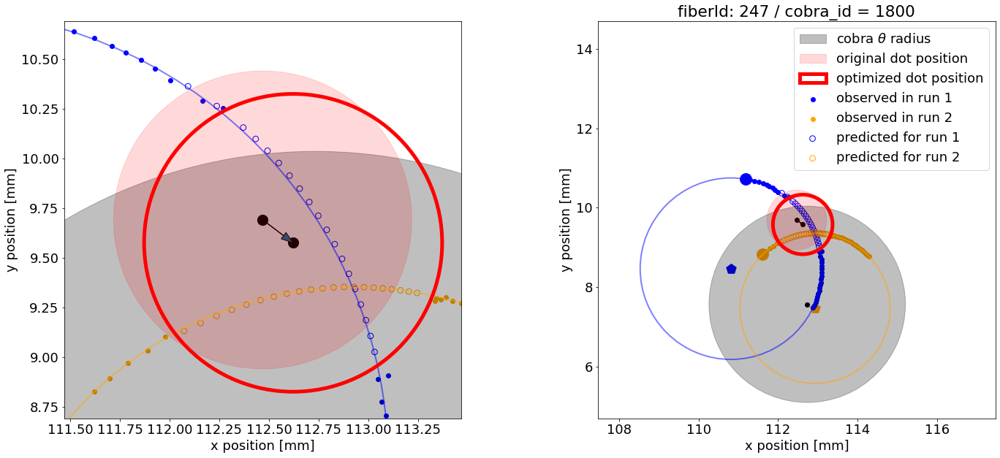

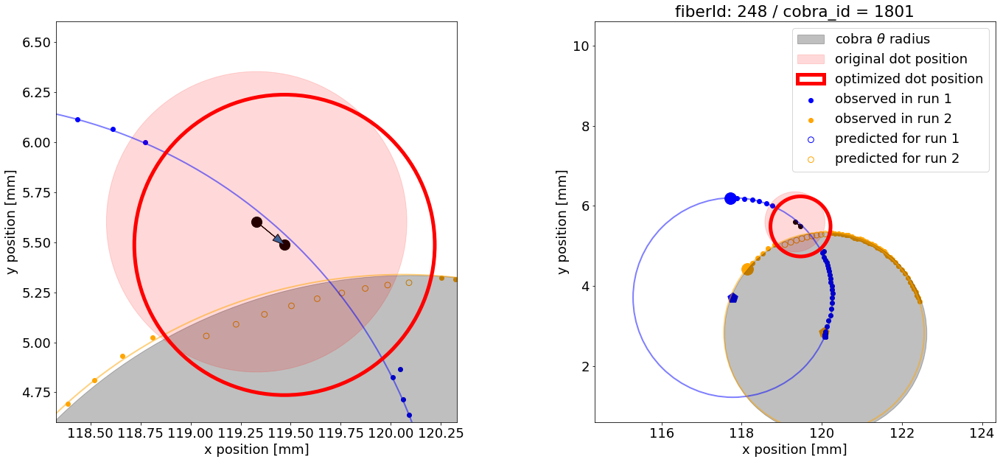

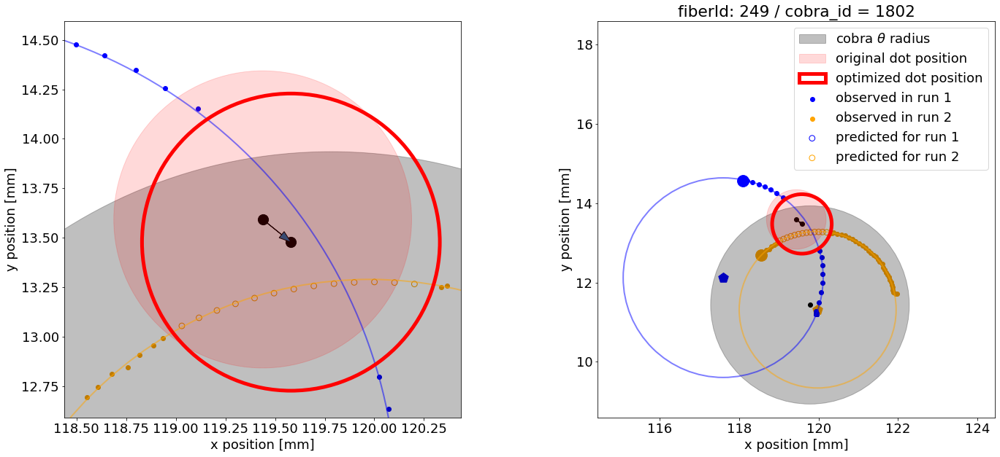

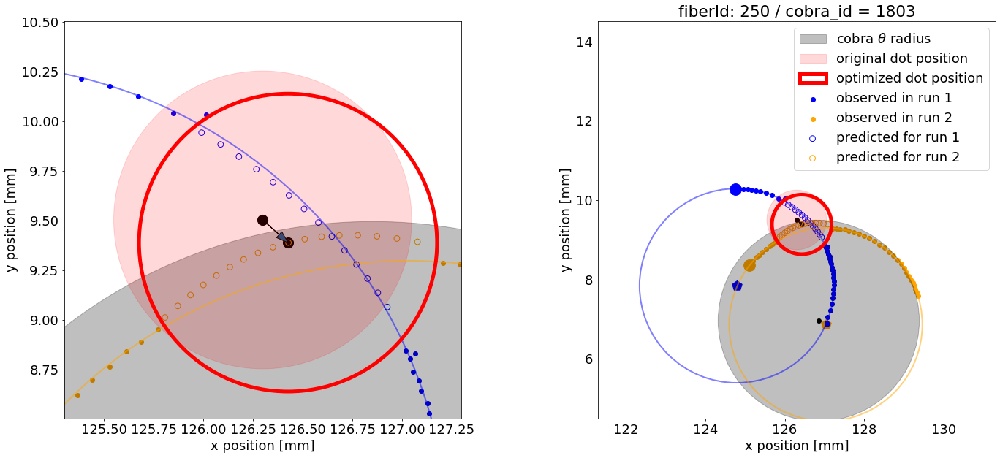

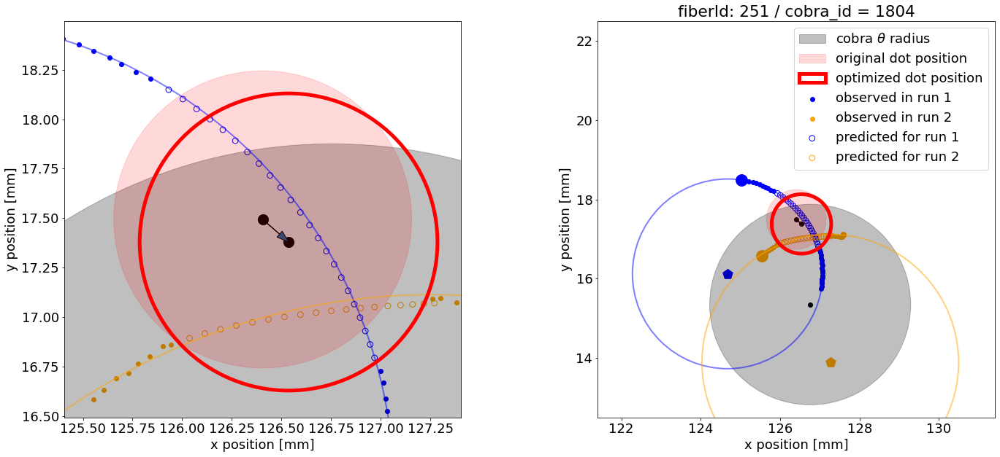

...

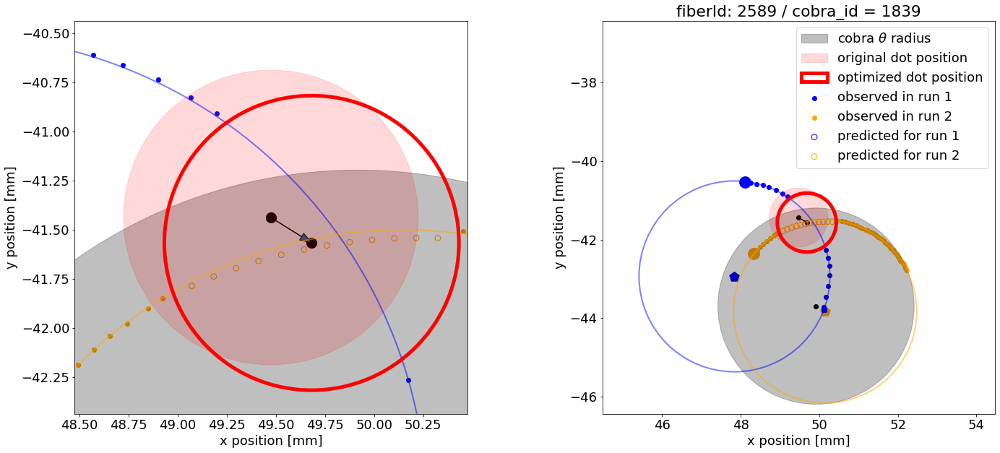

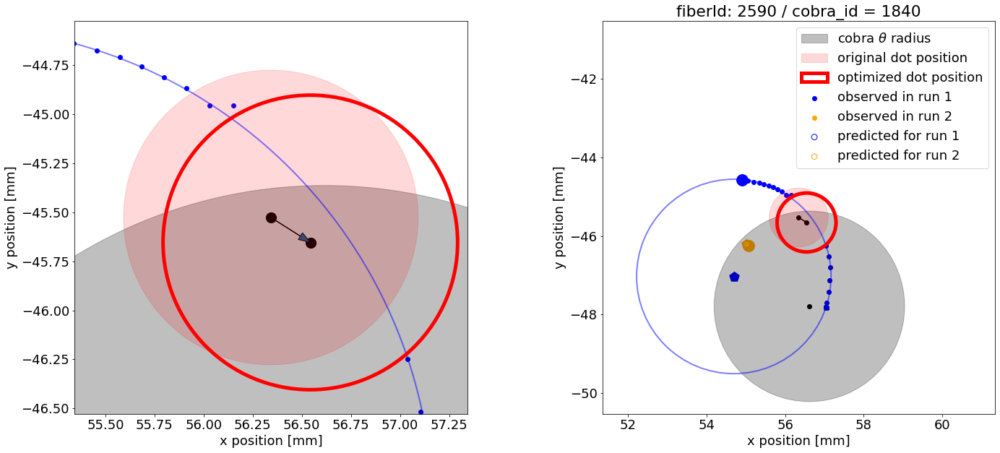

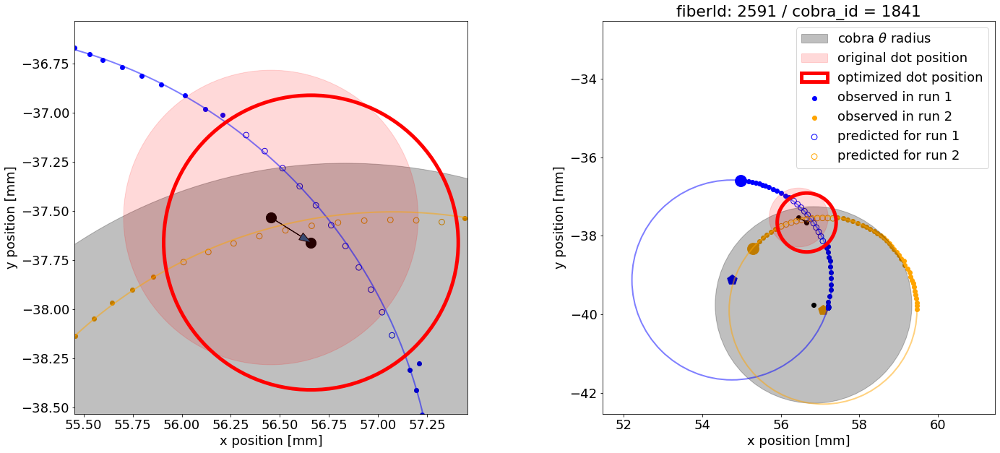

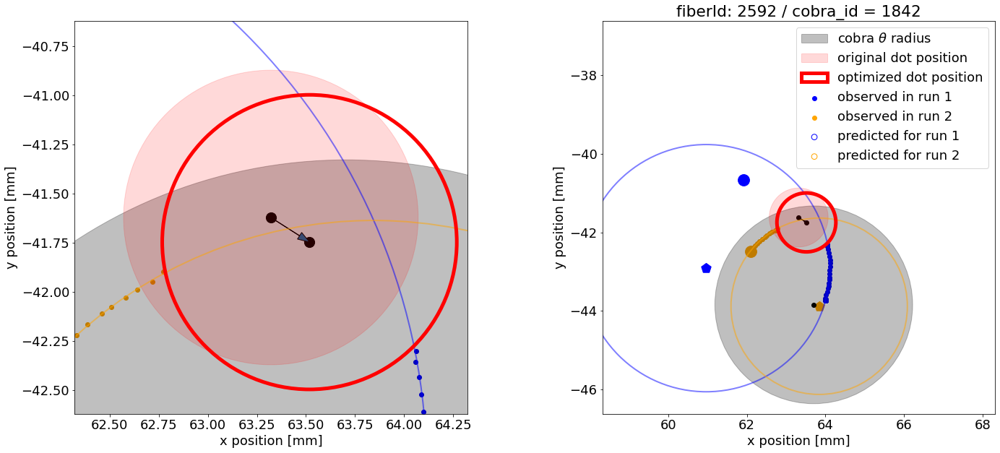

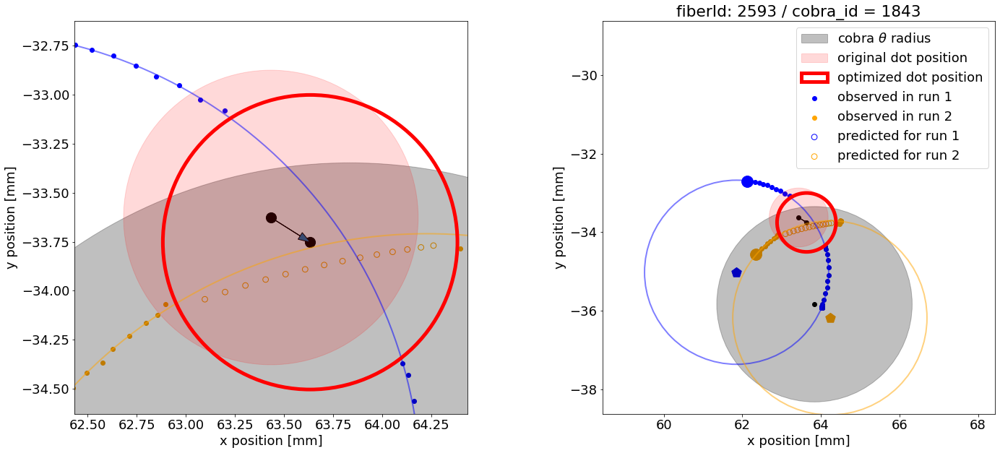

Error in callback <function flush_figures at 0x7f4b6cfbd8c8> (for post_execute):


KeyboardInterrupt: 

In [708]:
for cob_id in tqdm(range(1800,2395)):
    OptimizeBlackDotsVisualize_instance.show_single_cobra(cobra_id=cob_id  - 1)

In [540]:
x_data = mcs_data_all_18[0][cob_id]
y_data = mcs_data_all_18[1][cob_id]

x_data = x_data[~np.isnan(x_data)]
y_data = y_data[~np.isnan(y_data)]

init_x_center = np.mean(x_data)
init_y_center = np.mean(y_data)

In [525]:
mcs_data_all_17[0][cob_id],mcs_data_all_17[1][cob_id]

(array([110.856, 110.951, 111.065, 111.192, 111.301, 111.413, 111.521,
        111.641, 111.739, 111.851, 111.952, 112.04 ,     nan,     nan,
            nan,     nan,     nan,     nan,     nan,     nan,     nan,
            nan,     nan,     nan,     nan,     nan,     nan,     nan,
            nan, 113.179, 113.181, 113.221, 113.248, 113.281, 113.318,
        113.341, 113.37 , 113.386, 113.405, 113.416, 113.423, 113.437,
        113.434, 113.418, 113.424, 113.409, 113.378, 113.34 , 113.316,
        113.28 , 113.221]),
 array([ 2.36193  ,  2.38702  ,  2.38395  ,  2.38469  ,  2.3803   ,
         2.36896  ,  2.3497   ,  2.32854  ,  2.30279  ,  2.2549   ,
         2.21977  ,  2.20405  ,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan,  1.13751  ,
         1.10118  ,  1.01867  ,  0.951913 ,  0.854041 ,  0.770676 ,

In [552]:
x = x_data
y = y_data

x_m = np.mean(x)
y_m = np.mean(y)

In [553]:
from scipy      import optimize

method_2 = "leastsq"

#! python
#  == METHOD 2 ==
from scipy      import optimize

method_2 = "leastsq"

def calc_R(xc, yc):
    """ calculate the distance of each 2D points from the center (xc, yc) """
    return np.sqrt((x-xc)**2 + (y-yc)**2)

def f_2(c):
    """ calculate the algebraic distance between the data points and the mean circle centered at c=(xc, yc) """
    Ri = calc_R(*c)
    return Ri - Ri.mean()

x = x_data
y = y_data

x_m = np.mean(x)
y_m = np.mean(y)

center_estimate = x_m, y_m
center_2, ier = optimize.leastsq(f_2, center_estimate)

xc_2, yc_2 = center_2
Ri_2       = calc_R(*center_2)
R_2        = Ri_2.mean()
residu_2   = sum((Ri_2 - R_2)**2)

In [592]:

def calc_R(x,y,xc, yc):
    """ calculate the distance of each 2D points from the center (xc, yc) """
    return np.sqrt((x-xc)**2 + (y-yc)**2)

def f_2(c,x, y):
    """ calculate the algebraic distance between the data points and the mean circle centered at c=(xc, yc) """
    Ri = calc_R(x,y,*c)
    return Ri - Ri.mean()

def find_xc_yc_r(mcs_data_all, cob_id):
    x_data = mcs_data_all[0][cob_id]
    y_data = mcs_data_all[1][cob_id]

    x = x_data[~np.isnan(x_data)]
    y = y_data[~np.isnan(y_data)]
    
    x_m = np.mean(x)
    y_m = np.mean(y)

    center_estimate = x_m, y_m
    center_2, ier = optimize.leastsq(f_2, center_estimate, args=(x, y))

    xc_2, yc_2 = center_2
    Ri_2       = calc_R(x, y, *center_2)
    R_2        = Ri_2.mean()
    residu_2   = sum((Ri_2 - R_2)**2)
    
    return xc_2, yc_2, R_2, residu_2
    
    

In [669]:
list_of_res = [] 
for cobra_id in range(1, 2395):
    try:
        xc_1, yc_1, R_1, res_1 = find_xc_yc_r(mcs_data_all_17, cobra_id )
        xc_2, yc_2, R_2, res_2 = find_xc_yc_r(mcs_data_all_18, cobra_id )

        list_of_res.append([cobra_id, xc_1, yc_1, R_1, res_1, xc_2, yc_2, R_2, res_2])
    except:
        list_of_res.append([cobra_id, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan])
        
array_of_res = np.array(list_of_res)

/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/work/stack_INFRA-290/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/ipykernel/__main__.py:8: RuntimeWarning: Mean of empty slice.


In [693]:
rad_dot_cross = pd.DataFrame(data=array_of_res[:,1:],    # values
             index=array_of_res[:,:1].ravel(),    # 1st column as index
             columns=['phi_xc', 'phi_yc', 'phi_r', 'phi_residual', 'theta_xc', 'theta_yc', 'theta_r', 'theta_residual'])

rad_dot_cross = rad_dot_cross.rename_axis(index='cobra_id', columns="")
rad_dot_cross[0:5]

,phi_xc,phi_yc,phi_r,phi_residual,theta_xc,theta_yc,theta_r,theta_residual
cobra_id,,,,,,,,
1.0,-6.872249,6.009531,2.281623,0.004157,-4.782656,5.004207,2.317059,0.001278
2.0,-14.108389,2.040968,2.489599,0.002336,-11.836299,1.134411,2.258197,0.002199
3.0,-7.290573,-2.210295,2.621936,0.008493,-4.888899,-2.896079,2.178892,0.001829
4.0,-14.205423,-5.953790,2.481292,0.005382,-11.995521,-6.972212,2.347685,0.001053
5.0,-7.324037,-10.355573,2.655299,0.002874,-7.006366,-8.593596,1.010010,0.002630


In [694]:
rad_dot_cross.to_pickle('/work/ncaplar/BlackDotsData/rad_dot_cross0_77873_77875_v1.pkl')

In [695]:
rad_dot_cross = pd.read_pickle("/work/ncaplar/BlackDotsData/rad_dot_cross0_77873_77875_v1.pkl")

In [696]:
rad_dot_cross

,phi_xc,phi_yc,phi_r,phi_residual,theta_xc,theta_yc,theta_r,theta_residual
cobra_id,,,,,,,,
1.0,-6.872249,6.009531,2.281623,0.004157,-4.782656,5.004207,2.317059,0.001278
2.0,-14.108389,2.040968,2.489599,0.002336,-11.836299,1.134411,2.258197,0.002199
3.0,-7.290573,-2.210295,2.621936,0.008493,-4.888899,-2.896079,2.178892,0.001829
4.0,-14.205423,-5.953790,2.481292,0.005382,-11.995521,-6.972212,2.347685,0.001053
5.0,-7.324037,-10.355573,2.655299,0.002874,-7.006366,-8.593596,1.010010,0.002630
6.0,-14.225613,-13.641448,2.259645,0.000567,-12.102417,-14.890684,2.403115,0.002987
7.0,-7.243179,-18.163390,2.426881,0.010129,-4.714996,-20.267730,3.521362,0.017307
8.0,-14.290507,-22.120388,2.502103,0.002178,-11.937142,-23.157923,2.562525,0.007503
9.0,-7.104123,-26.046335,2.238200,0.001425,-4.430301,-27.785512,3.473151,0.009017


In [643]:
find_xc_yc_r(mcs_data_all_17,1799)

(111.09823923110616,
 0.05323606324014551,
 2.33400473839487,
 0.0012083036057469597)

In [580]:
calc_R(0,0)

array([110.94316679, 111.03572797, 111.14648046, 111.25910243,
       111.34485481, 111.45669625, 111.58859462, 111.73443223,
       113.32610615, 113.41403843, 113.60881004, 113.77606095,
       113.96053065, 114.12665771, 114.28991494, 114.42898569,
       114.54330425, 114.67067486, 114.77905271, 114.88031214,
       114.96760296, 115.06003185, 115.14650509, 115.22291788,
       115.31036422, 115.38092188, 115.46452858, 115.55721589,
       115.62302593, 115.69402097, 115.76219366, 115.80056205,
       115.84407206, 115.88592127, 115.90690899, 115.92998931,
       115.93025375, 115.93075758, 115.92747623, 115.92621755,
       115.89803953, 115.86819795, 115.83845976, 115.81555503])

In [555]:
R_2

2.783850996043977

In [556]:
yc_2

-1.1933919843068979

In [154]:
from pfs.datamodel import PfsDesign
from pfs.utils.fiberids import FiberIds
gfm = pd.DataFrame(FiberIds().data)

phiDesign = PfsDesign.read(2166000543195576900, dirName='/data/pfsDesign/')
thetaDesign = PfsDesign.read(1438296865955205244, dirName='/data/pfsDesign/')

In [155]:
fiberId, = gfm.query(f'cobraId=={cobra_id}').fiberId
[[phiX, phiY]] = phiDesign.pfiNominal[phiDesign.fiberId==fiberId]
[[thetaX, thetaY]] = thetaDesign.pfiNominal[thetaDesign.fiberId==fiberId]

NameError: name 'cobra_id' is not defined

/software/devel/pfs/ics_cobraCharmer/python/ics/cobraCharmer/pfiDesign.py:286: RuntimeWarning: divide by zero encountered in true_divide
  self.S1Nm[i] = angularStep / np.array(list(map(float, slowJoint1Rev)))
/software/devel/pfs/ics_cobraCharmer/python/ics/cobraCharmer/pfiDesign.py:288: RuntimeWarning: divide by zero encountered in true_divide
  self.S2Nm[i] = angularStep / np.array(list(map(float, slowJoint2Rev)))
/software/devel/pfs/ics_cobraCharmer/python/ics/cobraCharmer/pfiDesign.py:290: RuntimeWarning: divide by zero encountered in true_divide
  self.F1Nm[i] = angularStep / np.array(list(map(float, fastJoint1Rev)))


In [456]:
x

array([ -4.99176267, -12.06321279,  -5.11673153, ..., 187.70339362,
       194.7363139 , 194.70276471])

In [462]:
getCobraGeometry_cobra_id_new

,center_x_mm,center_y_mm,cobra_geometry_calib_id,motor_phi_length_mm,motor_phi_limit_in,motor_phi_limit_out,motor_theta_length_mm,motor_theta_limit0,motor_theta_limit1,status
cobra_id,,,,,,,,,,
1,-4.991763,5.130035,1,2.36357,-3.16067,0.042516,2.44101,1.284500,1.579080,1
2,-12.063213,1.252377,1,2.57072,-3.39429,-0.224042,2.54174,4.252860,4.634890,1
3,-5.116732,-2.871326,1,2.53064,-3.19500,0.050450,2.52678,4.675260,5.031330,1
4,-12.206385,-6.824614,1,2.49502,-3.18487,0.074744,2.49076,0.424679,0.810555,1
5,-5.217146,-10.898854,1,2.67355,-3.18773,0.046345,2.46998,3.264020,3.649320,1
6,-12.342576,-14.741909,1,2.35982,-3.18512,0.024250,2.54309,6.006990,0.106468,1
7,-5.267778,-18.980981,1,2.48240,-3.20920,-0.002934,2.47905,2.200500,2.671000,1
8,-12.195205,-22.829226,1,2.55518,-3.11520,0.041740,2.54426,2.195840,2.572480,1
9,-5.183698,-26.953583,1,2.33192,-3.19156,0.004050,2.57523,2.435250,2.833790,1


In [750]:
2+2

4

In [25]:
?? OptimizeBlackDots_custom.find_optimized_dots

Signature:
 OptimizeBlackDots_custom.find_optimized_dots(
    self,
    scal_var=array([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]),
    scal_var_bounds=array([[ 0.9 ,  1.1 ],
       [-0.1 ,  0.1 ],
       [-0.5 ,  0.5 ],
       [-1.  ,  1.  ],
       [-0.1 ,  0.1 ],
       [-0.5 ,  0.5 ],
       [ 0.9 ,  1.1 ],
       [-0.1 ,  0.1 ],
       [-0.5 ,  0.5 ],
       [-1.  ,  1.  ],
       [-0.1 ,  0.1 ],
       [-0.5 ,  0.5 ],
       [-2.  ,  2.  ],
       [-2.  ,  2.  ],
       [-0.02,  0.02],
       [-0.02,  0.02]]),
    max_iter=1000,
    rand_val=1234,
)
Source:   
    def find_optimized_dots(self, scal_var=np.array([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0 ,0]),
                            scal_var_bounds=np.array([(0.9, 1.1), (-0.1, 0.1),
                                                      (-0.5, 0.5), (-1, 1),
                                                      (-0.1, 0.1), (-0.5, 0.5),
                                                      (0.9, 1.1), (-0.1, 0.1),
                

In [26]:
bool('False')

True

In [27]:
import ast

In [29]:
type(ast.literal_eval('False'))

bool